###  Impaired maturation of wild-type superoxide dismutase 1 is associated with neurodegeneration in Parkinson disease brain and a novel murine model

##### Image analysis workflow

In [1]:
import tifffile 
from matplotlib import pyplot as plt
from skimage import (exposure, feature, filters, io, measure,
                      morphology, restoration, segmentation, transform,
                      util)
import numpy as np
from skimage.morphology import remove_small_objects, dilation, erosion, ball  
from skimage.feature import peak_local_max
from scipy import ndimage as ndi
from skimage.measure import label
import cv2
#from aicssegmentation.core.seg_dot import dot_3d, dot_3d_wrapper 
#from aicssegmentation.core.pre_processing_utils import intensity_normalization, image_smoothing_gaussian_slice_by_slice
import skimage.io
from skimage.measure import label, regionprops, regionprops_table
#import skimage.measure
import pandas as pd
from pathlib import Path
import glob
import seaborn as sns
import nd2
from skimage import img_as_uint
from skimage.util import invert
from vedo import Volume
import pytrax as pt
import pyvista as pv
import os

##### The folder "IMAGES" contains the imaging data. For each replicate there is the nd2 file, a coresponding "cell" mask and a "protein" mask.  

In [2]:
os.chdir('G:\\D\\AMR_PHD_PROJECT\\OUT\\')
rootdir = Path('G:\\D\\AMR_PHD_PROJECT\\IMAGES')
file_list = [f for f in rootdir.resolve().glob('**/*') if f.is_file()]
file_list=pd.DataFrame(data=file_list)
file_list.columns = ['Data_Path']
file_list = file_list.applymap(str)
file_list['TEXT_1'] = file_list['Data_Path'].str.lstrip(r"G:\\D\AMR_PHD_PROJECT\IMAGES\Mouse\*")
file_list=file_list.assign(IMAGE_ID=file_list['TEXT_1'].str.extract('(.*)M'))
file_list['IMAGE_ID'] = file_list['IMAGE_ID'].str.replace('\\', '')
file_list['IMAGE_ID'] = "MS" + file_list['IMAGE_ID'] 
file_list=file_list.dropna()
UNIQUE_ID =np.unique(file_list['IMAGE_ID'].astype(str))
out='G:\\D\\AMR_PHD_PROJECT\\OUT\\'
ref_df = pd.read_csv('G:\\D\\AMR_PHD_PROJECT\\sod1_mouse_ref.csv')
#141-ROI3 eg of image name
ref_df['ID'] = ref_df['Folder name'].astype(str)
ref_df['IMAGE_ID'] = ref_df['Folder name']

##### Create empty folders to hold information as the loop runs

In [3]:
Cell_Volume = []
Void_Volume = []
Protein_in_Cell_Volume = []
Protein_in_Void_Volume = []

##### Run the image processing steps

Images from folder
1    MS100-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(16, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 12 13 14 15 16 17 18 19]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


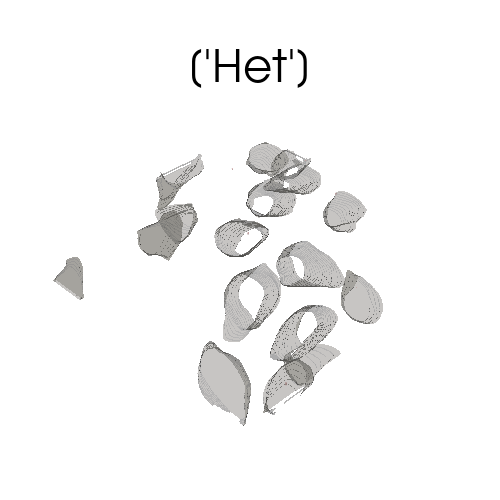

Protein Volume Inside Cells'
0    0.062714
1    0.021950
2    0.012543
3    0.116020
4    0.144242
5    0.018814
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.078392
1    0.003136
2    0.081528
3    0.003136
4    0.012543
5    0.018814
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      356.458791
1      806.499069
2      411.863270
3      587.697000
4      882.950289
5     1218.346661
6      225.791518
7      841.995062
8      151.572908
9      402.192807
10     646.873713
11     928.659219
12     447.732411
13     451.429387
14     412.286588
15     386.984718
16     130.877364
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    43317.911612
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
4    MS100-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(15, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20]
VoxelSize(x=0

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


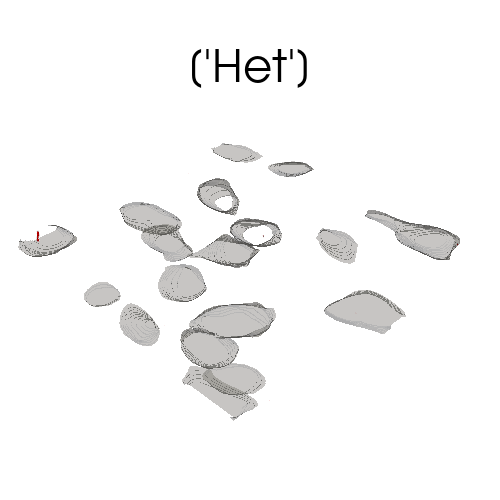

Protein Volume Inside Cells'
0    2.489737
1    0.025086
2    0.006271
3    0.047035
4    0.015678
5    0.094071
6    0.037628
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.043900
1     0.003136
2     0.003136
3     0.006271
4     0.006271
5     0.003136
6     0.003136
7     0.003136
8     0.003136
9     0.003136
10    0.003136
11    0.006271
12    0.003136
13    0.003136
14    0.003136
15    0.006271
16    0.003136
17    0.053307
18    0.003136
19    0.018814
20    0.015678
21    0.003136
22    0.003136
23    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     447.475284
1     747.140486
2     691.980591
3     375.376400
4     484.899726
5     526.529126
6     310.085095
7     654.534199
8     416.021193
9      67.984861
10    182.688345
11    110.846587
12    123.113400
13    172.616513
14    242.363631
15    949.633839
16    440.821353
17    182.813772
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0   

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


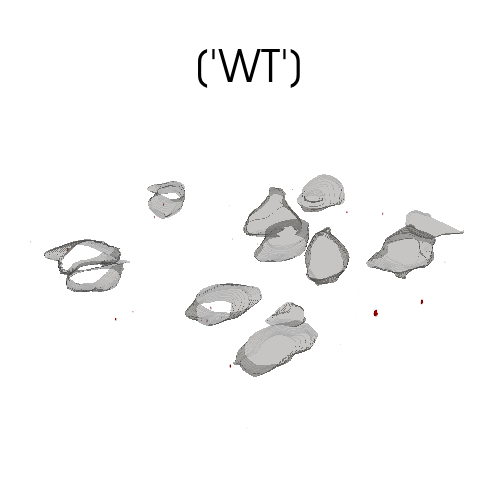

Protein Volume Inside Cells'
0    0.009407
1    0.125428
2    0.279076
3    0.109749
4    0.122292
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.025086
1     0.003136
2     0.012543
3     0.006271
4     0.159920
5     0.003136
6     0.003136
7     0.015678
8     0.047035
9     0.159920
10    0.147377
11    0.009407
12    0.025086
13    0.053307
14    0.003136
15    0.003136
16    0.006271
17    0.169327
18    0.003136
19    0.021950
20    0.464082
21    0.021950
22    1.567844
23    0.003136
24    0.043900
25    0.009407
26    0.116020
27    0.025086
28    0.003136
29    0.003136
30    0.012543
31    0.015678
32    0.018814
33    0.015678
34    0.018814
35    0.012543
36    0.025086
37    0.012543
38    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      489.324182
1      889.782954
2      859.394997
3     1110.435078
4     1206.145697
5      884.420927
6      704.930984
7      118.980562
8      182.562917
9      614.2

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


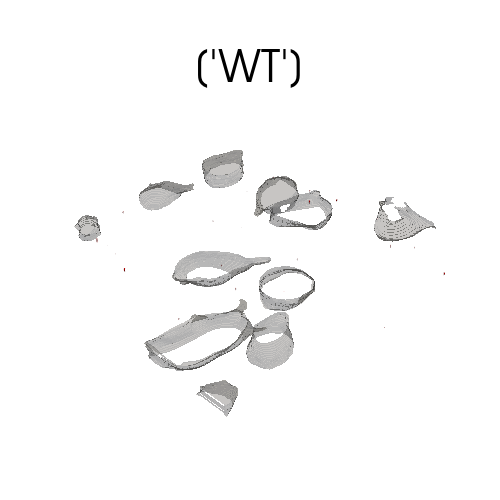

Protein Volume Inside Cells'
0    0.037628
1    0.059578
2    0.028221
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.072121
1     0.003136
2     0.003136
3     0.106613
4     0.003136
5     0.059578
6     0.059578
7     0.006271
8     0.003136
9     0.003136
10    0.147377
11    0.006271
12    0.153649
13    0.028221
14    0.025086
15    0.219498
16    0.075257
17    0.247719
18    0.181870
19    0.100342
20    0.059578
21    0.012543
22    0.012543
23    0.075257
24    0.056442
25    0.075257
26    0.025086
27    0.009407
28    0.006271
29    0.006271
30    0.003136
31    0.006271
32    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      955.748432
1     1283.205241
2     1053.619539
3     1123.796247
4     1018.575085
5      662.147651
6     1728.360115
7      176.451460
8      858.767859
9      435.547125
10     219.896424
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    49668.022507
Name: Void_Volu

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


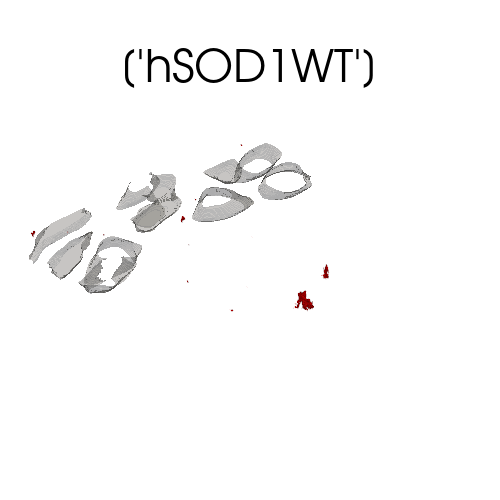

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0     0.357468
1     0.263398
2     0.056442
3     0.103478
4     0.021950
        ...   
63    0.006271
64    0.003136
65    0.003136
66    0.003136
67    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 68, dtype: float64
Cell Volume
0     946.585950
1     736.946363
2     725.419572
3     247.672352
4     602.927039
5     398.649479
6     293.973928
7     299.382990
8     319.197405
9      55.661606
10    270.130153
11    369.089344
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    44054.478557
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
18    MS102-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(18, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8]


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


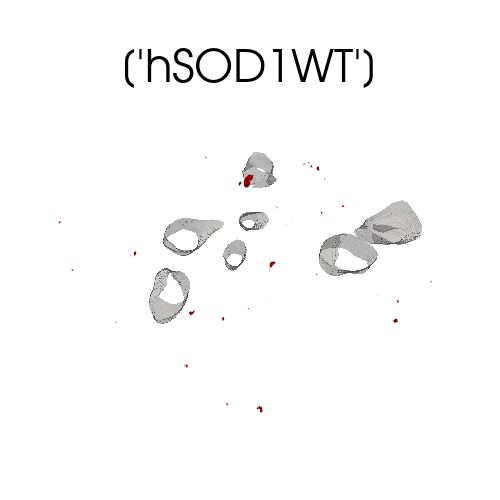

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0      0.006271
1      0.003136
2      0.009407
3      0.009407
4      0.006271
         ...   
100    0.395097
101    0.034493
102    0.003136
103    0.003136
104    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 105, dtype: float64
Cell Volume
0     837.282122
1     560.033957
2     856.735933
3     274.325704
4     241.545217
5    1056.404031
6     878.227942
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    54479.582781
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
21    MS106(273)-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(37, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 16 17 18 19 20 21 22 23 24 25
 26]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


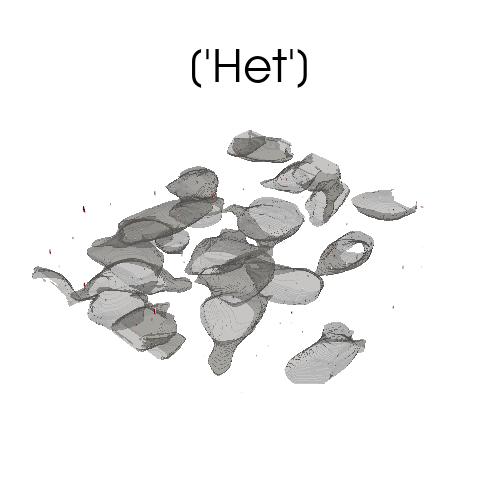

Protein Volume Inside Cells'
0      0.015678
1      0.021950
2      0.009407
3      0.021950
4      0.072121
         ...   
129    0.062714
130    0.009407
131    0.018814
132    0.037628
133    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 134, dtype: float64
Protein Volume Inside Void'
0     0.065849
1     0.395097
2     0.075257
3     0.009407
4     0.034493
        ...   
66    0.028221
67    0.109749
68    0.003136
69    0.003136
70    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 71, dtype: float64
Cell Volume
0      968.711368
1     1301.204092
2     2422.811629
3     1637.262094
4     1025.188252
5      892.915507
6      935.388407
7     1659.403191
8     1754.129203
9     1413.314361
10    1096.650592
11     779.764189
12    1264.331532
13    1267.912488
14    1843.041649
15    1880.945851
16    1823.095535
17    1102.050248
18    1107.772879
19     176.592566
20     426.541428
21     324.838509
22    1631.846761
23     520.198171
Name: Cell_Volume_Voxel_Resolve

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


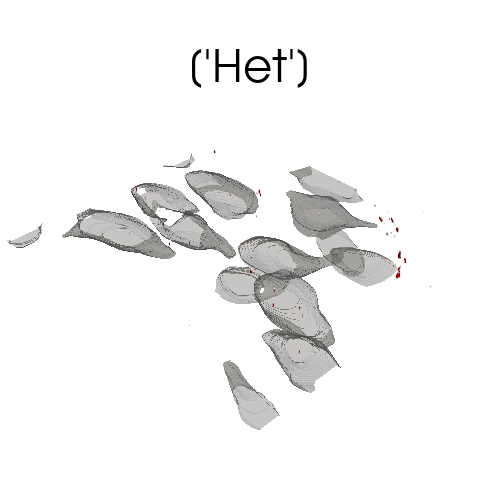

Protein Volume Inside Cells'
0     0.062714
1     0.075257
2     0.003136
3     0.072121
4     0.040764
5     0.003136
6     0.072121
7     0.009407
8     0.056442
9     0.050171
10    0.307297
11    0.021950
12    0.163056
13    0.213227
14    0.244584
15    0.003136
16    0.172463
17    0.153649
18    0.072121
19    0.131699
20    0.025086
21    0.028221
22    0.159920
23    0.037628
24    0.119156
25    0.137970
26    0.056442
27    0.025086
28    0.175599
29    0.125428
30    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.442132
1     0.137970
2     0.012543
3     0.040764
4     0.009407
        ...   
71    0.003136
72    0.018814
73    0.003136
74    0.003136
75    0.009407
Name: Proten_Volume_Voxel_Resolved, Length: 76, dtype: float64
Cell Volume
0      103.283306
1       88.975160
2     1725.973856
3     1789.205014
4     2609.008809
5     2339.543422
6      248.898406
7      208.366497
8     1506.983647
9     1869.632287
10     

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


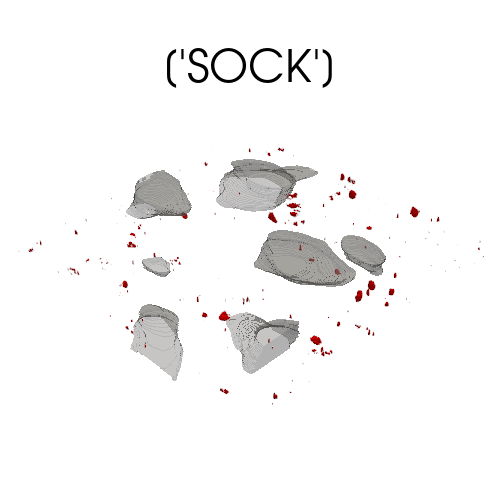

Protein Volume Inside Cells'
0    0.953249
1    0.003136
2    0.047035
3    0.313569
4    0.009407
5    0.043900
6    0.078392
7    0.025086
8    0.003136
9    0.065849
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.573831
1      3.364594
2      0.498574
3      0.175599
4      0.790193
         ...   
462    0.009407
463    0.003136
464    0.003136
465    0.006271
466    0.009407
Name: Proten_Volume_Voxel_Resolved, Length: 467, dtype: float64
Cell Volume
0    2720.121929
1    1587.382698
2     495.470132
3    2085.957161
4     421.091602
5    1007.336778
6      93.882512
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    77076.956068
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
30    MS108-9_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(22, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


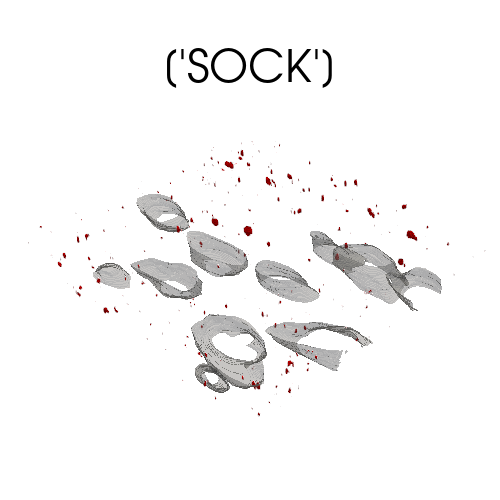

Protein Volume Inside Cells'
0     0.006271
1     0.003136
2     0.006271
3     0.037628
4     0.068985
5     0.006271
6     0.009407
7     0.667902
8     0.332383
9     0.075257
10    0.018814
11    0.153649
12    0.178734
13    0.633409
14    0.009407
15    0.379418
16    0.006271
17    0.003136
18    0.003136
19    0.047035
20    0.272805
21    0.003136
22    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.191277
1      0.062714
2      0.006271
3      0.188141
4      0.009407
         ...   
690    0.021950
691    0.003136
692    0.006271
693    0.009407
694    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 695, dtype: float64
Cell Volume
0      961.038338
1      981.238443
2      881.326002
3     1267.442135
4      357.832223
5      795.831457
6      167.646447
7      687.998267
8     1395.804677
9     1846.801339
10     241.404111
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    62751.804845
Name: Void_Volume_

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


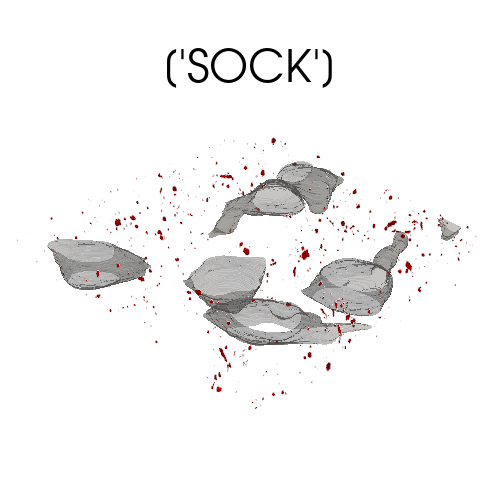

Protein Volume Inside Cells'
0     0.630273
1     0.065849
2     0.003136
3     0.084664
4     0.031357
5     0.003136
6     0.012543
7     0.363740
8     0.047035
9     0.034493
10    0.028221
11    0.031357
12    0.081528
13    0.191277
14    0.003136
15    0.103478
16    0.043900
17    0.003136
18    0.003136
19    0.006271
20    0.012543
21    0.025086
22    0.012543
23    0.003136
24    0.172463
25    0.025086
26    0.125428
27    0.025086
28    0.285348
29    0.009407
30    0.413911
31    0.040764
32    0.003136
33    0.018814
34    0.517389
35    0.018814
36    0.003136
37    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.043900
1       0.263398
2       0.034493
3       0.112885
4       0.018814
          ...   
1548    0.003136
1549    0.003136
1550    0.003136
1551    0.003136
1552    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 1553, dtype: float64
Cell Volume
0     2103.495067
1     2545.815279
2     2085.731392
3   

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


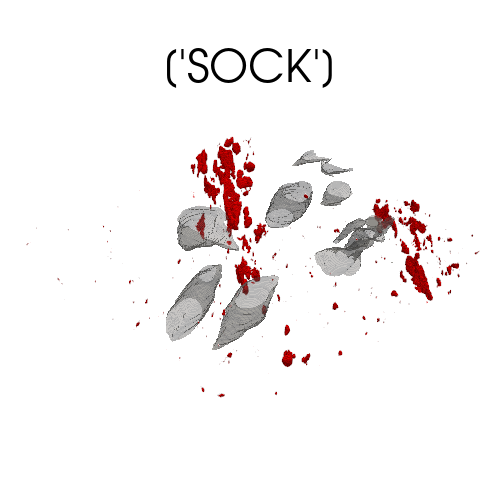

Protein Volume Inside Cells'
0     0.899943
1     0.078392
2     0.053307
3     0.216363
4     0.009407
5     0.003136
6     0.006271
7     0.003136
8     0.003136
9     0.003136
10    0.003136
11    0.012543
12    0.009407
13    0.056442
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       29.923875
1       17.105180
2      450.084177
3        0.222634
4        0.134835
          ...    
688      0.003136
689      0.003136
690      0.003136
691      0.144242
692      0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 693, dtype: float64
Cell Volume
0      115.173837
1      145.075762
2     1605.149509
3      248.246183
4      300.618451
5      424.754086
6       60.766506
7       44.620847
8       55.260238
9       88.602013
10    1327.979736
11    1523.891279
12    1528.227936
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    130627.954887
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
39  

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


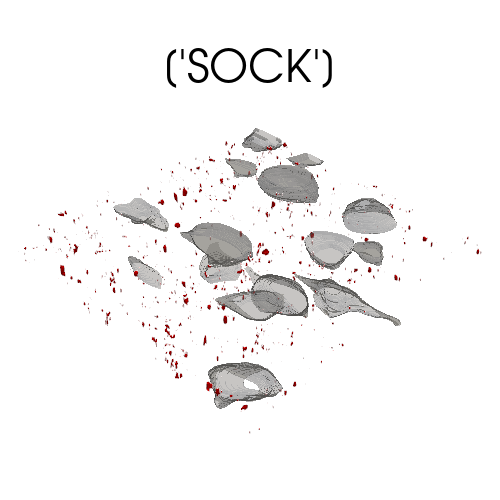

Protein Volume Inside Cells'
0     0.003136
1     0.068985
2     0.009407
3     0.006271
4     0.078392
5     0.006271
6     0.279076
7     0.021950
8     0.006271
9     0.003136
10    0.103478
11    0.003136
12    0.068985
13    0.003136
14    0.028221
15    0.006271
16    0.006271
17    0.037628
18    0.097206
19    0.053307
20    0.021950
21    0.072121
22    0.037628
23    0.065849
24    0.012543
25    0.003136
26    0.018814
27    0.003136
28    0.006271
29    0.025086
30    0.003136
31    0.018814
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.373147
1       1.514538
2       0.163056
3       0.003136
4       0.040764
          ...   
1564    0.003136
1565    0.081528
1566    0.012543
1567    0.003136
1568    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 1569, dtype: float64
Cell Volume
0      411.389782
1      296.601635
2      110.476575
3     1475.654983
4      777.268181
5      856.190323
6     1427.174104
7     1143.011746
8   

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


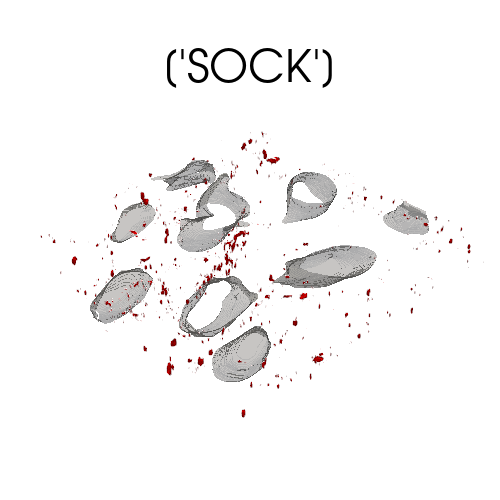

Protein Volume Inside Cells'
0     0.006271
1     0.003136
2     0.003136
3     0.003136
4     0.003136
        ...   
69    0.219498
70    0.003136
71    0.009407
72    0.003136
73    0.031357
Name: Proten_Volume_Voxel_Resolved, Length: 74, dtype: float64
Protein Volume Inside Void'
0       1.041049
1       0.021950
2       0.003136
3       0.003136
4       0.003136
          ...   
1288    0.003136
1289    0.003136
1290    0.009407
1291    0.003136
1292    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 1293, dtype: float64
Cell Volume
0    2057.961735
1    1697.144337
2    1336.452366
3     378.725315
4    1940.254262
5    2292.134948
6    1304.527922
7    1207.437601
8     469.346711
9     883.652683
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    75208.56865
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
46    MS112-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(27, 1024, 1024)
Number of unique cells

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


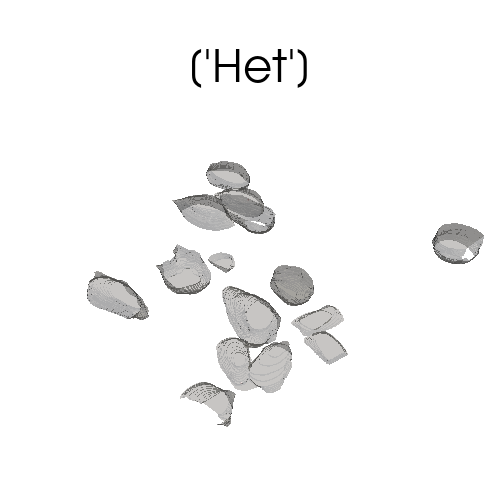

Protein Volume Inside Cells'
0    0.050171
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.003136
1    0.003136
2    0.028221
3    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     254.636716
1     216.669800
2     919.195711
3     479.211587
4     665.888527
5      54.852598
6     829.728249
7     811.550663
8     720.007374
9     430.429682
10    635.801597
11    906.878727
12    282.005005
13    115.042138
14    119.548122
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    81334.760033
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
49    MS112-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


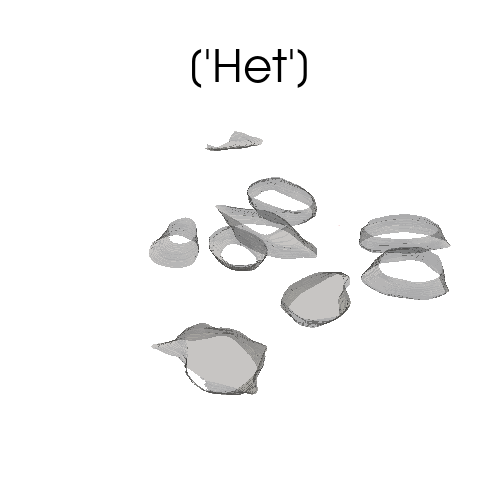

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1569.992170
1    1102.997225
2    1497.833708
3    1233.573564
4    1289.699251
5     930.653517
6    1493.277552
7     698.186118
8     216.785821
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    55727.154058
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
52    MS114-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


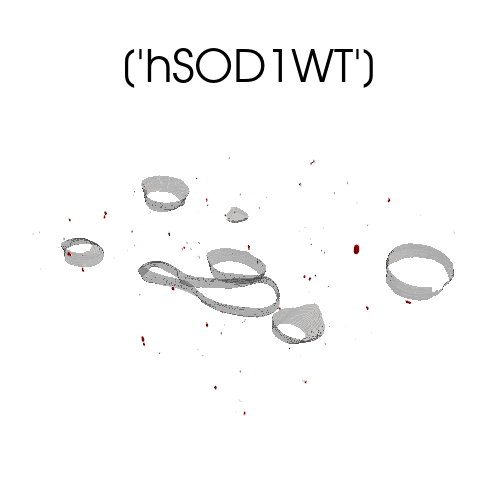

Protein Volume Inside Cells'
0    0.075257
1    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.006271
1      0.068985
2      0.178734
3      0.100342
4      0.031357
         ...   
399    0.003136
400    0.006271
401    0.009407
402    0.009407
403    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 404, dtype: float64
Cell Volume
0     877.478512
1     477.038555
2     795.800100
3    1914.958663
4      50.089487
5    1674.993834
6     547.757736
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    49558.01315
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
55    MS114-8_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8 9]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


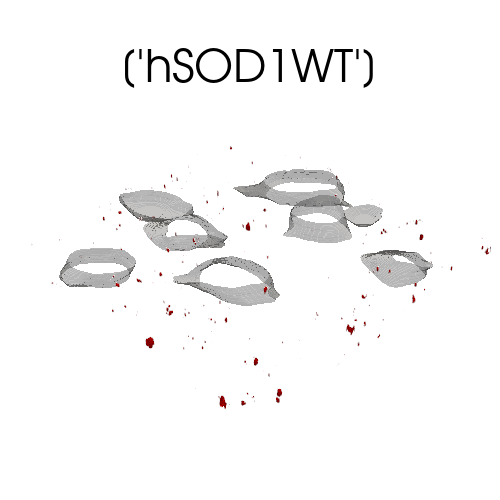

Protein Volume Inside Cells'
0     0.081528
1     0.006271
2     0.006271
3     0.307297
4     0.003136
5     0.003136
6     0.021950
7     0.238312
8     0.015678
9     0.003136
10    0.018814
11    0.006271
12    0.006271
13    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.015678
1      0.037628
2      0.003136
3      0.003136
4      0.003136
         ...   
570    0.003136
571    0.009407
572    0.006271
573    0.003136
574    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 575, dtype: float64
Cell Volume
0    2263.499841
1    1496.306627
2     208.905836
3    1854.047915
4    1417.168122
5    1337.568671
6     853.766436
7    1039.725304
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    55289.164231
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
58    MS115-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(16, 1024, 1024)
Number of unique cells:
[ 0  2  3 

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


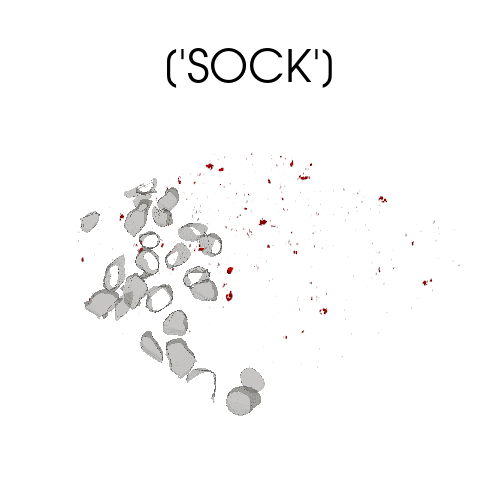

Protein Volume Inside Cells'
0     0.062714
1     5.217786
2     0.075257
3     0.012543
4     0.012543
5     0.050171
6     0.137970
7     0.012543
8     0.087799
9     0.037628
10    0.062714
11    0.050171
12    0.062714
13    0.100342
14    0.025086
15    0.012543
16    0.150513
17    0.037628
18    0.025086
19    0.012543
20    0.050171
21    0.012543
22    0.012543
23    2.194982
24    0.025086
25    0.137970
26    0.376283
27    0.050171
28    0.025086
29    0.025086
30    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.012543
1      0.025086
2      0.050171
3      0.551881
4      0.012543
         ...   
942    0.012543
943    0.012543
944    0.012543
945    0.012543
946    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 947, dtype: float64
Cell Volume
0      831.572033
1      786.129636
2      763.866248
3     1057.078204
4      619.737465
5      685.436409
6      531.285965
7      140.616813
8      507.667960
9       96.54

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


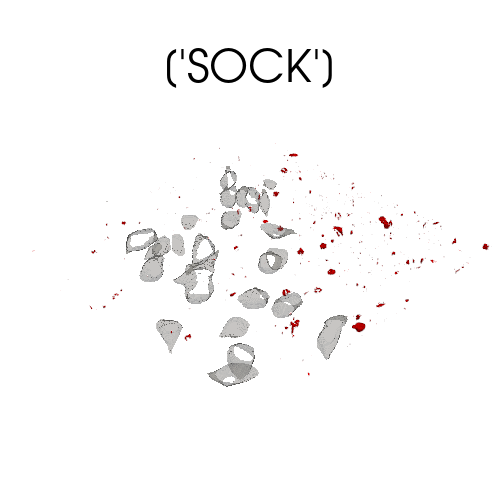

Protein Volume Inside Cells'
0     0.012543
1     0.037628
2     0.213227
3     0.112885
4     0.112885
5     0.025086
6     0.012543
7     0.075257
8     0.137970
9     0.012543
10    0.012543
11    0.025086
12    0.037628
13    0.288483
14    0.012543
15    0.163056
16    0.012543
17    0.175599
18    0.012543
19    0.012543
20    0.025086
21    0.150513
22    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.012543
1       0.915621
2       0.025086
3       0.338654
4       0.012543
          ...   
1036    0.012543
1037    0.012543
1038    0.012543
1039    0.012543
1040    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 1041, dtype: float64
Cell Volume
0     2303.276049
1      523.246060
2     1653.686831
3     1266.918475
4     1740.269460
5      380.095611
6      137.995377
7      148.995372
8      152.143603
9      648.924453
10     357.970193
11     821.751057
12     951.756700
13     873.301775
14     609.778518
15     957.47

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


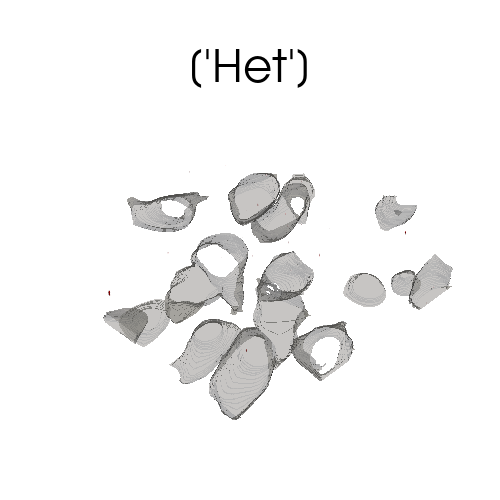

Protein Volume Inside Cells'
0     0.012543
1     0.006271
2     0.040764
3     0.078392
4     0.043900
5     0.053307
6     0.081528
7     0.006271
8     0.040764
9     0.012543
10    0.003136
11    0.122292
12    0.053307
13    0.018814
14    0.021950
15    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.009407
1     0.025086
2     0.106613
3     0.009407
4     0.006271
5     0.006271
6     0.003136
7     0.062714
8     0.417047
9     0.018814
10    0.047035
11    0.025086
12    0.147377
13    0.006271
14    0.018814
15    0.009407
16    0.021950
17    0.003136
18    0.006271
19    0.006271
20    0.006271
21    0.037628
22    0.053307
23    0.006271
24    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1848.171635
1     2173.160657
2     1725.114678
3     2214.028085
4     1039.261222
5      432.358130
6      311.449119
7     1174.519143
8     2022.192937
9     1105.207886
10    1388.718021
11     766.89532

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


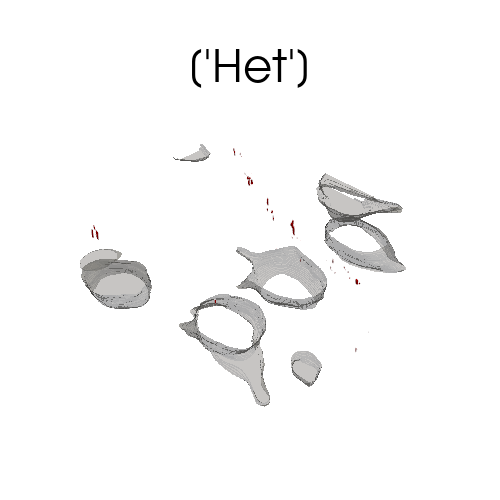

Protein Volume Inside Cells'
0    0.006271
1    0.257126
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.003136
1     0.062714
2     0.012543
3     1.273090
4     0.834093
        ...   
58    0.053307
59    0.050171
60    0.034493
61    0.018814
62    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 63, dtype: float64
Cell Volume
0    1308.535332
1     118.601144
2      47.352031
3     188.188342
4    1764.386040
5    1877.377437
6    1838.548207
7    1452.497924
8     129.983693
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    66898.705781
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
70    MS128-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(30, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


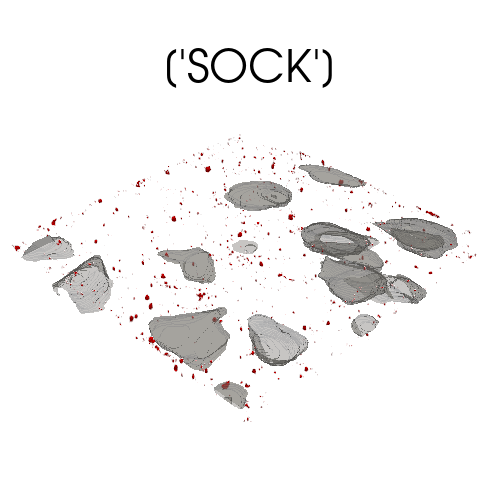

Protein Volume Inside Cells'
0     0.376283
1     0.003136
2     0.072121
3     0.009407
4     0.050171
        ...   
70    0.003136
71    0.059578
72    0.003136
73    0.003136
74    0.009407
Name: Proten_Volume_Voxel_Resolved, Length: 75, dtype: float64
Protein Volume Inside Void'
0       2.129132
1       0.783922
2       0.881128
3       2.295324
4       0.865450
          ...   
2044    0.006271
2045    0.056442
2046    0.012543
2047    0.028221
2048    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 2049, dtype: float64
Cell Volume
0     1304.082654
1       41.312695
2     1419.422682
3      250.121325
4     1192.427060
5      177.091141
6      886.339968
7       71.521918
8      436.020614
9      259.362199
10     686.254824
11      50.550433
12     246.957415
13     646.506837
14      22.981461
15    1104.329893
16     241.457418
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    89603.488941
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next I

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


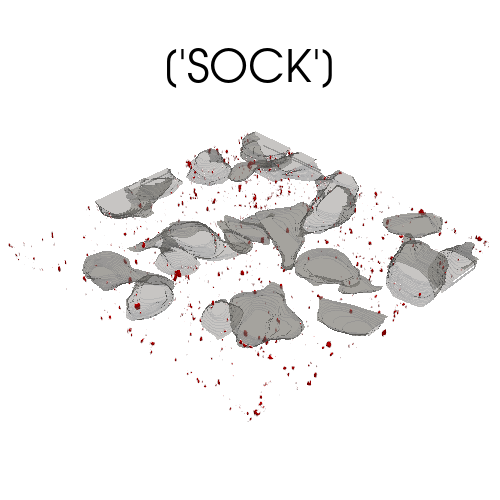

Protein Volume Inside Cells'
0      0.043900
1      0.009407
2      0.006271
3      0.119156
4      0.015678
         ...   
171    0.003136
172    0.031357
173    0.006271
174    0.009407
175    0.015678
Name: Proten_Volume_Voxel_Resolved, Length: 176, dtype: float64
Protein Volume Inside Void'
0       2.016248
1       0.473489
2       0.943842
3       0.517389
4       0.238312
          ...   
2251    0.062714
2252    0.003136
2253    0.003136
2254    0.003136
2255    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 2256, dtype: float64
Cell Volume
0      309.994160
1     1699.282876
2      461.335027
3      233.169793
4     1126.044536
5      342.743290
6       90.502240
7      516.218982
8     1500.458279
9      625.246869
10     782.197483
11     780.736252
12     626.269104
13     200.709146
14     142.871373
15    1445.574324
16     364.432847
17     169.496503
18     880.172069
19     818.819189
20     153.818061
21     841.358517
22     367.690827
23     318.742731
24     

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


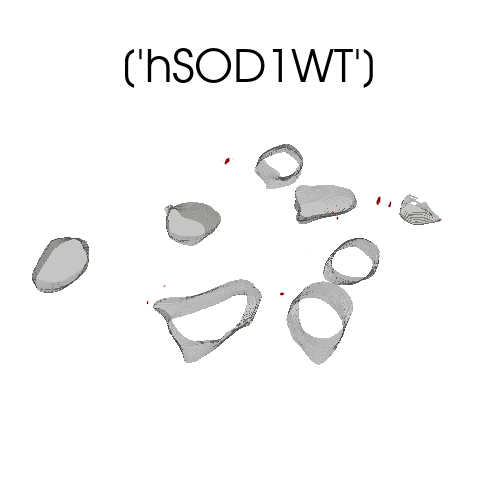

Protein Volume Inside Cells'
0    0.235177
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.003136
1     0.006271
2     0.003136
3     1.705815
4     0.012543
5     0.357468
6     0.006271
7     0.025086
8     0.003136
9     0.043900
10    0.009407
11    0.003136
12    0.003136
13    0.003136
14    0.686716
15    0.018814
16    0.003136
17    0.003136
18    0.642816
19    0.250855
20    0.003136
21    0.012543
22    2.370580
23    0.018814
24    0.097206
25    0.037628
26    0.003136
27    0.166191
28    0.015678
29    0.003136
30    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     998.955083
1    1196.199293
2    1561.623018
3    2287.961347
4     259.196007
5    1345.081781
6     894.630728
7    1457.825459
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    55758.68027
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
79    MS129-4_Python
Name: IMAGE_ID, dtype: ob

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


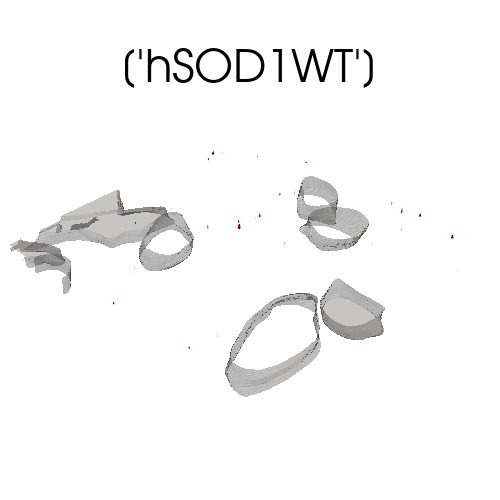

Protein Volume Inside Cells'
0     0.119156
1     0.003136
2     0.094071
3     0.018814
4     0.103478
5     0.003136
6     0.003136
7     0.003136
8     0.009407
9     0.003136
10    0.028221
11    0.021950
12    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.006271
1      0.006271
2      0.250855
3      0.003136
4      0.003136
         ...   
147    0.003136
148    0.003136
149    0.003136
150    0.009407
151    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 152, dtype: float64
Cell Volume
0    1099.397455
1    1313.094623
2    1164.481805
3    3303.488543
4    1532.552050
5    1297.563558
6     643.929301
7     428.404027
8     297.206822
9     354.530343
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    54325.504458
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
81    MS131-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of uniqu

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


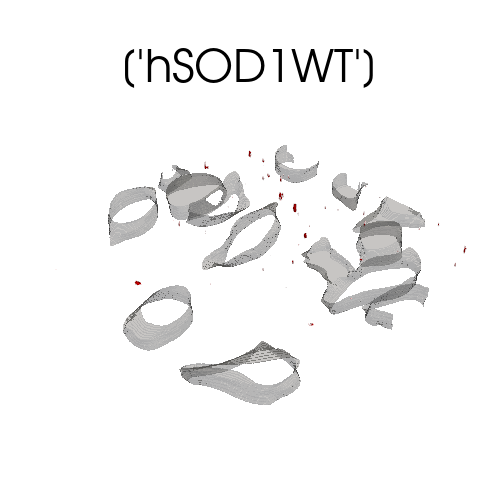

Protein Volume Inside Cells'
0    0.050171
1    0.015678
2    0.056442
3    0.037628
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.003136
2      0.028221
3      0.025086
4      0.404504
         ...   
98     0.047035
99     0.081528
100    0.009407
101    0.009407
102    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 103, dtype: float64
Cell Volume
0     1558.120454
1     1898.370871
2     1257.539631
3     1573.030652
4     1639.883530
5      342.994145
6      447.450199
7     2079.460015
8      793.859108
9     1669.199081
10     993.019225
11     489.963863
12     494.974693
13     942.929737
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    49579.357781
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
85    MS131-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12]
VoxelSize(

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


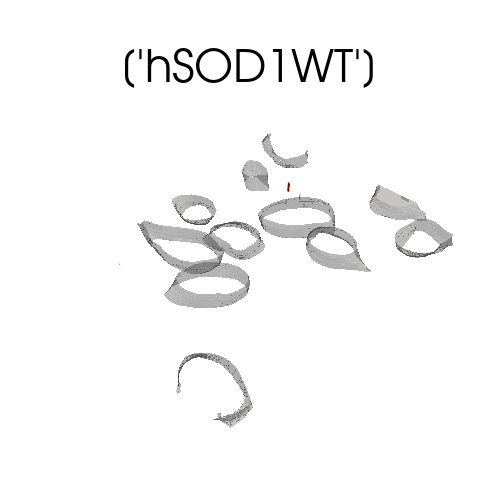

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0     0.047035
1     1.755986
2     0.028221
3     0.012543
4     0.216363
5     0.018814
6     0.282212
7     0.003136
8     0.206955
9     0.025086
10    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      906.170062
1     1240.026811
2     1363.450644
3      583.115759
4     1523.828565
5      925.645823
6      829.220267
7     1285.785912
8      458.939361
9      301.471359
10     659.381974
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    45819.093502
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
89    MS135-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(25, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


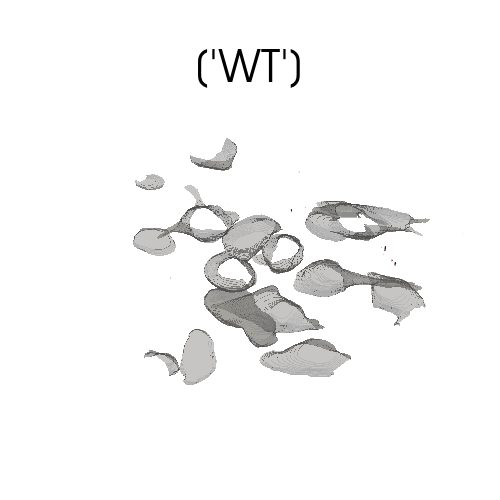

Protein Volume Inside Cells'
0    0.043900
1    0.003136
2    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.059578
1     0.141106
2     0.003136
3     0.040764
4     0.018814
5     0.025086
6     0.304162
7     0.181870
8     0.504846
9     0.025086
10    0.021950
11    0.028221
12    0.034493
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      791.250216
1       91.681259
2     1618.824246
3     1312.824954
4     1101.830749
5     1157.834145
6      618.969221
7      290.333393
8     1043.453638
9      962.226764
10     221.473675
11     145.862819
12     240.033815
13     614.293910
14     738.420137
15     674.680998
16    1661.823942
17     151.685793
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    68762.687558
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
93    MS135-7_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(18, 1024, 1024)
Number o

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


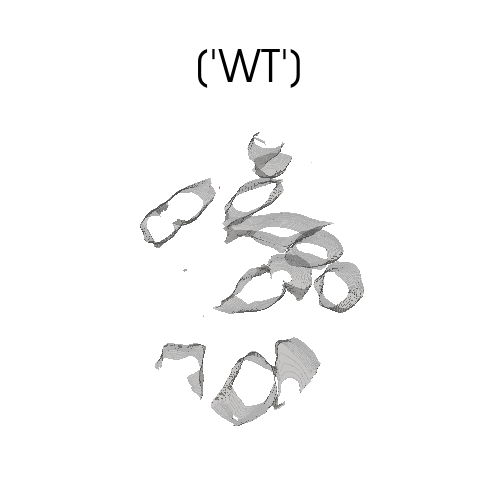

Protein Volume Inside Cells'
0    0.028221
1    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.003136
1     0.021950
2     0.003136
3     0.003136
4     0.003136
5     0.090935
6     0.003136
7     0.003136
8     0.003136
9     0.003136
10    0.006271
11    0.050171
12    0.003136
13    0.003136
14    0.003136
15    0.003136
16    0.006271
17    0.006271
18    0.003136
19    0.003136
20    0.015678
21    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      565.794216
1     1230.644831
2      866.967685
3      431.524037
4     1310.560987
5     1210.102936
6      921.983338
7      856.522706
8      604.585818
9     1073.882358
10     706.495693
11    1144.212714
12     641.442700
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    47619.417667
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
97    MS141-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


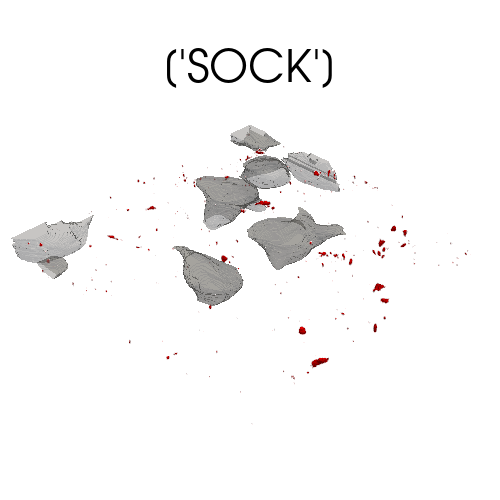

Protein Volume Inside Cells'
0     0.003136
1     0.006271
2     0.078392
3     0.065849
4     0.003136
5     0.043900
6     0.003136
7     0.003136
8     0.006271
9     0.003136
10    0.009407
11    0.003136
12    0.003136
13    0.003136
14    0.031357
15    0.003136
16    0.043900
17    0.006271
18    0.263398
19    0.015678
20    0.012543
21    0.006271
22    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.846636
1      0.316705
2      3.772233
3      1.291904
4      1.850056
         ...   
711    0.003136
712    0.031357
713    0.003136
714    0.009407
715    0.075257
Name: Proten_Volume_Voxel_Resolved, Length: 716, dtype: float64
Cell Volume
0    1311.852890
1     482.761186
2    1994.627100
3    1387.407303
4    1239.888840
5    1319.381678
6     755.901600
7     495.479539
8     103.716031
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    102701.243907
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Ne

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


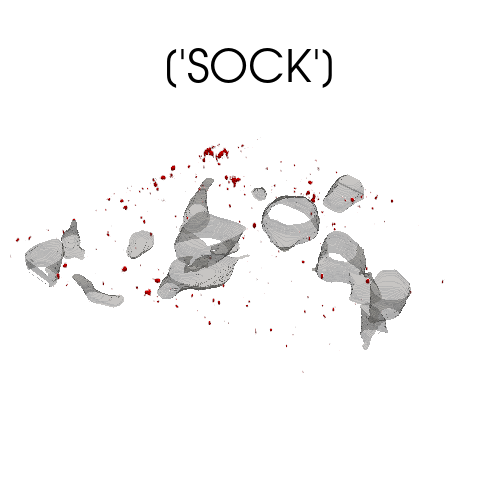

Protein Volume Inside Cells'
0     0.075257
1     0.034493
2     0.025086
3     0.037628
4     0.031357
5     0.003136
6     0.003136
7     0.012543
8     0.015678
9     0.006271
10    0.003136
11    0.012543
12    0.003136
13    0.003136
14    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.721208
1      7.942699
2      0.373147
3      2.031926
4      0.040764
         ...   
711    0.003136
712    0.006271
713    0.003136
714    0.009407
715    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 716, dtype: float64
Cell Volume
0     2129.010164
1     1102.852984
2     1637.763805
3       52.052428
4      949.414341
5      617.222643
6      418.833906
7      157.524445
8      573.043928
9       98.670708
10     117.102285
11      49.139374
12     277.928610
13     519.909687
14     236.255310
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    66687.451315
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next I

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


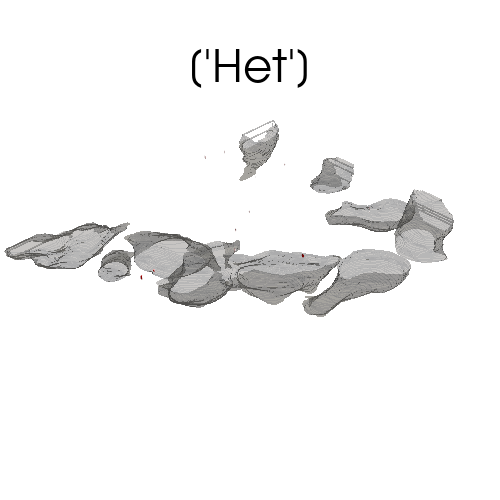

Protein Volume Inside Cells'
0    0.043900
1    0.021950
2    0.348061
3    0.006271
4    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.097206
1     0.053307
2     0.043900
3     0.078392
4     0.128563
5     0.012543
6     0.003136
7     0.050171
8     0.018814
9     0.175599
10    0.009407
11    0.348061
12    0.003136
13    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      803.824326
1     1626.494140
2      412.217603
3      423.565660
4     1814.036531
5      125.600001
6     1512.342538
7      849.467407
8      318.162628
9     1643.081932
10    1222.633147
11    1922.741442
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    125422.153912
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
106    MS143-8_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(31, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 1

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


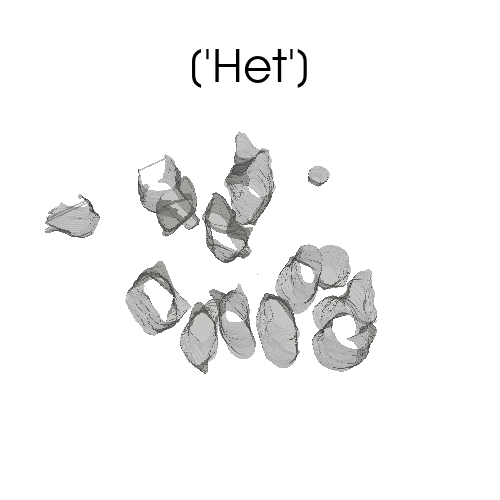

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    0.062714
1    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     2266.503831
1      884.405248
2     2348.263771
3      262.842813
4     1846.236915
5      765.299258
6       97.867972
7     1703.776318
8     1239.882569
9      404.572795
10     966.133832
11    1278.432723
12     974.126702
13    1086.020608
14     860.363925
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    84943.507847
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
109    MS144-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(26, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


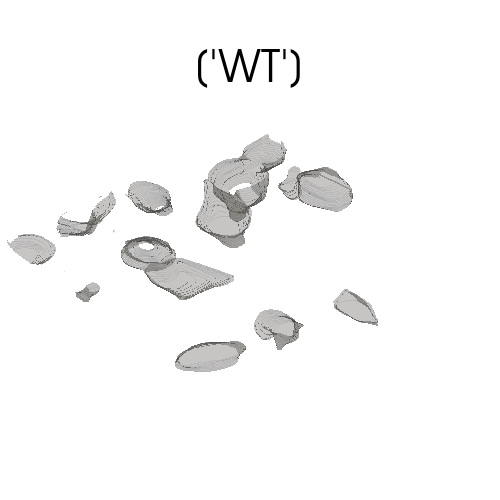

Protein Volume Inside Cells'
0    0.043900
1    0.018814
2    0.062714
3    0.021950
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.009407
1    0.003136
2    0.009407
3    0.112885
4    0.021950
5    0.012543
6    0.081528
7    0.053307
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      768.964878
1     2479.774545
2     1187.472672
3      617.247728
4      145.514758
5      721.211479
6      729.455203
7      270.406093
8      946.567136
9       37.546733
10     310.257558
11     134.279586
12     357.111015
13    1436.844567
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    75345.544928
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
112    MS144-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(34, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


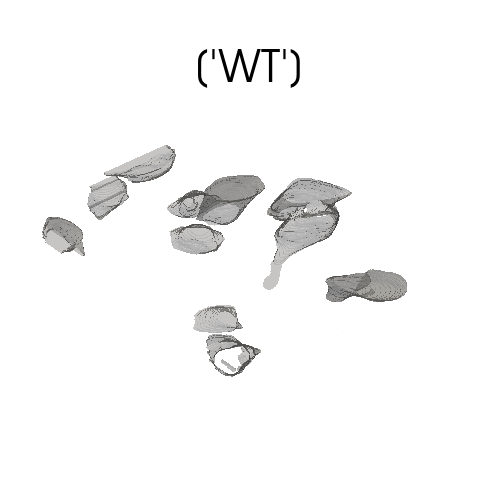

Protein Volume Inside Cells'
0    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.003136
1     0.003136
2     0.003136
3     0.009407
4     0.006271
5     0.003136
6     0.015678
7     0.003136
8     0.003136
9     0.003136
10    0.003136
11    0.009407
12    0.006271
13    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1405.569211
1     1408.830327
2      439.087318
3      458.585028
4      398.144634
5     1204.744044
6      416.337898
7      431.464459
8      342.840496
9      541.009735
10     136.995093
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    104608.651832
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
115    MS146-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(19, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


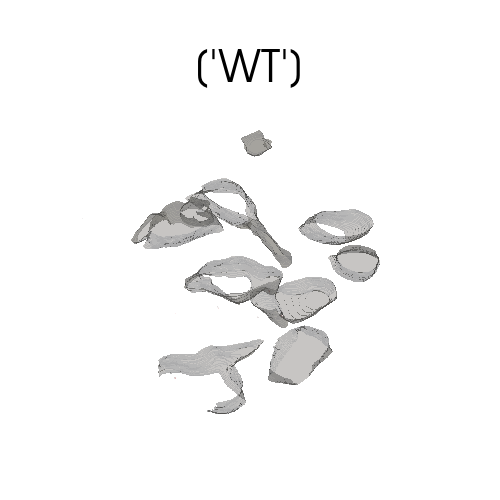

Protein Volume Inside Cells'
0    0.043900
1    0.003136
2    0.018814
3    0.003136
4    0.047035
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.065849
1     0.006271
2     0.031357
3     0.003136
4     0.009407
5     0.025086
6     0.003136
7     0.003136
8     0.003136
9     0.003136
10    0.003136
11    0.006271
12    0.003136
13    0.006271
14    0.003136
15    0.003136
16    0.003136
17    0.009407
18    0.003136
19    0.003136
20    0.003136
21    0.018814
22    0.003136
23    0.003136
24    0.003136
25    0.031357
26    0.003136
27    0.003136
28    0.003136
29    0.003136
30    0.003136
31    0.009407
32    0.003136
33    0.003136
34    0.003136
35    0.003136
36    0.003136
37    0.003136
38    0.003136
39    0.006271
40    0.006271
41    0.012543
42    0.015678
43    0.034493
44    0.003136
45    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1629.400924
1     1134.024863
2     1052.478149
3      650.6020

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


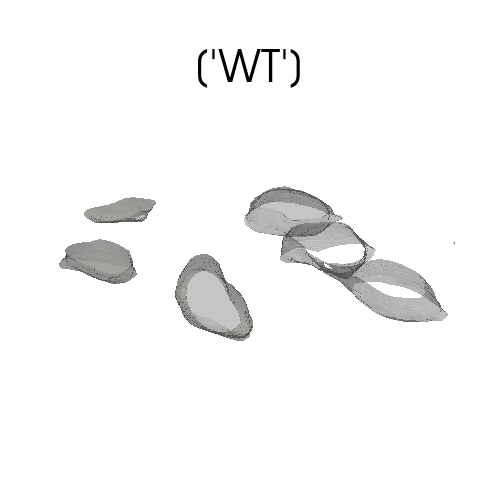

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0     0.006271
1     0.003136
2     0.015678
3     0.003136
4     0.090935
5     0.003136
6     0.003136
7     0.003136
8     0.003136
9     0.003136
10    0.003136
11    0.003136
12    0.003136
13    0.003136
14    0.018814
15    0.012543
16    0.009407
17    0.006271
18    0.009407
19    0.003136
20    0.003136
21    0.003136
22    0.003136
23    0.003136
24    0.003136
25    0.003136
26    0.003136
27    0.003136
28    0.003136
29    0.003136
30    0.003136
31    0.003136
32    0.003136
33    0.003136
34    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    2290.087344
1    2158.614198
2    1981.940104
3    2398.958447
4     886.659808
5     371.036607
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    72112.894723
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
121    MS147-1_Python

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


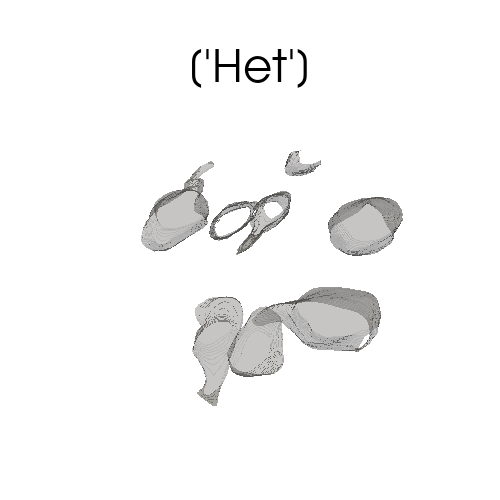

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Cell Volume
0    1326.496479
1    1311.857277
2     481.146334
3    2975.503350
4     870.581459
5     857.152340
6    2975.960631
7    3161.171733
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    67586.644768
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
124    MS147-7_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(27, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8 9]
VoxelSize(x=0.10182914864199052, y=0.10182914864199052, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


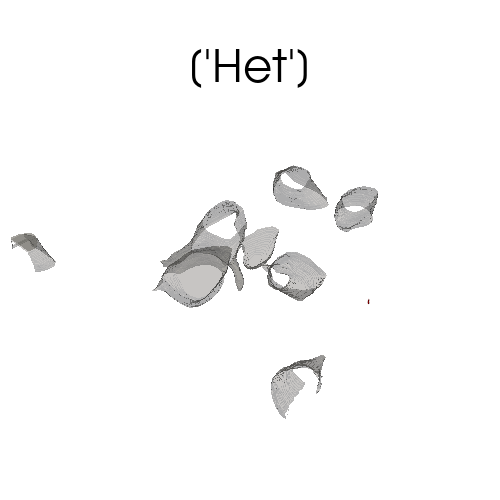

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    0.326629
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1171.179710
1     379.259853
2    2197.945838
3    1117.914292
4    1949.480691
5    1509.050998
6     845.057734
7     461.806785
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    78438.53962
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
127    MS149-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(34, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


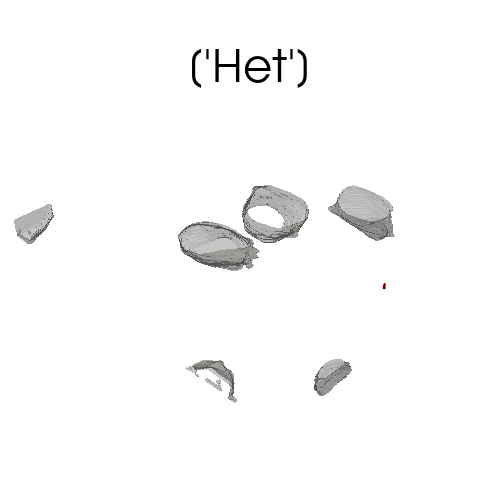

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    0.934435
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    2684.629071
1    2204.219651
2    1164.776559
3     349.215351
4     146.427243
5     237.271273
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    105005.720924
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
130    MS149-9_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(32, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


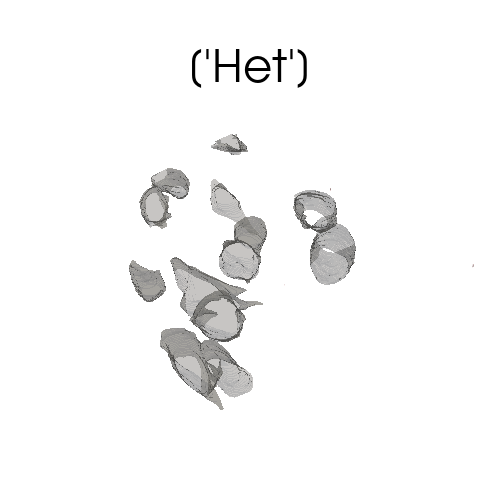

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    0.028221
1    0.003136
2    0.059578
3    0.087799
4    0.018814
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      303.998724
1      564.815882
2      652.508545
3      329.018382
4     1612.242436
5     1576.467367
6      630.991451
7      853.967120
8     1012.654906
9     1118.584733
10     353.975326
11     499.960437
12    1032.055410
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    94675.004058
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
133    MS150-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(30, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


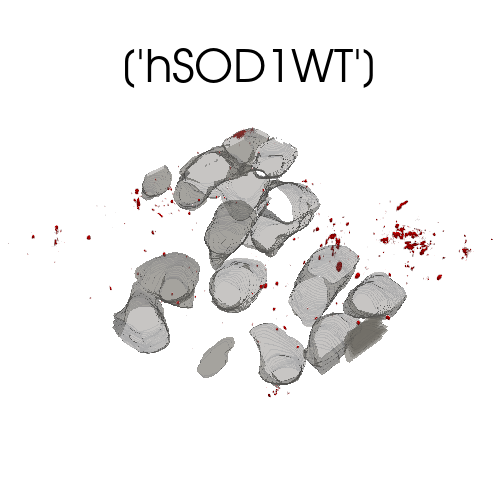

Protein Volume Inside Cells'
0      0.388825
1      0.003136
2      0.043900
3      0.188141
4      0.075257
         ...   
174    0.003136
175    0.015678
176    0.009407
177    0.094071
178    0.081528
Name: Proten_Volume_Voxel_Resolved, Length: 179, dtype: float64
Protein Volume Inside Void'
0       2.505415
1       3.659348
2       1.100627
3       0.918757
4       0.021950
          ...   
1014    0.122292
1015    0.003136
1016    0.006271
1017    0.025086
1018    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 1019, dtype: float64
Cell Volume
0     1291.282774
1     2210.233902
2     1197.945872
3     2787.068877
4     2648.076351
5     2145.786097
6     1414.242525
7     1363.017919
8      924.692573
9      826.009322
10     223.781542
11    2047.341158
12    1691.791717
13    1449.415542
14    1675.551986
15      65.137656
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    74678.853665
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
I

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


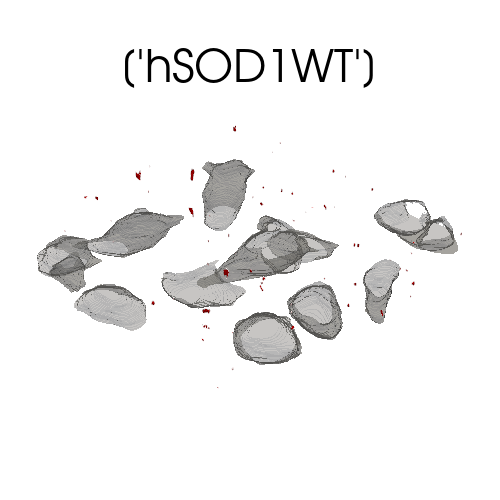

Protein Volume Inside Cells'
0    0.034493
1    0.084664
2    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     1.777935
1     0.084664
2     6.227477
3     0.410775
4     0.624002
        ...   
61    0.012543
62    0.053307
63    0.457811
64    0.235177
65    0.034493
Name: Proten_Volume_Voxel_Resolved, Length: 66, dtype: float64
Cell Volume
0     1466.884463
1      804.090860
2      787.292977
3      331.156921
4      374.269502
5     2616.296149
6      917.972793
7      658.246855
8     2061.815496
9      369.352742
10    2604.251969
11    1184.239777
12    1185.541088
13    2224.833667
14    2507.559880
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    131154.546726
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
140    MS152-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(35, 1024, 1024)
Number of unique cells:
[0 2 3 4 5]
VoxelSize(x=0.1022364652365585, y=0.102236

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


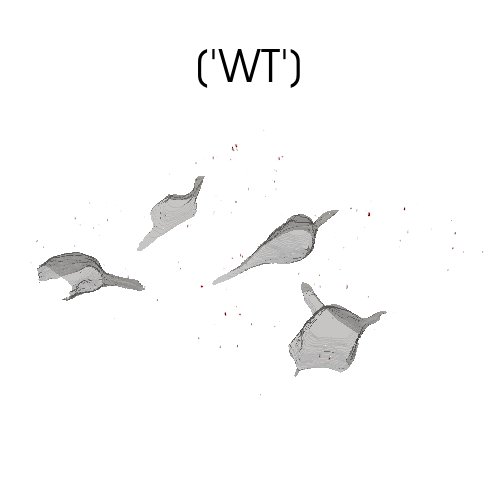

Protein Volume Inside Cells'
0    0.003136
1    0.047035
2    0.006271
3    0.040764
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.119156
1      0.003136
2      0.025086
3      0.006271
4      0.043900
         ...   
558    0.003136
559    0.003136
560    0.003136
561    0.012543
562    0.050171
Name: Proten_Volume_Voxel_Resolved, Length: 563, dtype: float64
Cell Volume
0    1922.515672
1    1805.400845
2     565.972951
3    2023.491112
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    108762.887143
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
143    MS152-8_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(45, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8 9]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


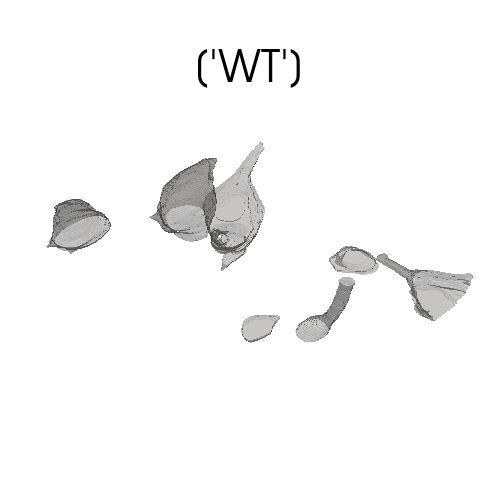

Protein Volume Inside Cells'
0    0.009407
1    0.047035
2    0.056442
3    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.068985
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1429.798675
1     343.470770
2    3155.653376
3    1470.302363
4      66.018785
5     624.497440
6     204.613078
7     174.325464
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    140491.664266
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
146    MS156-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


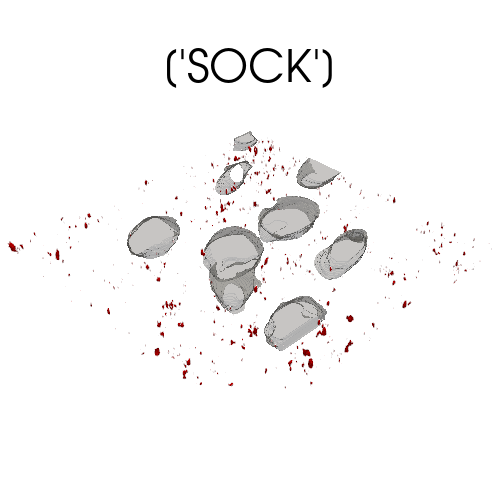

Protein Volume Inside Cells'
0     0.125428
1     0.235177
2     0.003136
3     0.169327
4     0.015678
5     0.454675
6     0.003136
7     0.006271
8     0.003136
9     0.059578
10    0.003136
11    0.043900
12    0.009407
13    0.012543
14    0.131699
15    0.031357
16    0.028221
17    0.003136
18    0.003136
19    0.043900
20    0.003136
21    0.009407
22    0.012543
23    0.006271
24    0.043900
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       5.973486
1       0.291619
2       0.015678
3       0.247719
4       0.238312
          ...   
1186    0.012543
1187    0.003136
1188    0.050171
1189    0.031357
1190    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 1191, dtype: float64
Cell Volume
0    1531.633293
1     626.149948
2    1305.173874
3    1463.124772
4     798.675526
5     695.307556
6     168.941486
7     881.398123
8     954.092788
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    57335.655618
Name: Void_Volume_Vox

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


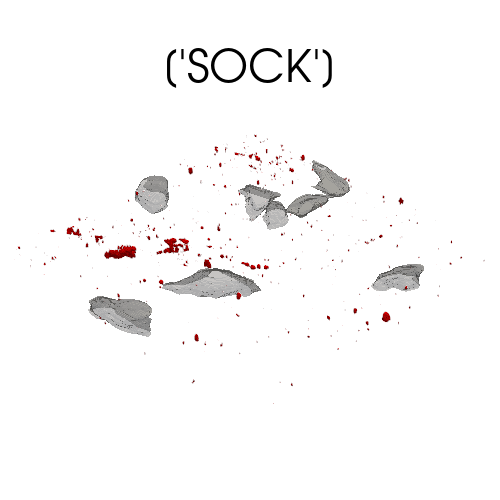

Protein Volume Inside Cells'
0    0.028221
1    0.021950
2    0.009407
3    0.009407
4    0.012543
5    0.166191
6    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.906214
1      0.272805
2      1.940991
3      0.191277
4      2.464651
         ...   
778    0.003136
779    0.040764
780    0.006271
781    0.003136
782    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 783, dtype: float64
Cell Volume
0    1705.278313
1     651.295033
2     377.668588
3     398.420574
4     405.428838
5     264.275822
6     481.146307
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    77916.677756
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
152    MS157-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(32, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


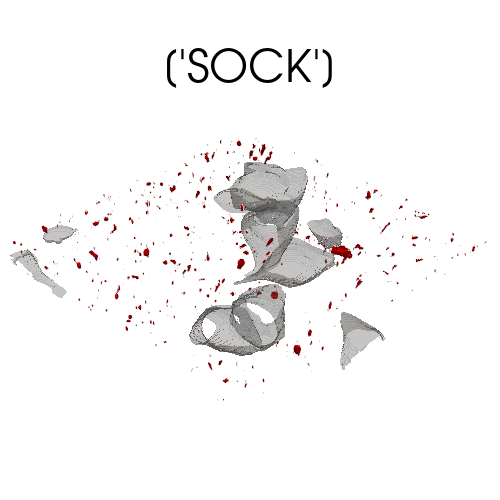

Protein Volume Inside Cells'
0     0.003136
1     0.003136
2     0.025086
3     0.003136
4     0.003136
5     0.003136
6     0.009407
7     0.087799
8     0.006271
9     0.043900
10    0.003136
11    0.050171
12    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.134835
1      0.090935
2      0.062714
3      5.656782
4      0.492303
         ...   
978    0.012543
979    0.131699
980    0.059578
981    0.003136
982    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 983, dtype: float64
Cell Volume
0       77.865416
1     1153.676222
2     2192.313442
3      276.530093
4     2238.966215
5      336.616155
6     1381.270761
7     1909.452394
8     1681.738699
9      379.264653
10     170.158134
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    93418.392591
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
155    MS157-8_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(35

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


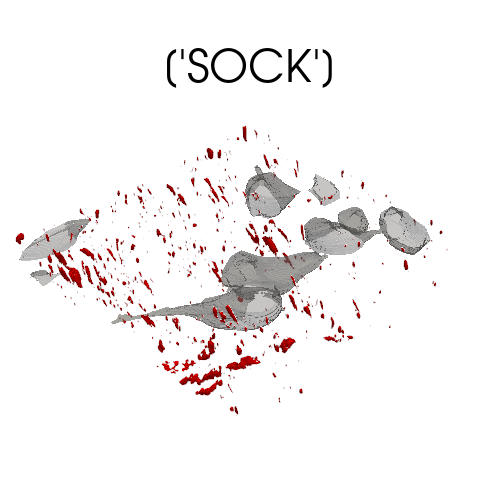

Protein Volume Inside Cells'
0     0.031357
1     0.021950
2     0.003136
3     0.003136
4     0.021950
5     0.003136
6     0.040764
7     0.003136
8     0.015678
9     0.031357
10    0.006271
11    0.003136
12    0.025086
13    0.012543
14    0.065849
15    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      9.846062
1      0.109749
2      9.836655
3      0.859179
4      0.852907
         ...   
973    0.003136
974    0.003136
975    0.018814
976    0.050171
977    0.034493
Name: Proten_Volume_Voxel_Resolved, Length: 978, dtype: float64
Cell Volume
0    1236.787644
1    1159.518010
2     345.966778
3    1967.277625
4    1818.464123
5    1828.554768
6     424.901463
7      43.134530
8     232.194594
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    106023.468188
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
158    MS158-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(4

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


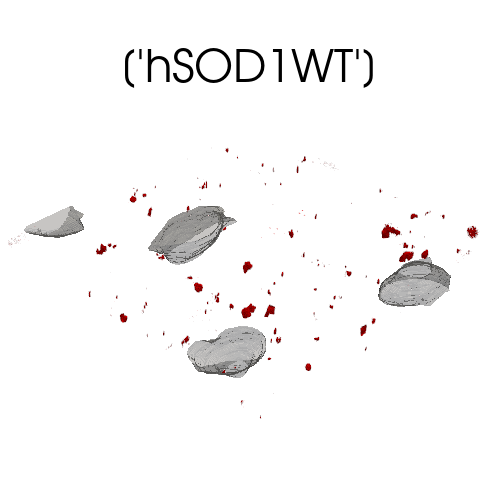

Protein Volume Inside Cells'
0     0.003136
1     0.006271
2     0.018814
3     0.003136
4     0.028221
5     0.003136
6     0.003136
7     0.003136
8     0.031357
9     0.003136
10    0.003136
11    0.003136
12    0.009407
13    0.003136
14    0.003136
15    0.106613
16    0.003136
17    0.003136
18    0.009407
19    0.006271
20    0.006271
21    0.015678
22    0.003136
23    0.003136
24    0.006271
25    0.003136
26    0.003136
27    0.003136
28    0.009407
29    0.003136
30    0.003136
31    0.006271
32    0.003136
33    0.003136
34    0.003136
35    0.037628
36    0.006271
37    0.003136
38    0.012543
39    0.003136
40    0.003136
41    0.003136
42    0.003136
43    0.003136
44    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       4.487170
1       0.021950
2       6.735459
3       0.025086
4       0.053307
          ...   
2061    0.003136
2062    0.003136
2063    0.003136
2064    0.003136
2065    0.003136
Name: Proten_Volume_Voxel_Reso

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


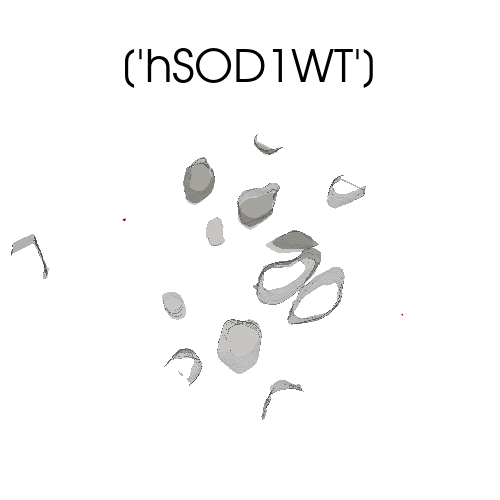

Protein Volume Inside Cells'
0    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.012543
1     0.006271
2     0.003136
3     0.003136
4     0.043900
5     0.012543
6     0.003136
7     0.586374
8     0.003136
9     0.003136
10    0.021950
11    0.015678
12    0.003136
13    0.025086
14    0.003136
15    0.003136
16    0.003136
17    0.003136
18    0.003136
19    0.003136
20    0.003136
21    0.163056
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     645.381125
1     188.451740
2     686.997982
3      41.112011
4     446.434236
5     151.002213
6     872.100807
7     178.204310
8     783.793549
9      51.020787
10    457.318210
11    264.576848
12    392.271489
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    37585.434134
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
165    MS160-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(25, 1024, 1024)
Num

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


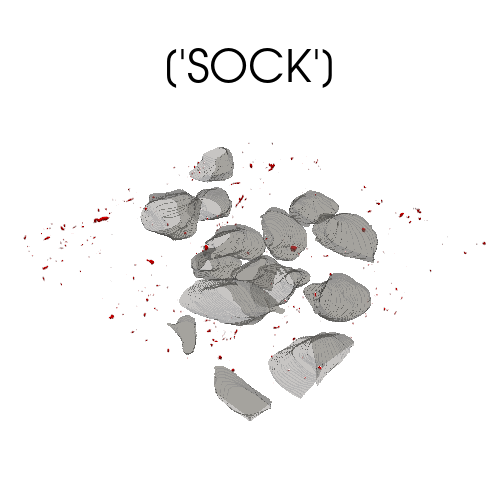

Protein Volume Inside Cells'
0     0.012543
1     0.018814
2     2.191846
3     0.103478
4     0.003136
5     0.059578
6     0.009407
7     0.021950
8     0.486032
9     0.009407
10    0.015678
11    0.257126
12    0.423318
13    0.006271
14    0.006271
15    0.018814
16    0.003136
17    0.003136
18    0.003136
19    0.003136
20    0.006271
21    0.025086
22    0.003136
23    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.341790
1      0.275941
2      0.445268
3      0.153649
4      0.150513
         ...   
606    0.031357
607    0.410775
608    0.188141
609    0.228905
610    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 611, dtype: float64
Cell Volume
0      951.756700
1      598.722081
2      742.753658
3     1863.433031
4      809.578315
5     1533.862768
6      686.151346
7     1000.607591
8      526.344120
9      455.809944
10     911.898964
11    1048.916007
12     259.732210
13      90.223164
14     736.077777
Name: Cell

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


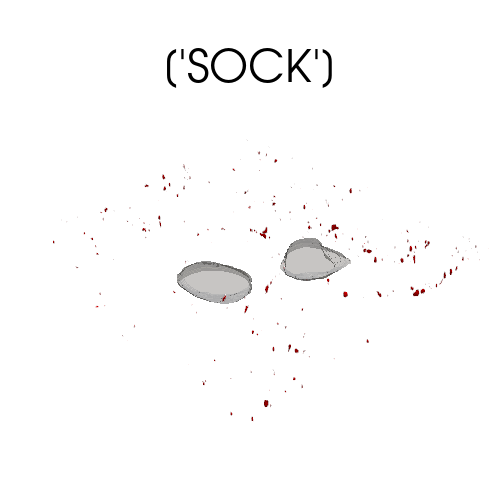

Protein Volume Inside Cells'
0    0.025086
1    0.103478
2    0.003136
3    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.015678
1      1.232326
2      0.028221
3      0.028221
4      0.448403
         ...   
433    0.003136
434    0.006271
435    0.056442
436    0.015678
437    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 438, dtype: float64
Cell Volume
0     938.006706
1    1037.172854
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    44056.927529
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
172    MS165-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(25, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8 9]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


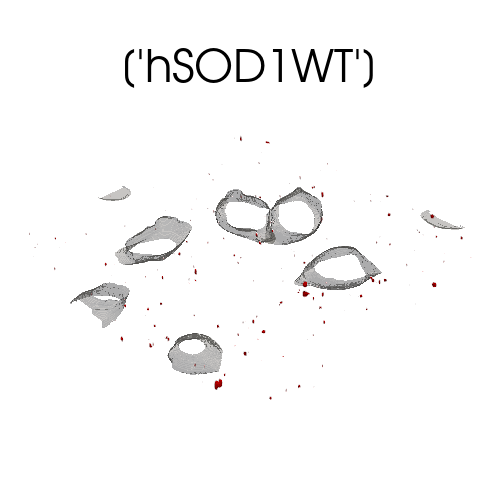

Protein Volume Inside Cells'
0     0.040764
1     0.025086
2     0.003136
3     0.025086
4     1.207240
5     0.037628
6     0.003136
7     0.025086
8     0.012543
9     0.156784
10    0.379418
11    0.075257
12    0.047035
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.062714
1      0.006271
2      0.153649
3      0.021950
4      0.084664
         ...   
267    0.003136
268    0.028221
269    0.006271
270    0.003136
271    0.040764
Name: Proten_Volume_Voxel_Resolved, Length: 272, dtype: float64
Cell Volume
0    2507.873449
1    2390.419967
2    1736.456463
3    2046.550965
4     881.833984
5     804.517314
6      77.708631
7      44.780767
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    71710.049692
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
175    MS165-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(28, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


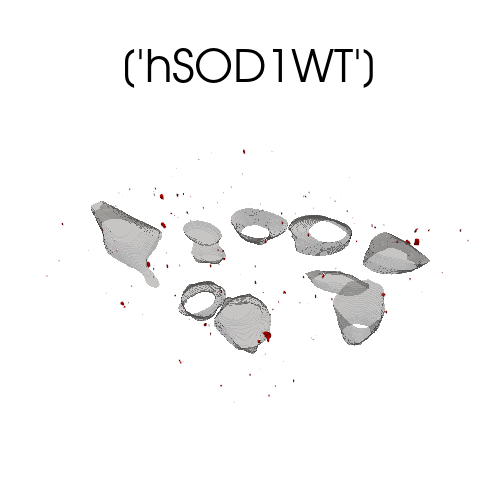

Protein Volume Inside Cells'
0     0.181870
1     0.175599
2     0.062714
3     0.028221
4     0.291619
5     0.112885
6     0.006271
7     0.009407
8     0.003136
9     0.021950
10    0.003136
11    0.266534
12    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.028221
2      0.028221
3      0.028221
4      0.774515
         ...   
224    0.006271
225    0.009407
226    0.003136
227    0.015678
228    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 229, dtype: float64
Cell Volume
0    2151.192024
1    1214.198145
2     209.360511
3     169.164120
4    2017.530168
5    1105.204750
6    1302.875414
7     310.448835
8    1315.587495
9    1105.512048
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    81163.140669
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
178    MS167-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(40, 1024, 1024)
Number of uniq

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


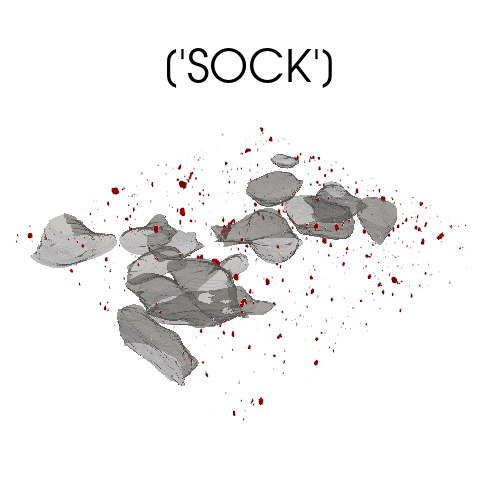

Protein Volume Inside Cells'
0     0.068985
1     0.059578
2     0.009407
3     0.012543
4     0.015678
5     0.398232
6     0.206955
7     0.210091
8     0.056442
9     0.028221
10    0.009407
11    0.009407
12    0.003136
13    0.003136
14    0.003136
15    0.015678
16    0.304162
17    0.025086
18    0.028221
19    0.112885
20    0.025086
21    0.015678
22    0.031357
23    0.006271
24    0.003136
25    0.003136
26    0.003136
27    0.015678
28    0.075257
29    0.003136
30    0.003136
31    0.003136
32    0.062714
33    1.251140
34    0.059578
35    0.003136
36    0.003136
37    0.003136
38    0.141106
39    0.216363
40    0.294755
41    0.003136
42    0.181870
43    0.006271
44    0.112885
45    0.570695
46    0.062714
47    0.006271
48    0.084664
49    0.310433
50    0.003136
51    0.003136
52    0.012543
53    0.003136
54    0.003136
55    0.003136
56    0.003136
57    0.003136
58    0.116020
59    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Insid

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


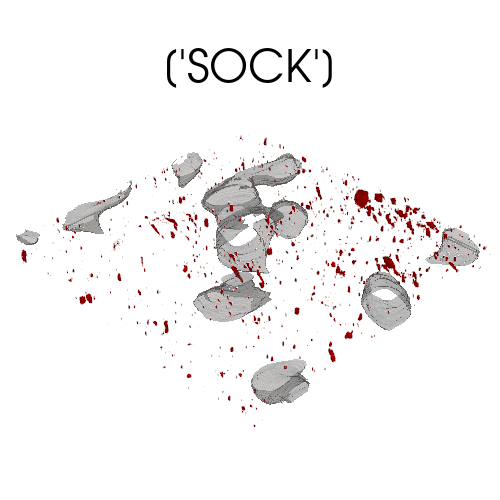

Protein Volume Inside Cells'
0     0.025086
1     0.031357
2     0.849772
3     0.003136
4     0.003136
5     0.012543
6     0.448403
7     0.009407
8     0.310433
9     0.313569
10    0.137970
11    0.200684
12    0.003136
13    0.056442
14    0.056442
15    0.003136
16    0.003136
17    0.006271
18    0.012543
19    0.012543
20    0.009407
21    0.134835
22    0.018814
23    0.078392
24    0.047035
25    0.081528
26    0.006271
27    0.185006
28    0.015678
29    0.006271
30    0.003136
31    0.006271
32    0.398232
33    0.025086
34    0.821550
35    0.021950
36    0.031357
37    0.025086
38    0.003136
39    0.009407
40    0.009407
41    0.752565
42    0.360604
43    0.068985
44    0.250855
45    0.003136
46    0.043900
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.006271
1       0.003136
2       0.319840
3       0.075257
4       0.031357
          ...   
1852    0.012543
1853    0.003136
1854    0.012543
1855    0.006271
1856    0.009407


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


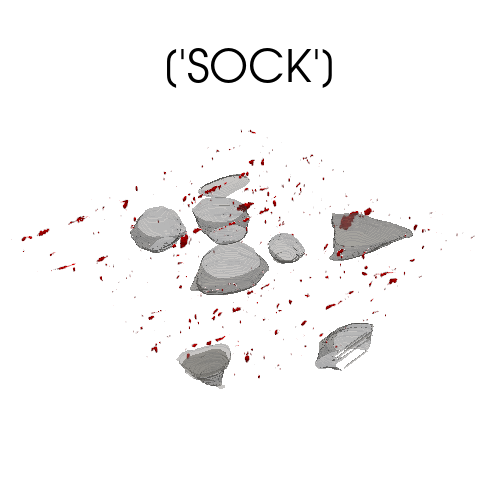

Protein Volume Inside Cells'
0     0.043900
1     0.037628
2     0.128563
3     0.003136
4     0.009407
5     0.050171
6     0.003136
7     0.003136
8     0.053307
9     0.006271
10    0.003136
11    0.009407
12    0.329247
13    0.003136
14    0.134835
15    0.003136
16    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.257126
1      0.025086
2      0.003136
3      0.009407
4      0.084664
         ...   
693    0.003136
694    0.009407
695    0.034493
696    0.006271
697    0.031357
Name: Proten_Volume_Voxel_Resolved, Length: 698, dtype: float64
Cell Volume
0    1359.342892
1    1531.648972
2    1803.268577
3     403.531746
4    1603.794892
5     346.640951
6     319.956242
7     823.494500
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    90448.550706
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
187    MS170-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(31, 

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


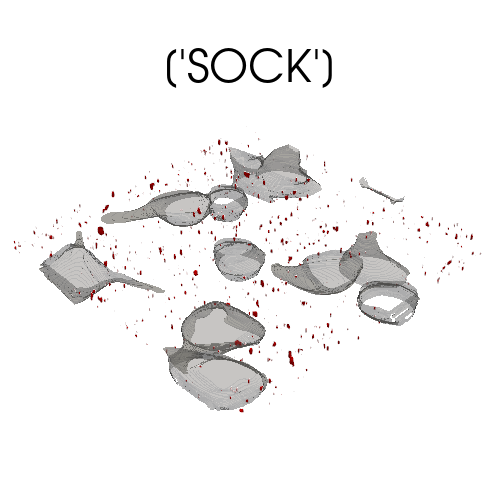

Protein Volume Inside Cells'
0     0.003136
1     0.003136
2     0.200684
3     0.025086
4     0.288483
        ...   
64    0.003136
65    2.543043
66    0.517389
67    0.003136
68    0.009407
Name: Proten_Volume_Voxel_Resolved, Length: 69, dtype: float64
Protein Volume Inside Void'
0       0.018814
1       0.031357
2       0.994013
3       0.062714
4       0.006271
          ...   
1114    0.090935
1115    0.021950
1116    0.003136
1117    0.009407
1118    0.015678
Name: Proten_Volume_Voxel_Resolved, Length: 1119, dtype: float64
Cell Volume
0     1024.222460
1     2465.428770
2     1309.482310
3     1977.148772
4     1857.625736
5     1368.536730
6     1694.171704
7     2364.531723
8     1272.267959
9      964.368439
10     125.505930
11    1721.916275
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    83783.030317
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
190    MS171-2_Python
Name: IMAGE_ID, dtype: object
shape of image

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


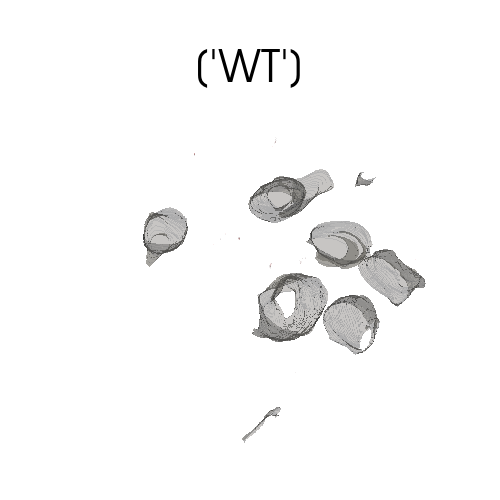

Protein Volume Inside Cells'
0    0.003136
1    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.003136
1     0.003136
2     0.065849
3     0.003136
4     0.031357
        ...   
78    0.003136
79    0.003136
80    0.003136
81    0.003136
82    0.015678
Name: Proten_Volume_Voxel_Resolved, Length: 83, dtype: float64
Cell Volume
0    1551.595086
1     478.948189
2    2423.256896
3    1327.208356
4    3235.707502
5    1187.767427
6    1404.534434
7      40.503688
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    123158.792041
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
193    MS171-9_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(36, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


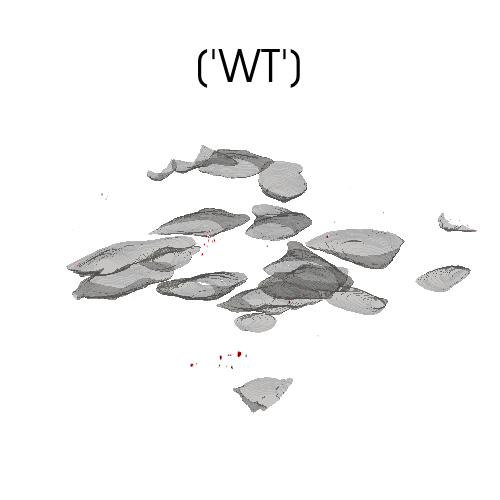

Protein Volume Inside Cells'
0     0.056442
1     0.109749
2     0.417047
3     0.116020
4     0.185006
5     0.250855
6     0.050171
7     0.009407
8     0.078392
9     0.040764
10    0.131699
11    0.043900
12    0.003136
13    0.009407
14    0.009407
15    0.034493
16    0.031357
17    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.094071
1     0.445268
2     0.144242
3     0.025086
4     0.018814
        ...   
80    0.028221
81    0.003136
82    0.128563
83    0.025086
84    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 85, dtype: float64
Cell Volume
0      532.853809
1      151.569772
2     1092.188507
3     1185.619480
4     1189.880881
5     1148.248345
6     1309.902492
7     1240.973788
8     1459.139312
9      427.350436
10     118.579194
11    1467.574314
12    1385.792424
13    1340.654189
14     970.893807
15     337.917466
16     110.357419
17     340.661193
18     220.937472
Name: Cell_Volume_Voxel_Resolved, dtype:

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


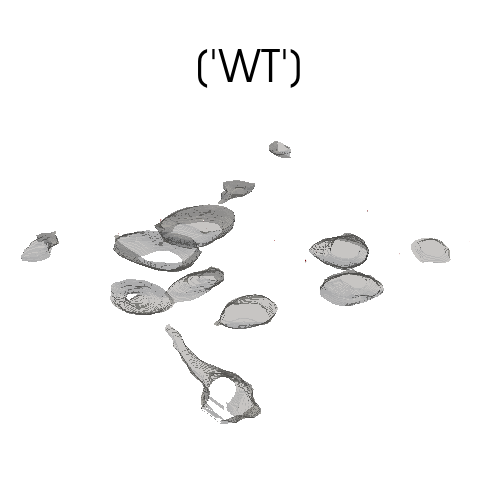

Protein Volume Inside Cells'
0    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.021950
1     0.003136
2     0.131699
3     0.006271
4     0.068985
5     0.062714
6     0.003136
7     0.006271
8     0.003136
9     0.003136
10    0.012543
11    0.015678
12    0.003136
13    0.034493
14    0.003136
15    0.009407
16    0.003136
17    0.122292
18    0.047035
19    0.034493
20    0.003136
21    0.003136
22    0.003136
23    0.003136
24    0.003136
25    0.003136
26    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      876.475092
1     2217.483613
2      620.637407
3      571.585833
4     2078.713721
5     1446.383332
6      950.950828
7      131.441788
8      207.557490
9     1324.273352
10     211.649563
11     121.241394
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    87881.836063
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
199    MS172-6_Python
Nam

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


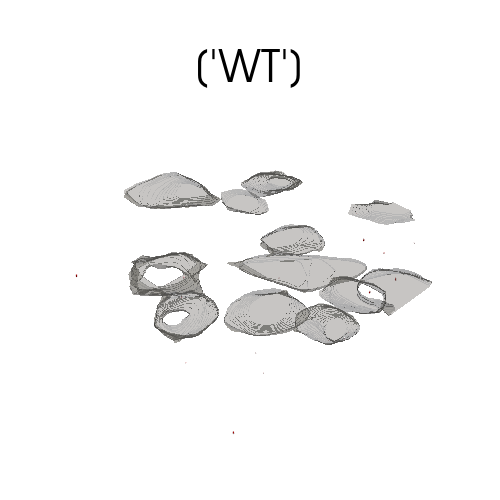

Protein Volume Inside Cells'
0    0.018814
1    0.015678
2    0.131699
3    0.012543
4    0.134835
5    0.090935
6    0.031357
7    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.040764
1     0.009407
2     0.006271
3     0.006271
4     0.031357
5     0.003136
6     0.018814
7     0.003136
8     0.078392
9     0.003136
10    0.003136
11    0.028221
12    0.003136
13    0.031357
14    0.003136
15    0.003136
16    0.144242
17    0.150513
18    0.009407
19    0.040764
20    0.031357
21    0.172463
22    0.006271
23    0.003136
24    0.119156
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      702.971179
1      629.088088
2      657.450390
3      603.049331
4      751.655878
5      457.010913
6      268.973084
7     1110.209309
8     1692.929971
9      771.601992
10     227.999043
11     997.105027
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    70042.139379
Name: Void_Volume_Voxel_Resolved, dtype: float6

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


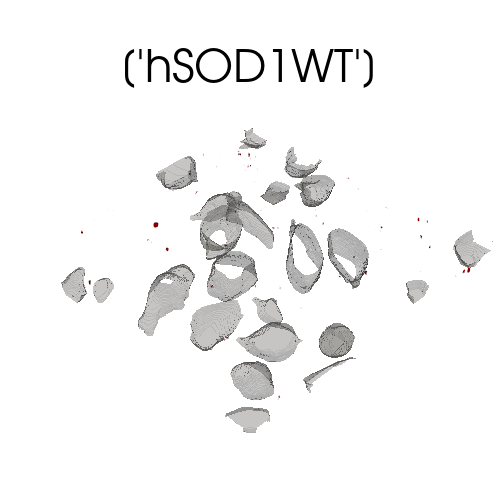

Protein Volume Inside Cells'
0    0.009407
1    0.028221
2    0.006271
3    0.006271
4    0.009407
5    0.131699
6    0.003136
7    0.106613
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.084664
1      0.018814
2      0.015678
3      0.003136
4      0.003136
         ...   
172    0.012543
173    0.006271
174    1.194697
175    0.003136
176    0.363740
Name: Proten_Volume_Voxel_Resolved, Length: 177, dtype: float64
Cell Volume
0      703.686116
1      729.590038
2      169.308362
3      718.665300
4      360.183989
5      155.163271
6      513.544240
7     1236.837815
8      189.028707
9     1293.079523
10    1620.542604
11    1200.172210
12     539.062472
13     984.214211
14      48.891654
15     462.200477
16      82.985995
17     362.962209
18     116.475147
19     108.215744
20     117.161863
21     570.773690
22     451.931097
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    72753.522144
Name: Void_Volume_Voxel_Resolved, d

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


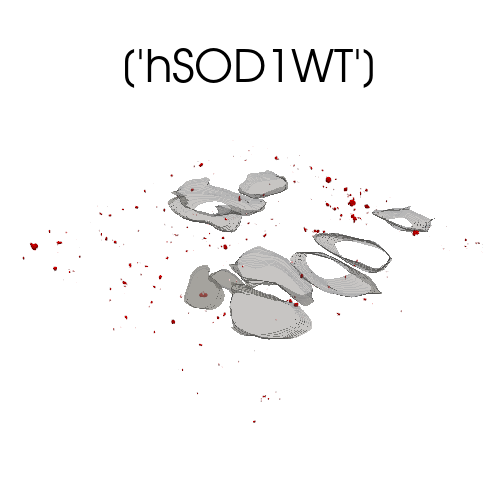

Protein Volume Inside Cells'
0     0.003136
1     0.219498
2     0.003136
3     0.006271
4     0.037628
5     0.006271
6     0.012543
7     0.018814
8     0.006271
9     0.034493
10    0.021950
11    0.003136
12    0.006271
13    0.034493
14    0.028221
15    0.341790
16    0.037628
17    0.012543
18    0.335519
19    0.395097
20    0.006271
21    0.003136
22    0.084664
23    0.003136
24    0.012543
25    0.003136
26    0.012543
27    0.037628
28    0.003136
29    0.053307
30    0.006271
31    0.090935
32    0.021950
33    0.435861
34    0.003136
35    0.003136
36    0.034493
37    0.009407
38    0.003136
39    0.003136
40    0.438996
41    0.191277
42    0.037628
43    0.003136
44    0.021950
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.050171
1      0.235177
2      0.489167
3      0.034493
4      0.062714
         ...   
430    0.021950
431    0.003136
432    0.003136
433    0.006271
434    0.003136
Name: Proten_Volume_Voxel_Resolved, Lengt

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


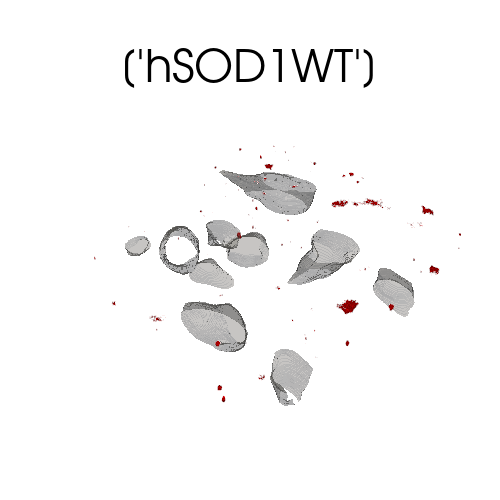

Protein Volume Inside Cells'
0     0.498574
1     0.821550
2     0.003136
3     0.006271
4     0.018814
5     0.015678
6     0.009407
7     0.040764
8     0.009407
9     0.003136
10    0.003136
11    0.003136
12    0.006271
13    0.012543
14    0.003136
15    0.006271
16    0.003136
17    0.003136
18    0.003136
19    0.003136
20    0.003136
21    0.009407
22    0.009407
23    0.003136
24    0.003136
25    0.015678
26    0.003136
27    0.003136
28    0.009407
29    0.003136
30    0.003136
31    0.034493
32    0.009407
33    0.106613
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.009407
1      0.460946
2      0.341790
3      0.028221
4      0.009407
         ...   
726    0.003136
727    0.003136
728    0.056442
729    0.006271
730    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 731, dtype: float64
Cell Volume
0    2060.498507
1     468.845001
2    1694.162297
3    1345.724597
4     108.654740
5     230.585986
6     629.940995
7    1425.0

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


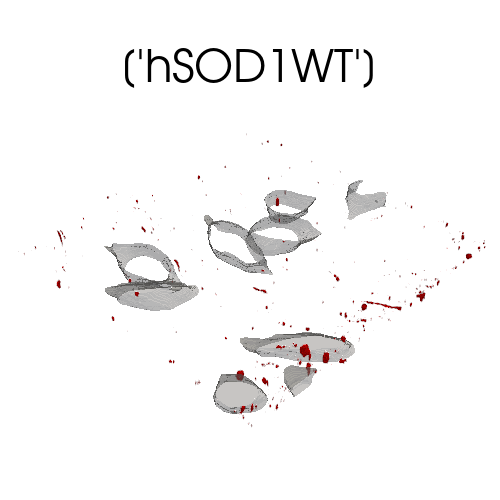

Protein Volume Inside Cells'
0     0.003136
1     0.009407
2     0.003136
3     0.072121
4     0.006271
5     0.003136
6     0.003136
7     0.003136
8     0.003136
9     0.040764
10    0.015678
11    0.003136
12    0.006271
13    3.176452
14    0.006271
15    0.003136
16    0.006271
17    0.156784
18    0.031357
19    0.003136
20    0.150513
21    0.015678
22    0.006271
23    0.370011
24    0.200684
25    0.006271
26    0.015678
27    1.106898
28    0.003136
29    0.003136
30    0.003136
31    0.003136
32    0.006271
33    0.103478
34    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.301026
1       0.059578
2       0.009407
3       0.003136
4       0.003136
          ...   
1446    0.003136
1447    0.021950
1448    0.003136
1449    0.003136
1450    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 1451, dtype: float64
Cell Volume
0     529.755749
1     817.530421
2    1315.791315
3    1500.552350
4    1294.537619
5     724.635650
6

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


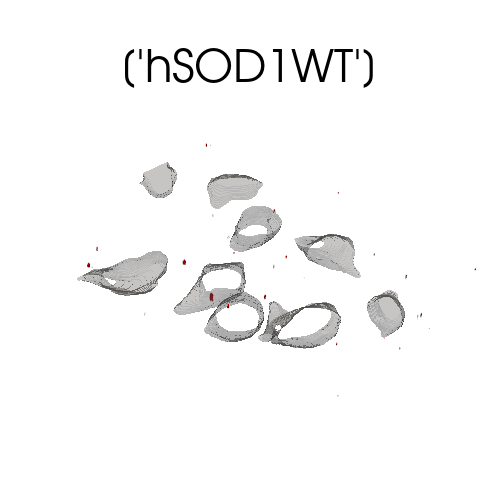

Protein Volume Inside Cells'
0    0.150513
1    0.006271
2    1.539623
3    0.012543
4    0.043900
5    0.460946
6    0.012543
7    0.040764
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.122292
1     0.119156
2     0.037628
3     0.200684
4     0.100342
5     0.210091
6     0.075257
7     0.003136
8     0.050171
9     0.018814
10    0.219498
11    0.238312
12    0.003136
13    0.771379
14    0.003136
15    0.285348
16    0.244584
17    0.025086
18    0.047035
19    0.031357
20    0.090935
21    0.090935
22    0.009407
23    0.172463
24    0.736887
25    0.009407
26    0.006271
27    0.075257
28    0.028221
29    0.175599
30    0.116020
31    0.003136
32    0.006271
33    0.037628
34    0.150513
35    0.037628
36    0.028221
37    0.003136
38    0.003136
39    0.003136
40    0.003136
41    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     854.544087
1     957.469925
2     911.604210
3    1000.228172
4     127.302680
5 

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


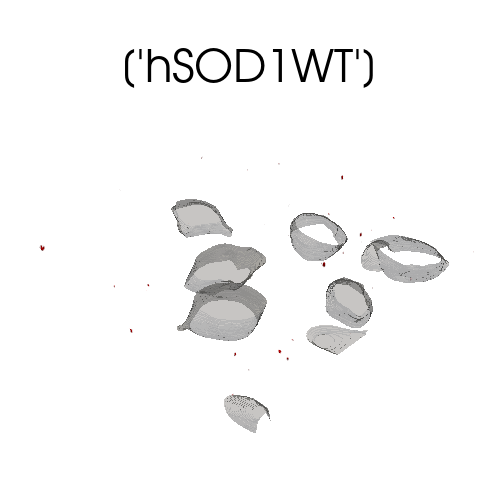

Protein Volume Inside Cells'
0    0.003136
1    0.012543
2    0.006271
3    0.003136
4    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.834093
1     0.034493
2     0.047035
3     0.068985
4     0.006271
5     0.018814
6     0.003136
7     0.075257
8     0.012543
9     0.181870
10    0.012543
11    0.006271
12    0.235177
13    0.153649
14    0.097206
15    0.006271
16    0.370011
17    0.075257
18    0.003136
19    0.006271
20    0.003136
21    0.012543
22    0.003136
23    0.003136
24    0.081528
25    0.003136
26    0.003136
27    0.147377
28    0.238312
29    0.034493
30    0.028221
31    0.003136
32    0.404504
33    0.094071
34    0.065849
35    0.090935
36    0.006271
37    0.003136
38    0.043900
39    0.028221
40    0.366876
41    0.009407
42    0.727480
43    0.003136
44    0.203820
45    0.056442
46    0.003136
47    0.015678
48    0.021950
49    0.056442
50    0.003136
51    0.003136
52    0.006271
53    0.003136
Name: Proten

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


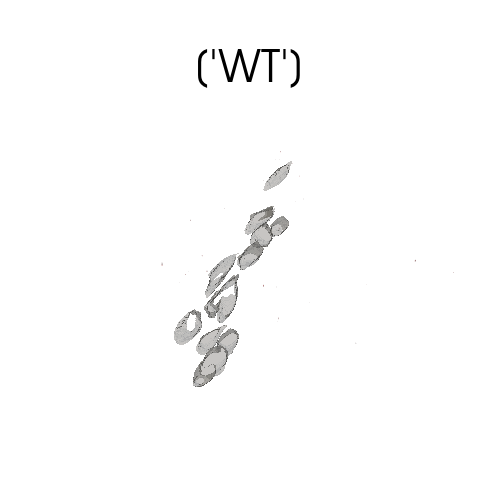

Protein Volume Inside Cells'
0     0.150513
1     0.037628
2     0.037628
3     0.225770
4     0.025086
5     0.012543
6     0.012543
7     0.037628
8     0.012543
9     0.112885
10    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.012543
1     0.025086
2     0.012543
3     0.025086
4     0.012543
        ...   
84    0.062714
85    0.025086
86    0.012543
87    0.012543
88    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 89, dtype: float64
Cell Volume
0      788.675815
1     1046.579919
2      594.162790
3     1083.066790
4     1075.327911
5     1135.119218
6     1683.212473
7      458.851562
8     1163.854667
9      528.827585
10     671.275640
11     899.102220
12     427.181109
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    317245.527226
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
228    MS187-8_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(41, 102

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


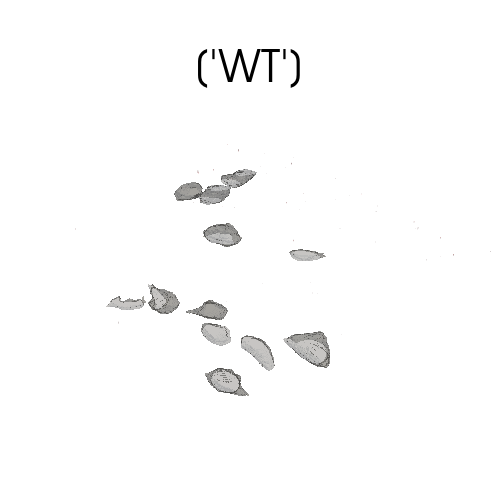

Protein Volume Inside Cells'
0     0.012543
1     0.137970
2     0.075257
3     0.050171
4     0.112885
5     0.012543
6     0.037628
7     0.012543
8     0.012543
9     0.163056
10    0.025086
11    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.012543
1      0.050171
2      0.025086
3      0.037628
4      0.012543
         ...   
152    0.802736
153    0.025086
154    0.112885
155    0.012543
156    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 157, dtype: float64
Cell Volume
0     1881.174756
1     2659.126517
2     1802.117779
3     1420.103127
4      439.121810
5      324.029501
6     1694.187383
7     3122.117188
8      845.946029
9     1232.388274
10    2093.611377
11    1305.612870
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    520413.717864
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
231    MS188-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


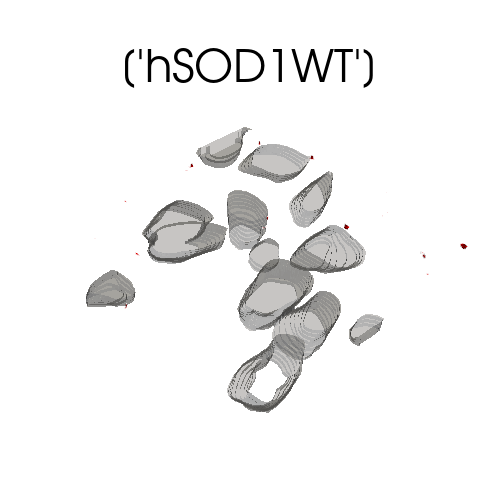

Protein Volume Inside Cells'
0    0.031357
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.041809
1      1.191562
2      0.449449
3      0.041809
4      0.010452
         ...   
165    0.010452
166    0.010452
167    0.010452
168    0.020905
169    0.010452
Name: Proten_Volume_Voxel_Resolved, Length: 170, dtype: float64
Cell Volume
0     1739.397739
1     2710.834020
2     1563.339285
3      178.002581
4     2309.507707
5     2081.010090
6     2048.294407
7     1368.487604
8      332.518855
9     1330.221753
10    1494.887206
11    1012.231588
12     573.465156
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    90858.056984
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
234    MS188-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(11, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=1.0)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


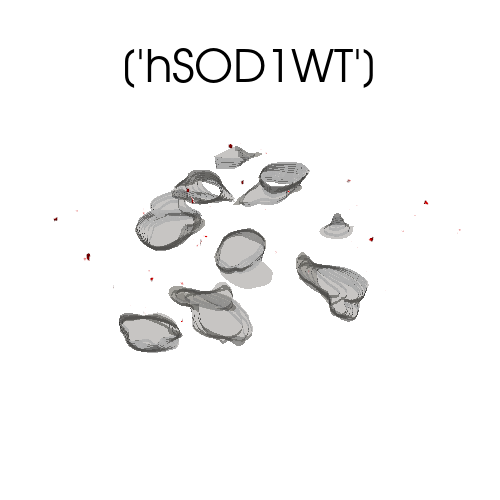

Protein Volume Inside Cells'
0    0.062714
1    0.114975
2    0.010452
3    0.020905
4    0.010452
5    0.010452
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      1.431964
1      0.010452
2      0.501710
3      0.010452
4      0.010452
         ...   
296    0.010452
297    0.010452
298    0.010452
299    0.010452
300    0.083618
Name: Proten_Volume_Voxel_Resolved, Length: 301, dtype: float64
Cell Volume
0     1442.594375
1      122.124613
2      280.435070
3     1281.681296
4     1110.807180
5     1701.236410
6     1293.032488
7      147.617760
8      626.907739
9     1812.124806
10     556.825102
11    1778.123491
12     326.132503
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    108080.637639
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
237    MS190-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(24, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8]
VoxelSize(x=0.1022

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


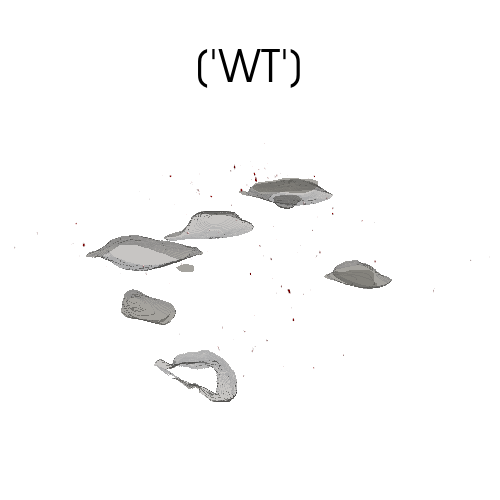

Protein Volume Inside Cells'
0    0.025086
1    0.003136
2    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.009407
2      0.003136
3      0.003136
4      0.003136
         ...   
607    0.028221
608    0.003136
609    0.003136
610    0.006271
611    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 612, dtype: float64
Cell Volume
0    1339.911030
1     846.617067
2    1041.829351
3      94.497107
4     352.768086
5     351.124985
6     998.616428
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    73886.819527
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
240    MS190-9_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(23, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


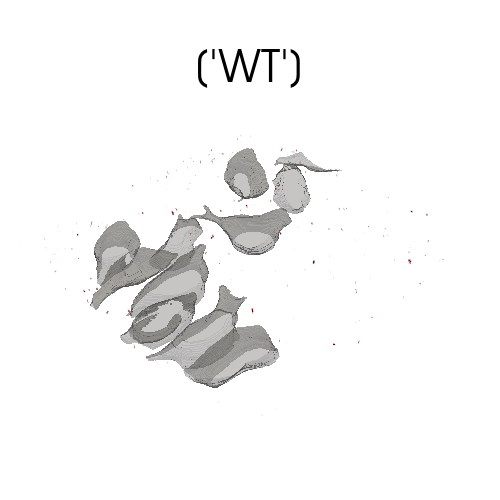

Protein Volume Inside Cells'
0     0.006271
1     0.006271
2     0.006271
3     0.003136
4     0.003136
5     0.003136
6     0.003136
7     0.006271
8     0.031357
9     0.006271
10    0.006271
11    0.003136
12    0.009407
13    0.003136
14    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.144242
1       0.072121
2       0.059578
3       0.003136
4       0.137970
          ...   
1220    0.003136
1221    0.003136
1222    0.003136
1223    0.006271
1224    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 1225, dtype: float64
Cell Volume
0      228.444310
1     1205.161091
2      858.046651
3      758.193788
4     1477.592839
5      749.141056
6     1051.907454
7      186.949745
8     1614.688273
9     1006.377257
10    1336.392788
11    1229.330977
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    63921.949703
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
243    MS193-1_Pyt

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


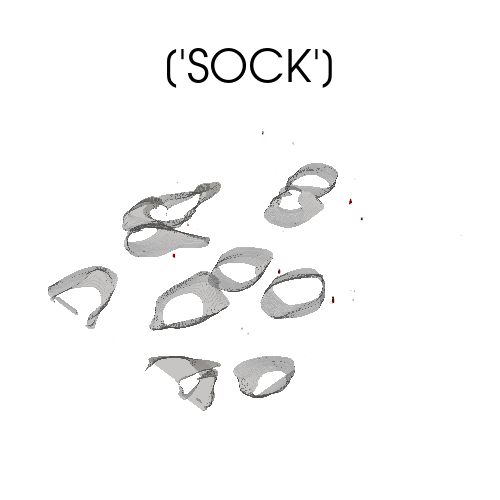

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0     0.003136
1     0.103478
2     0.134835
3     0.003136
4     0.385690
5     0.003136
6     0.034493
7     0.065849
8     0.003136
9     0.015678
10    0.006271
11    0.925028
12    0.003136
13    0.012543
14    0.003136
15    0.009407
16    0.003136
17    0.025086
18    0.062714
19    0.062714
20    0.319840
21    0.003136
22    0.504846
23    0.360604
24    0.012543
25    0.021950
26    0.021950
27    0.078392
28    0.624002
29    0.078392
30    0.009407
31    0.137970
32    0.006271
33    0.006271
34    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1096.315073
1      916.753010
2     1264.942991
3      619.991455
4     1053.067658
5     1461.688627
6      549.519993
7      255.985062
8     1260.292765
9     1038.957060
10     916.862759
11     604.244028
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    54721.5325

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


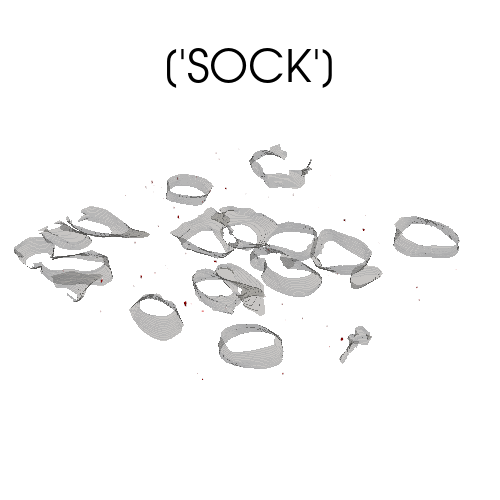

Protein Volume Inside Cells'
0    0.003136
1    0.015678
2    0.003136
3    0.018814
4    0.012543
5    0.003136
6    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.006271
1      0.028221
2      0.003136
3      0.028221
4      0.065849
         ...   
97     0.012543
98     0.006271
99     0.003136
100    0.025086
101    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 102, dtype: float64
Cell Volume
0      933.579114
1      596.226073
2      237.224238
3      920.754149
4      940.041768
5      790.946054
6      266.787509
7      625.751715
8      757.105704
9      543.508879
10    1102.674250
11      91.869400
12      97.704916
13     947.209952
14     363.260100
15     605.764837
16     655.437278
17     323.543470
18     828.546094
19     374.975032
20     219.535820
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    33809.66074
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from fol

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


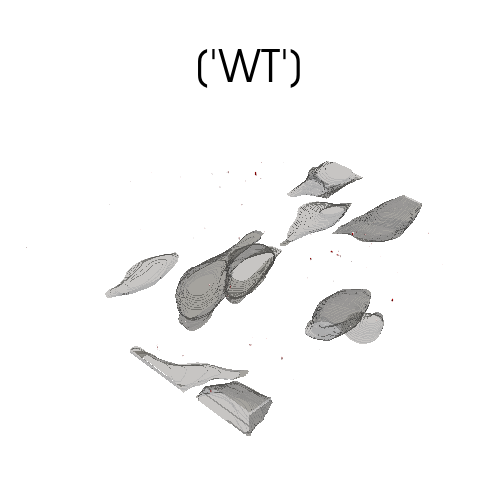

Protein Volume Inside Cells'
0     0.056442
1     0.003136
2     0.006271
3     0.015678
4     0.003136
5     0.003136
6     0.015678
7     0.003136
8     0.003136
9     0.018814
10    0.009407
11    0.128563
12    0.003136
13    0.006271
14    0.006271
15    0.012543
16    0.006271
17    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.012543
1      0.006271
2      0.025086
3      0.009407
4      0.003136
         ...   
380    0.003136
381    0.006271
382    0.003136
383    0.003136
384    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 385, dtype: float64
Cell Volume
0    1364.068374
1     744.334045
2     382.974173
3    2374.776017
4    2786.526403
5     240.309756
6    1469.374199
7     250.453708
8    1649.883240
9     903.338535
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    112778.252221
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
252    MS195-6_Python
Name: IM

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


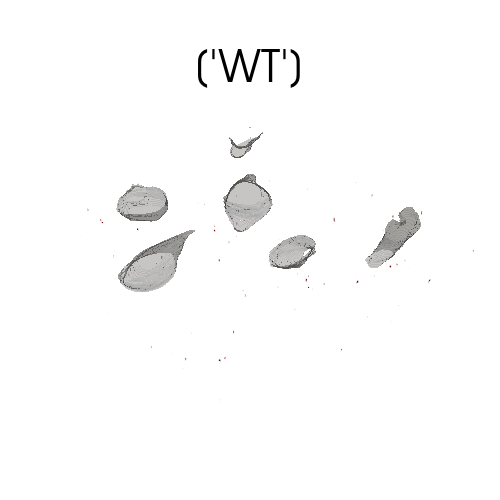

Protein Volume Inside Cells'
0    0.216363
1    0.147377
2    0.009407
3    0.021950
4    0.003136
5    0.047035
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.009407
1      0.003136
2      0.103478
3      0.003136
4      0.122292
         ...   
275    0.009407
276    0.006271
277    0.003136
278    0.003136
279    0.018814
Name: Proten_Volume_Voxel_Resolved, Length: 280, dtype: float64
Cell Volume
0    1694.946219
1    1366.874815
2     547.945878
3     707.207494
4     458.186796
5     954.070838
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    76470.95919
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
255    MS197-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


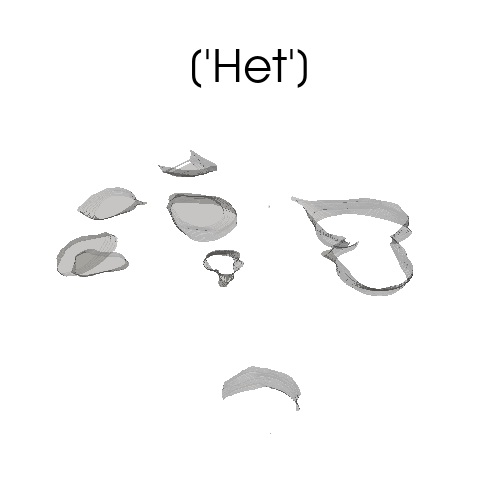

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    0.103478
1    0.003136
2    0.047035
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    2805.356212
1    2383.910278
2    1512.910098
3     548.761157
4    1021.898915
5     467.352413
6     231.351094
7     356.439977
8     600.233483
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    55831.939359
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
258    MS197-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


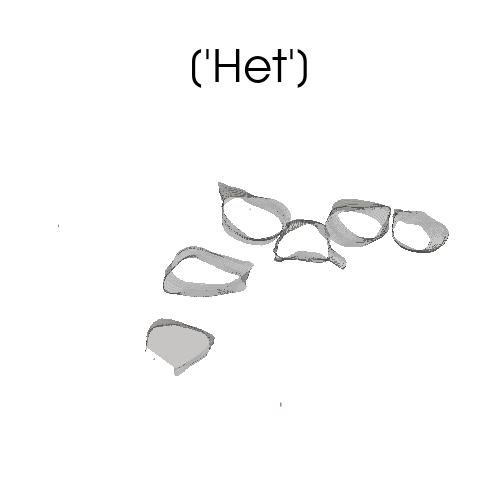

Protein Volume Inside Cells'
0    0.003136
1    0.059578
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.018814
1    0.116020
2    0.081528
3    0.012543
4    0.003136
5    0.006271
6    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1867.070429
1    1302.734308
2    1486.241067
3     638.683294
4    1071.684241
5    1380.408447
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    48149.30825
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
261    MS199-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11]


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


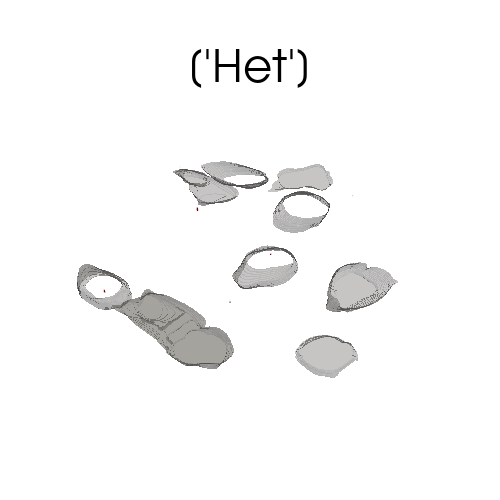

Protein Volume Inside Cells'
0    0.194413
1    0.094071
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.275941
1    0.009407
2    0.015678
3    0.006271
4    0.012543
5    0.003136
6    0.090935
7    0.028221
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     772.088024
1     507.172521
2     965.487880
3     737.529601
4     437.604137
5     599.067006
6    1111.469856
7     223.856798
8     897.891844
9     300.182591
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    49343.779779
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
264    MS199-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15]


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


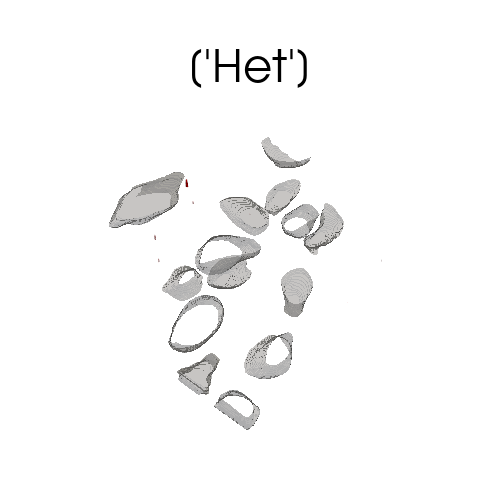

Protein Volume Inside Cells'
0    0.012543
1    0.037628
2    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.040764
1    1.740307
2    0.150513
3    0.326112
4    0.009407
5    0.188141
6    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1096.691356
1      302.151803
2     1008.823094
3      368.957645
4      353.338781
5     1528.343956
6      316.829961
7      536.390866
8      429.144050
9      531.185623
10     488.891457
11     554.295647
12     326.572545
13     264.050053
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    47790.4632
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
267    MS200-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(25, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


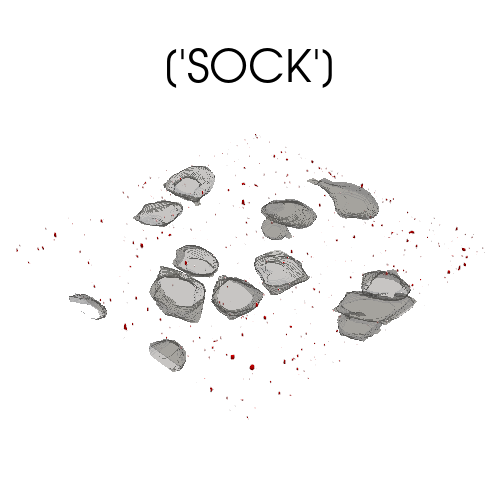

Protein Volume Inside Cells'
0     0.511117
1     0.072121
2     0.150513
3     0.125428
4     0.072121
5     0.166191
6     0.012543
7     0.068985
8     0.062714
9     0.037628
10    0.012543
11    0.034493
12    0.047035
13    0.015678
14    0.028221
15    0.034493
16    0.075257
17    0.031357
18    0.018814
19    0.012543
20    0.006271
21    0.040764
22    0.109749
23    0.015678
24    0.018814
25    0.003136
26    0.003136
27    0.065849
28    0.006271
29    0.009407
30    0.009407
31    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.987742
1      0.388825
2      0.639680
3      0.357468
4      0.536203
         ...   
693    0.012543
694    0.084664
695    0.172463
696    0.166191
697    0.009407
Name: Proten_Volume_Voxel_Resolved, Length: 698, dtype: float64
Cell Volume
0     1153.174512
1     1003.743279
2      693.905904
3     1405.776166
4      155.671253
5      940.584242
6      884.740767
7      823.566621
8      754.64418

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


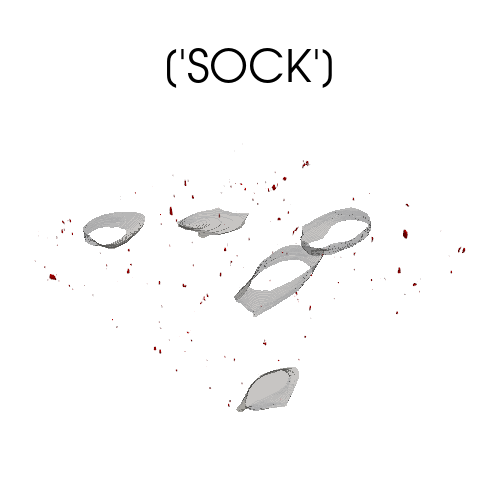

Protein Volume Inside Cells'
0    0.144242
1    0.068985
2    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.445268
1      0.131699
2      0.006271
3      0.009407
4      0.163056
         ...   
255    0.006271
256    0.018814
257    0.028221
258    0.006271
259    0.084664
Name: Proten_Volume_Voxel_Resolved, Length: 260, dtype: float64
Cell Volume
0     442.690224
1    1766.160839
2    1587.022094
3     335.060853
4    1005.772069
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    54047.431606
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
273    MS201-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(22, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 17 18 19 20 21 22 23 24]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


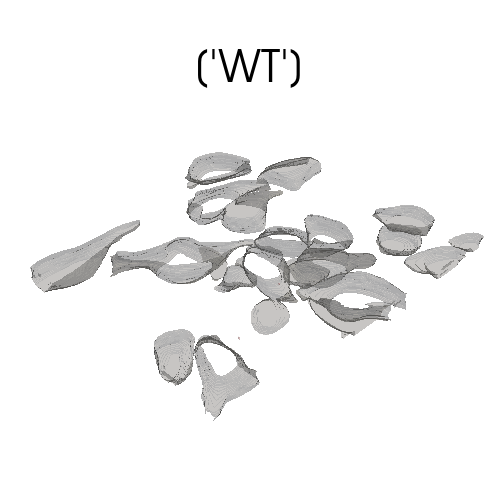

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    0.081528
1    0.075257
2    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1247.539920
1      982.003551
2      891.482497
3     1235.580404
4     1296.368861
5     1729.532863
6     1239.130004
7      188.451740
8     1161.054497
9      730.066663
10     226.650697
11     569.992903
12     851.668661
13     900.055469
14      46.091484
15     192.045239
16    1698.028601
17     319.184863
18     551.583276
19     499.944759
20     364.680566
21     111.395332
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    55303.635433
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
276    MS201-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(26, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


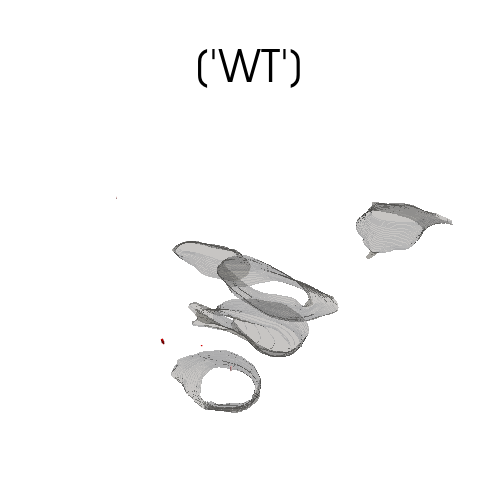

Protein Volume Inside Cells'
0    0.266534
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.094071
1    0.078392
2    0.937571
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1858.538221
1    2691.019604
2    1676.238702
3     749.332333
4    1857.484630
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    76655.585391
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
279    MS203-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


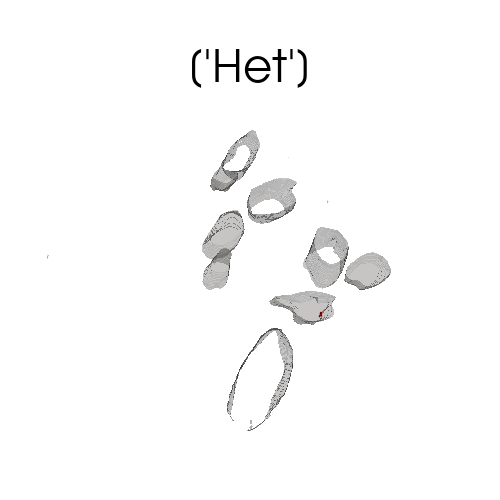

Protein Volume Inside Cells'
0    1.147662
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.018814
1    0.094071
2    0.003136
3    0.103478
4    0.090935
5    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    2095.304649
1    1009.550574
2     349.786046
3     664.555860
4     346.405774
5    1243.617174
6     275.517265
7     363.918594
8    1165.052500
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    58246.444549
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
282    MS203-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(25, 1024, 1024)
Number of unique cells:
[0 2 3 4 5]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


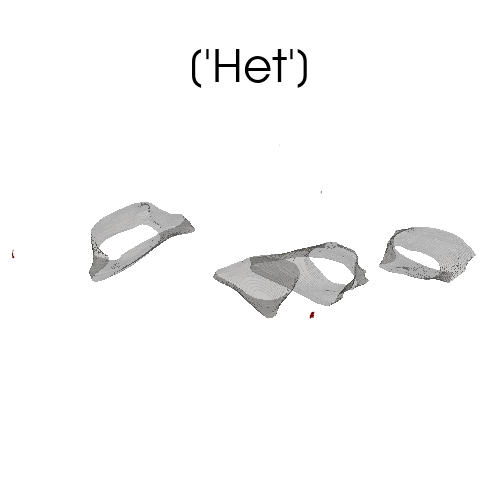

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    1.248004
1    0.018814
2    0.003136
3    0.451539
4    0.090935
5    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    2030.731417
1    2361.154587
2    1225.806463
3    2978.637491
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    73603.861273
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
284    MS204-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.204472930473117, y=0.204472930473117, z=0.3)


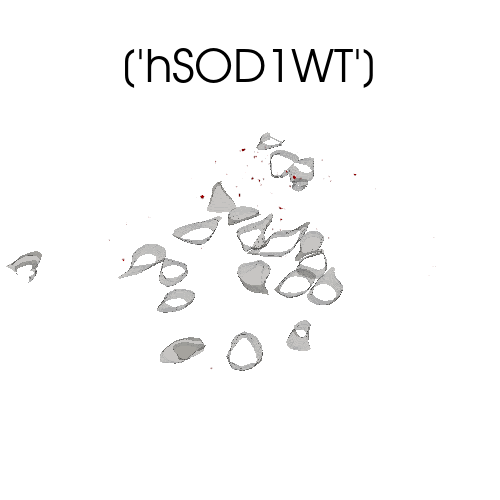

Protein Volume Inside Cells'
0     0.012543
1     0.050171
2     0.025086
3     0.012543
4     0.075257
5     0.025086
6     0.012543
7     0.012543
8     0.087799
9     0.012543
10    0.012543
11    0.012543
12    0.100342
13    0.012543
14    0.037628
15    0.012543
16    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.037628
1      0.012543
2      0.012543
3      0.852907
4      0.062714
         ...   
334    0.012543
335    0.062714
336    0.012543
337    0.037628
338    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 339, dtype: float64
Cell Volume
0      475.395454
1      500.493504
2     2005.874814
3     1369.355145
4     1391.881931
5     1506.046076
6     1167.730378
7      739.859418
8     2170.034376
9     1336.706357
10     906.502445
11     538.059052
12    1536.462254
13     538.121766
14     218.607656
15    1370.170424
16    1099.384912
17    1575.871586
18    1669.628671
19     441.956473
20     629.897095
21     

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


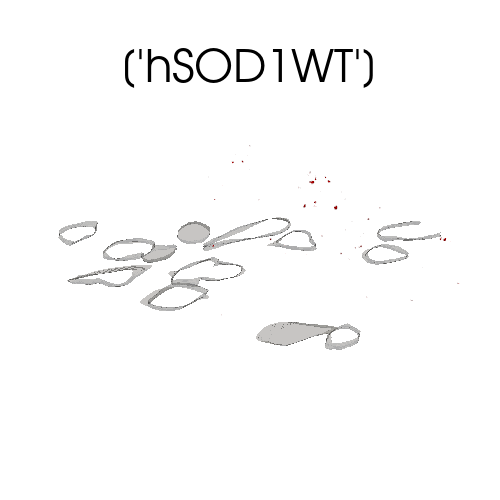

Protein Volume Inside Cells'
0    0.087799
1    0.025086
2    0.025086
3    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.012543
1      0.012543
2      0.037628
3      0.062714
4      0.087799
         ...   
319    0.012543
320    0.012543
321    0.012543
322    0.012543
323    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 324, dtype: float64
Cell Volume
0      822.917533
1      799.073758
2     1243.839808
3      440.927967
4     1161.622057
5     1019.098745
6      639.103477
7     1686.285448
8      874.443166
9      836.714563
10     566.832129
11     634.425029
12    1326.120273
13     853.521853
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    131767.410762
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
292    MS207-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(16, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6]
VoxelSize(x=0.1022364652365585, 

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


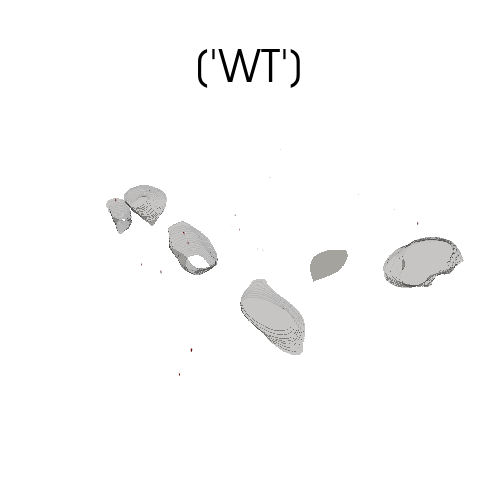

Protein Volume Inside Cells'
0    0.119156
1    0.106613
2    0.178734
3    0.031357
4    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.144242
1     0.247719
2     0.150513
3     0.021950
4     0.084664
5     0.065849
6     0.065849
7     0.003136
8     0.003136
9     0.021950
10    0.003136
11    0.166191
12    0.028221
13    0.018814
14    0.015678
15    0.028221
16    0.028221
17    0.012543
18    0.003136
19    0.028221
20    0.015678
21    0.078392
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     508.386032
1     213.461991
2     741.496247
3     556.064175
4    1288.137678
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    49300.576264
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
295    MS207-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11]


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


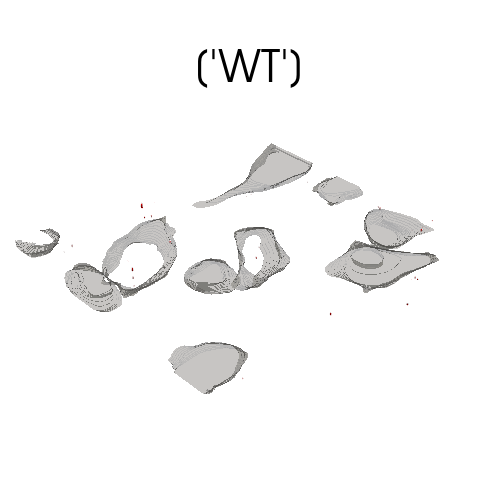

Protein Volume Inside Cells'
0     0.062714
1     0.228905
2     0.006271
3     0.116020
4     0.050171
5     0.137970
6     0.065849
7     0.304162
8     0.003136
9     0.003136
10    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.003136
1     0.188141
2     0.122292
3     0.015678
4     0.003136
5     0.062714
6     0.003136
7     0.056442
8     0.250855
9     0.037628
10    0.059578
11    0.896807
12    0.028221
13    0.031357
14    0.025086
15    0.031357
16    0.006271
17    0.018814
18    0.025086
19    0.012543
20    0.021950
21    0.122292
22    0.109749
23    0.094071
24    0.172463
25    0.072121
26    0.012543
27    0.197548
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    2284.919729
1     606.859192
2    1425.283284
3     586.154241
4    1439.745079
5    1289.260255
6     790.325188
7     361.905482
8     658.955520
9     399.853584
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    46052.86

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


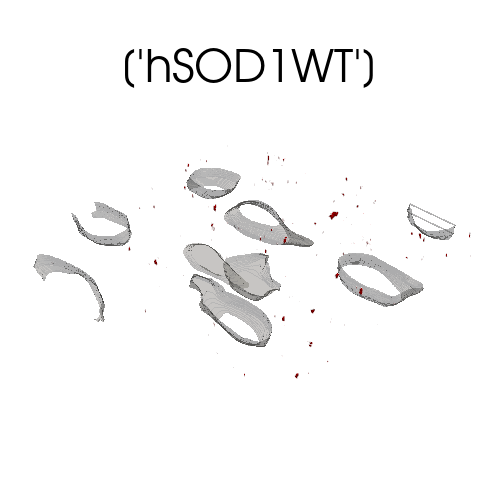

Protein Volume Inside Cells'
0    0.012543
1    0.015678
2    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.006271
1      0.009407
2      0.297890
3      0.003136
4      0.003136
         ...   
274    0.006271
275    0.053307
276    0.009407
277    0.006271
278    0.018814
Name: Proten_Volume_Voxel_Resolved, Length: 279, dtype: float64
Cell Volume
0    1505.654115
1     788.421825
2    1441.488522
3    1264.021099
4    1648.531759
5     527.215841
6     285.893258
7    1409.065503
8     886.989055
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    56002.872007
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
302    MS230-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(21, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


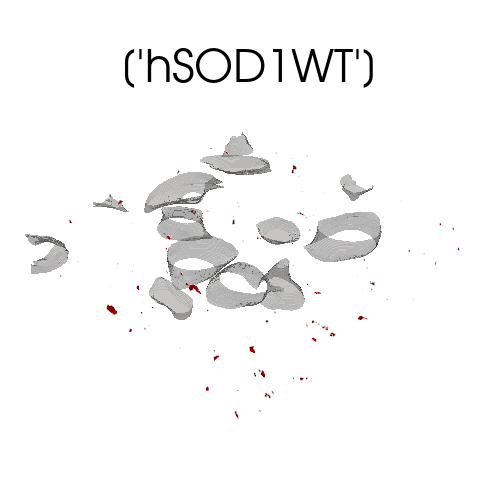

Protein Volume Inside Cells'
0    0.003136
1    0.003136
2    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.006271
1      0.003136
2      0.153649
3      0.548745
4      0.250855
         ...   
296    0.006271
297    0.003136
298    0.144242
299    0.028221
300    0.072121
Name: Proten_Volume_Voxel_Resolved, Length: 301, dtype: float64
Cell Volume
0     1474.256466
1      629.282500
2     1249.443283
3      208.611081
4      345.392947
5     1795.291385
6      837.391871
7     1050.164011
8       62.839196
9     1106.433940
10     191.371066
11     198.463993
12     512.258607
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    59386.960286
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
305    MS234-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(19, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13]
VoxelSize(x=0.1022364652365585, y=0.10

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


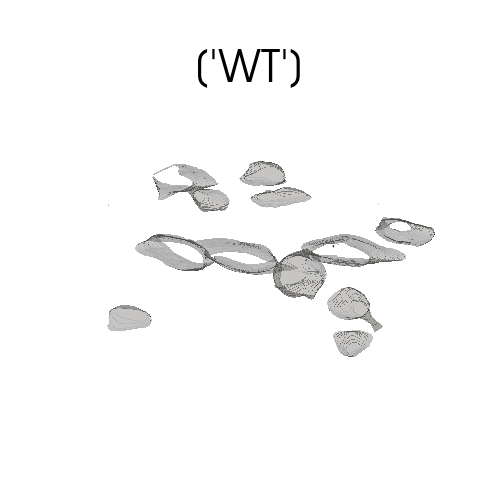

Protein Volume Inside Cells'
0    0.034493
1    0.006271
2    0.253991
3    0.006271
4    0.043900
5    0.003136
6    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.056442
1    0.006271
2    0.043900
3    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1209.598090
1      971.687136
2     1162.465557
3     1087.074200
4      119.149890
5      296.971646
6      713.632520
7      304.287207
8      259.631868
9      468.035993
10    1018.032611
11     134.119666
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    54727.458953
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
309    MS234-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


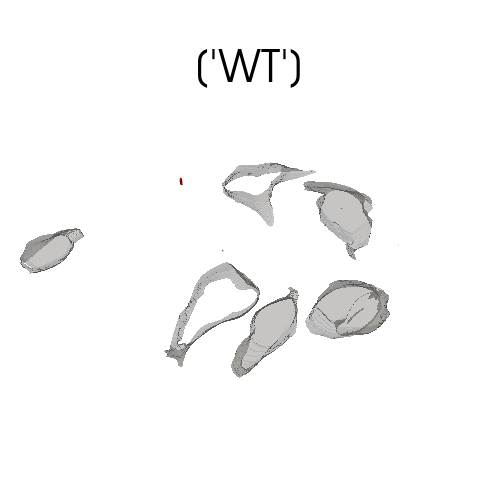

Protein Volume Inside Cells'
0    0.159920
1    0.134835
2    0.018814
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.006271
1    0.116020
2    1.837513
3    0.047035
4    0.009407
5    0.034493
6    0.047035
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1078.774032
1     373.880676
2    1062.543709
3    1934.541038
4    1375.174983
5    1530.331983
6     742.076349
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    47798.807267
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
313    MS238-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(24, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


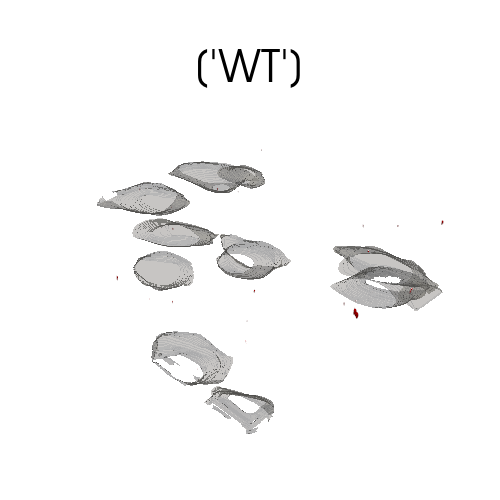

Protein Volume Inside Cells'
0     0.053307
1     0.015678
2     0.025086
3     0.166191
4     0.194413
5     0.003136
6     0.018814
7     0.003136
8     0.153649
9     0.009407
10    0.047035
11    0.028221
12    0.009407
13    0.012543
14    0.106613
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.097206
1     0.006271
2     0.006271
3     0.050171
4     0.009407
5     0.003136
6     0.053307
7     0.043900
8     0.103478
9     0.003136
10    0.012543
11    0.018814
12    0.141106
13    0.504846
14    0.062714
15    0.037628
16    0.003136
17    0.116020
18    0.006271
19    0.893671
20    0.285348
21    0.097206
22    1.119441
23    0.043900
24    0.006271
25    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1465.307211
1     1580.042052
2      880.488773
3     1397.629648
4      421.408306
5      782.181805
6     1223.624024
7      687.358586
8     1304.578093
9     1256.561296
10      79.433260
Name: Cell_Volum

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


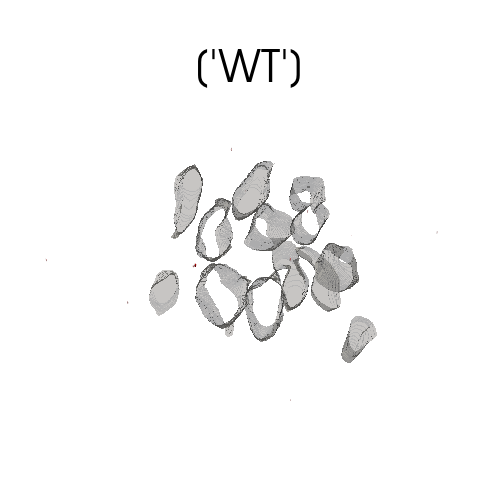

Protein Volume Inside Cells'
0     0.012543
1     0.018814
2     0.018814
3     0.021950
4     0.141106
5     0.015678
6     0.075257
7     0.009407
8     0.028221
9     0.003136
10    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.332383
1    0.081528
2    0.065849
3    0.015678
4    0.003136
5    0.050171
6    0.081528
7    0.062714
8    0.021950
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1284.321546
1     1419.444632
2     1026.868981
3      775.195491
4      863.872760
5      758.055818
6      302.869876
7      767.171264
8     1350.070661
9      169.530996
10    1588.132128
11     230.168939
12    1063.559672
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    67312.920818
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
320    MS239-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(30, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6 

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


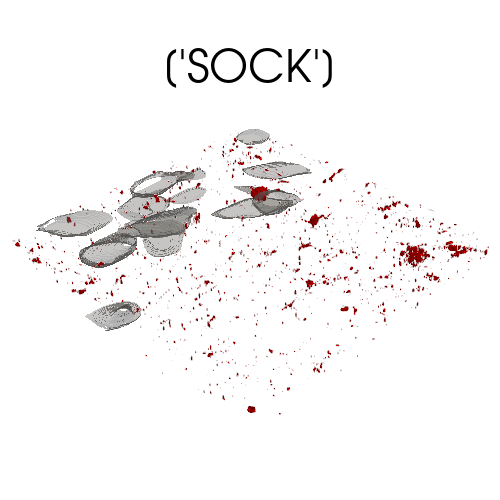

Protein Volume Inside Cells'
0     0.059578
1     0.009407
2     0.141106
3     0.003136
4     0.003136
        ...   
65    0.015678
66    0.009407
67    0.006271
68    0.081528
69    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 70, dtype: float64
Protein Volume Inside Void'
0       0.037628
1       0.059578
2       0.285348
3       0.141106
4       0.003136
          ...   
3573    0.015678
3574    0.009407
3575    0.006271
3576    0.003136
3577    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 3578, dtype: float64
Cell Volume
0      399.238989
1      498.317337
2     1247.006853
3      474.680517
4      382.083637
5      454.571347
6     1079.811945
7      825.096837
8      754.107986
9       64.582639
10      46.044449
11     372.300289
12     141.127930
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    91901.258721
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
323    MS239-5_Python
Name: IMAGE_ID, dtype: obj

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


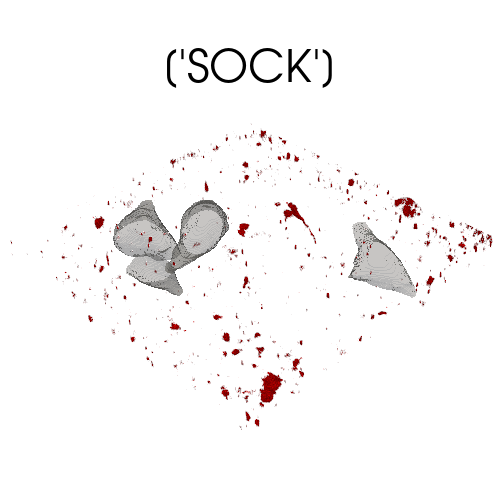

Protein Volume Inside Cells'
0     0.003136
1     0.100342
2     0.003136
3     0.009407
4     0.003136
        ...   
60    0.003136
61    0.003136
62    0.003136
63    0.003136
64    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 65, dtype: float64
Protein Volume Inside Void'
0       0.003136
1       0.003136
2       0.012543
3       0.094071
4       1.037913
          ...   
7264    0.003136
7265    0.006271
7266    0.009407
7267    0.003136
7268    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 7269, dtype: float64
Cell Volume
0     549.372616
1    2766.194599
2    2435.106663
3    1307.654203
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    108021.939642
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
326    MS242-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(31, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 18 19]
VoxelSize(x=0.1022364652365585, y=0.10223

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


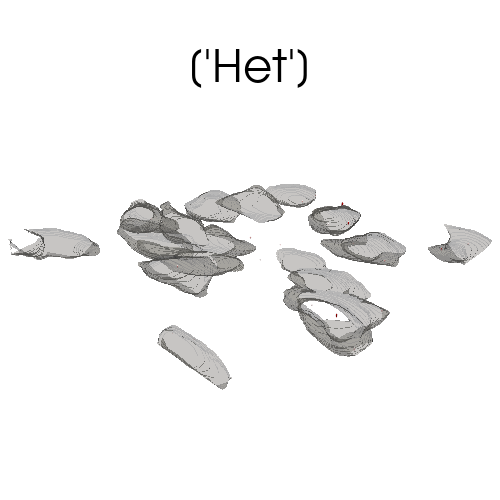

Protein Volume Inside Cells'
0     0.003136
1     0.003136
2     0.043900
3     0.053307
4     0.003136
5     0.081528
6     0.021950
7     0.006271
8     0.003136
9     0.059578
10    0.225770
11    0.012543
12    0.081528
13    0.003136
14    0.037628
15    0.012543
16    0.106613
17    0.047035
18    0.006271
19    0.015678
20    0.003136
21    0.009407
22    0.232041
23    0.116020
24    0.018814
25    0.078392
26    0.003136
27    0.006271
28    0.015678
29    0.003136
30    0.015678
31    0.031357
32    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.003136
1     0.003136
2     0.391961
3     0.031357
4     0.068985
5     0.037628
6     0.006271
7     0.018814
8     0.003136
9     0.006271
10    0.025086
11    0.078392
12    0.006271
13    0.012543
14    0.006271
15    0.025086
16    0.037628
17    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      496.545673
1      422.925979
2      940.076261
3      647

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


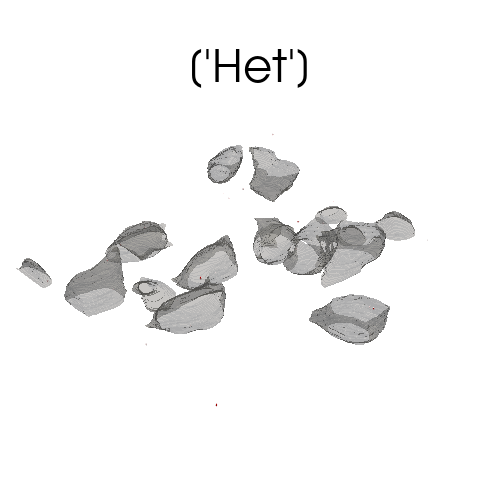

Protein Volume Inside Cells'
0     0.047035
1     0.166191
2     0.084664
3     0.025086
4     0.003136
5     0.009407
6     0.012543
7     0.015678
8     0.015678
9     0.009407
10    0.213227
11    0.081528
12    0.021950
13    0.028221
14    0.028221
15    0.043900
16    0.028221
17    0.021950
18    0.006271
19    0.034493
20    0.012543
21    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.015678
1     0.003136
2     0.012543
3     0.053307
4     0.006271
5     0.159920
6     0.009407
7     0.021950
8     0.003136
9     0.021950
10    0.081528
11    0.003136
12    0.003136
13    0.097206
14    0.003136
15    0.034493
16    0.037628
17    0.015678
18    0.078392
19    0.015678
20    0.072121
21    0.009407
22    0.003136
23    0.050171
24    0.131699
25    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1185.077006
1     1458.443189
2      237.760441
3     1019.569099
4     2062.693489
5     1586.852767
6

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


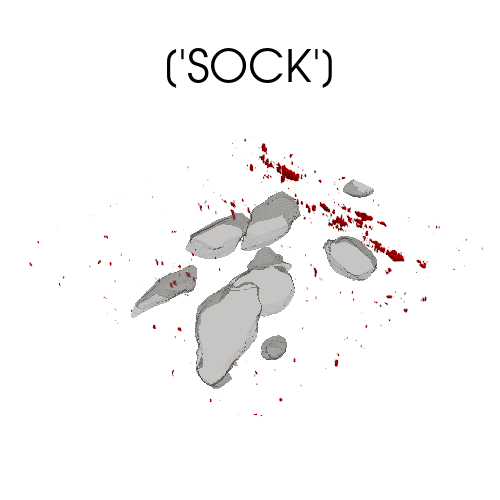

Protein Volume Inside Cells'
0     0.003136
1     0.021950
2     0.003136
3     0.003136
4     0.003136
5     0.702394
6     0.003136
7     0.050171
8     0.006271
9     0.003136
10    0.282212
11    0.529931
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       3.568413
1       1.442417
2       0.664766
3      27.198962
4       0.790193
         ...    
639     0.009407
640     0.015678
641     0.003136
642     0.003136
643     0.009407
Name: Proten_Volume_Voxel_Resolved, Length: 644, dtype: float64
Cell Volume
0    1160.270575
1     852.173507
2     981.586504
3     156.768744
4    1921.480895
5     122.702625
6     828.480245
7     407.978152
8     189.370497
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    45987.310644
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
335    MS243-9_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(22, 1024, 1024)
Number of unique cells:
[ 0  2  3  

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


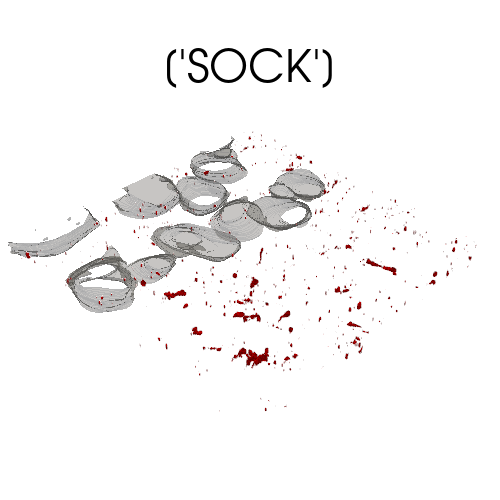

Protein Volume Inside Cells'
0     0.040764
1     0.028221
2     0.015678
3     0.003136
4     0.191277
5     0.015678
6     0.489167
7     0.003136
8     0.003136
9     0.009407
10    0.103478
11    0.087799
12    0.006271
13    0.012543
14    0.003136
15    0.003136
16    0.015678
17    0.188141
18    0.040764
19    0.025086
20    0.003136
21    0.043900
22    0.003136
23    0.034493
24    0.009407
25    0.021950
26    0.003136
27    0.006271
28    0.009407
29    0.034493
30    0.003136
31    0.003136
32    0.006271
33    0.003136
34    0.003136
35    0.119156
36    0.003136
37    0.059578
38    0.009407
39    0.031357
40    0.053307
41    0.012543
42    0.065849
43    0.031357
44    0.003136
45    0.043900
46    0.003136
47    0.003136
48    0.106613
49    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.009407
1       0.047035
2       0.144242
3       0.018814
4       0.028221
          ...   
1182    0.003136
1183    0.018814
1184  

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


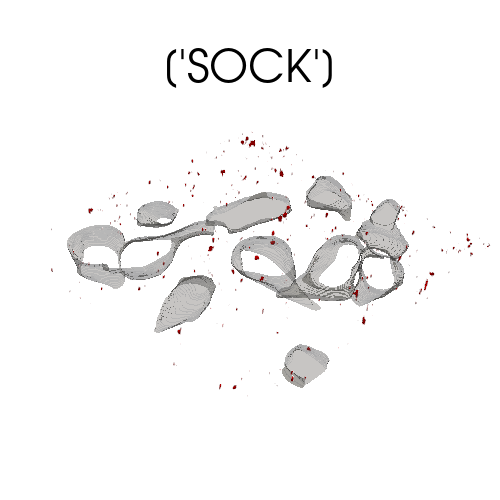

Protein Volume Inside Cells'
0     0.084664
1     0.147377
2     0.432725
3     0.153649
4     0.388825
        ...   
79    0.627138
80    0.131699
81    0.050171
82    0.015678
83    0.009407
Name: Proten_Volume_Voxel_Resolved, Length: 84, dtype: float64
Protein Volume Inside Void'
0      0.012543
1      0.047035
2      0.250855
3      0.370011
4      1.953534
         ...   
679    0.012543
680    0.006271
681    0.003136
682    0.003136
683    0.028221
Name: Proten_Volume_Voxel_Resolved, Length: 684, dtype: float64
Cell Volume
0     1893.196986
1     1501.386443
2      514.165106
3      916.197993
4     1825.441030
5      784.157288
6      919.731914
7      721.120544
8      235.408674
9     1351.353158
10    2009.916717
11     275.231918
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    52812.845215
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
342    MS244-7_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(25

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


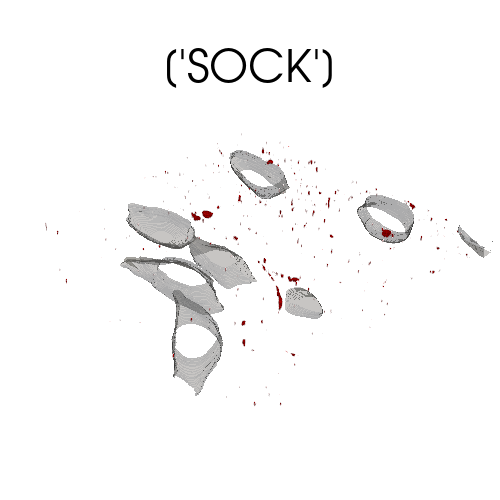

Protein Volume Inside Cells'
0     0.068985
1     0.009407
2     0.009407
3     0.003136
4     0.238312
5     0.009407
6     0.109749
7     0.015678
8     0.003136
9     0.003136
10    0.006271
11    0.081528
12    0.003136
13    0.009407
14    0.018814
15    0.009407
16    0.103478
17    0.009407
18    0.003136
19    0.072121
20    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.203820
1       0.040764
2       0.003136
3       0.003136
4       0.003136
          ...   
1028    0.003136
1029    0.072121
1030    0.003136
1031    0.003136
1032    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 1033, dtype: float64
Cell Volume
0    1864.069576
1    1454.344845
2    1948.852320
3    2029.643333
4    1855.882293
5     937.715087
6     237.537807
7     166.257337
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    71705.888634
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
345    M

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


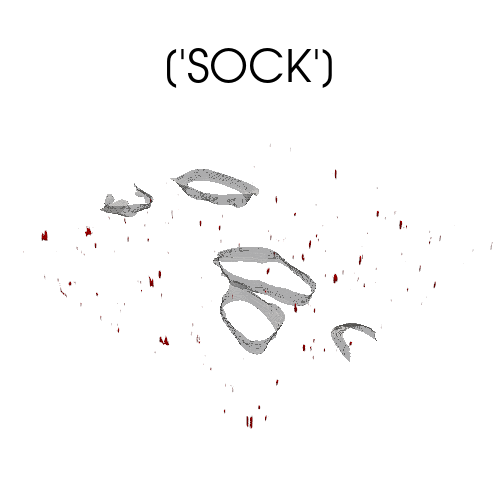

Protein Volume Inside Cells'
0    0.507982
1    0.322976
2    0.457811
3    0.043900
4    0.015678
5    0.003136
6    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.009407
1      0.134835
2      0.050171
3      0.125428
4      0.918757
         ...   
261    0.003136
262    0.034493
263    0.003136
264    0.003136
265    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 266, dtype: float64
Cell Volume
0    1717.808524
1    2631.137362
2    1818.598957
3     834.877049
4     523.456151
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    64810.29024
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
348    MS246-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 968, 968)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 12 13 14 15 16 17]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


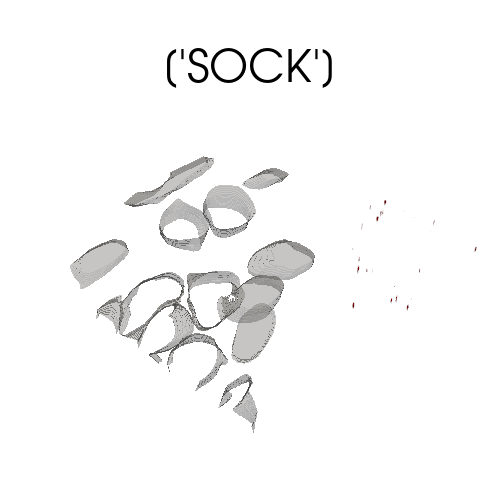

Protein Volume Inside Cells'
0    0.003136
1    0.015678
2    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.021950
1     0.395097
2     0.486032
3     0.053307
4     0.003136
5     0.009407
6     0.006271
7     0.003136
8     0.163056
9     0.034493
10    0.012543
11    0.094071
12    0.003136
13    0.003136
14    0.191277
15    0.003136
16    0.178734
17    0.031357
18    0.301026
19    0.178734
20    0.112885
21    0.003136
22    0.442132
23    0.003136
24    0.003136
25    0.003136
26    0.003136
27    0.178734
28    0.090935
29    0.006271
30    0.294755
31    0.100342
32    0.006271
33    0.003136
34    0.003136
35    0.003136
36    0.244584
37    0.109749
38    0.003136
39    0.028221
40    0.006271
41    0.006271
42    0.078392
43    0.003136
44    0.012543
45    0.003136
46    0.012543
47    0.003136
48    0.003136
49    0.003136
50    0.003136
51    0.003136
52    0.009407
53    0.006271
54    0.006271
55    0.003136
Name: Prot

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


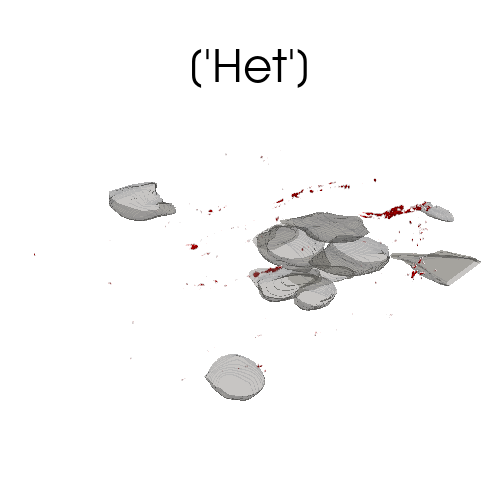

Protein Volume Inside Cells'
0     0.062714
1     0.003136
2     0.003136
3     0.003136
4     0.006271
5     0.006271
6     0.003136
7     0.006271
8     0.040764
9     0.034493
10    0.006271
11    0.009407
12    0.037628
13    0.015678
14    0.031357
15    0.003136
16    0.009407
17    0.043900
18    0.012543
19    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.084664
1       0.028221
2       0.006271
3       0.040764
4       0.003136
          ...   
1188    0.006271
1189    0.003136
1190    0.003136
1191    0.003136
1192    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 1193, dtype: float64
Cell Volume
0      957.153220
1     1083.292559
2     1197.168221
3      659.764528
4      336.926588
5       68.953789
6      819.458869
7      148.020173
8      349.876981
9      156.078892
10     501.164542
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    128530.455256
Name: Void_Volume_Voxel_Resolved, dtype: float64
M

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


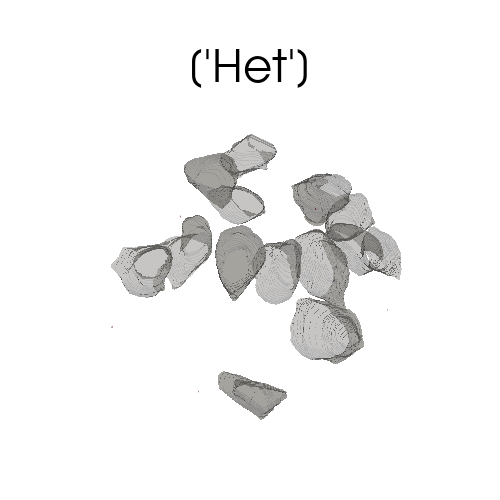

Protein Volume Inside Cells'
0     0.021950
1     0.012543
2     0.009407
3     0.040764
4     0.056442
5     0.006271
6     0.006271
7     0.109749
8     0.056442
9     0.034493
10    0.028221
11    0.003136
12    0.003136
13    0.009407
14    0.009407
15    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.009407
1    0.043900
2    0.003136
3    0.112885
4    0.012543
5    0.084664
6    0.015678
7    0.040764
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1714.152311
1     1396.199774
2     1388.642765
3     1009.566252
4     1252.372016
5      695.627397
6      842.509315
7     1487.971967
8     1143.974402
9      642.204672
10    1510.708844
11     779.576048
12    1343.557836
13     414.120966
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    86307.052561
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
357    MS249-3_Python
Name: IMAGE_ID, dtype: object
shap

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


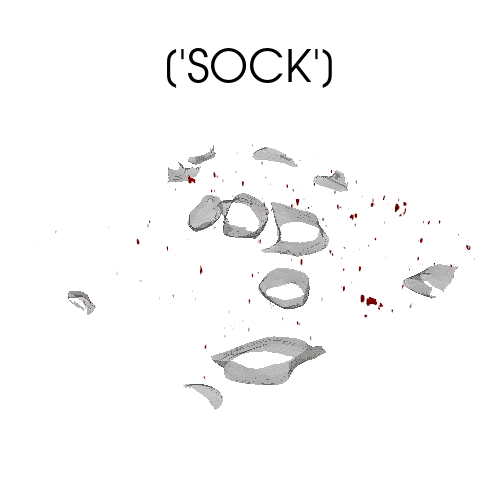

Protein Volume Inside Cells'
0    0.006271
1    0.025086
2    0.021950
3    0.025086
4    0.128563
5    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.087799
1      0.119156
2      0.116020
3      0.015678
4      0.241448
         ...   
354    0.006271
355    0.037628
356    0.003136
357    0.003136
358    0.015678
Name: Proten_Volume_Voxel_Resolved, Length: 359, dtype: float64
Cell Volume
0      117.729423
1     1603.719635
2     1477.367069
3      931.161499
4     1394.939227
5      109.582904
6      452.338737
7      472.131202
8      170.869935
9       70.521633
10     107.212324
11      82.844889
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    62057.742157
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
361    MS249-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(23, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10]
VoxelSize(x=0.102236465

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


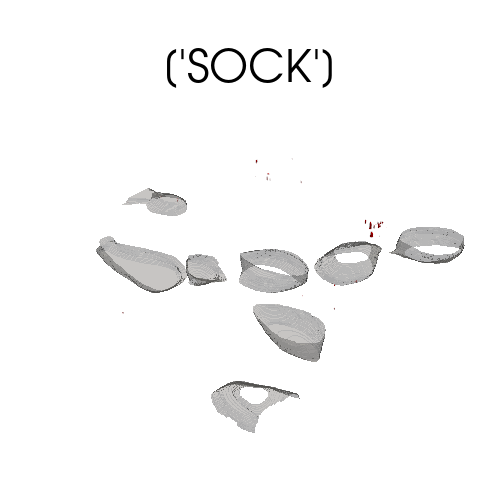

Protein Volume Inside Cells'
0    0.003136
1    0.112885
2    0.003136
3    0.213227
4    0.065849
5    0.018814
6    0.040764
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.081528
1     0.047035
2     0.003136
3     0.200684
4     0.003136
5     0.003136
6     0.235177
7     0.009407
8     0.015678
9     0.137970
10    0.275941
11    0.021950
12    0.203820
13    0.457811
14    0.090935
15    0.012543
16    1.348346
17    0.194413
18    0.329247
19    0.056442
20    0.012543
21    0.037628
22    0.081528
23    0.003136
24    0.037628
25    0.021950
26    0.003136
27    1.326396
28    0.034493
29    0.087799
30    0.075257
31    0.297890
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1417.679240
1    1390.285865
2    1404.409006
3    1089.864962
4     474.100415
5    1371.249101
6    1024.946804
7     333.057148
8      80.389645
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    67038.193746
Name: Void_Volume_V

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


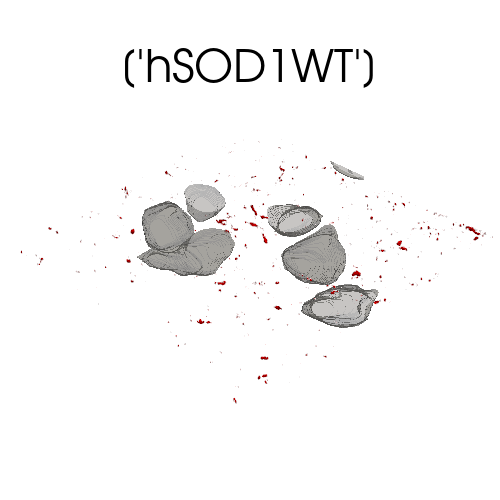

Protein Volume Inside Cells'
0     0.003136
1     0.056442
2     0.015678
3     0.003136
4     0.003136
5     0.003136
6     0.015678
7     0.003136
8     0.003136
9     0.003136
10    0.006271
11    0.012543
12    0.003136
13    0.003136
14    0.009407
15    0.003136
16    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.006271
1       0.012543
2       0.003136
3       0.003136
4       0.003136
          ...   
1982    0.043900
1983    0.003136
1984    0.003136
1985    0.009407
1986    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 1987, dtype: float64
Cell Volume
0     572.996893
1    2178.698283
2    1322.993991
3      57.596325
4    1941.853463
5    1940.824957
6    1315.772501
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    109037.538959
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
368    MS259-9_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(31, 1024

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


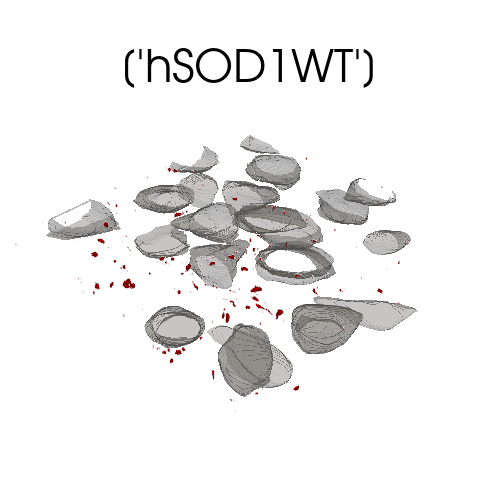

Protein Volume Inside Cells'
0     0.181870
1     0.025086
2     0.006271
3     0.003136
4     0.003136
5     0.141106
6     0.228905
7     0.003136
8     0.028221
9     0.003136
10    0.059578
11    0.006271
12    0.006271
13    0.109749
14    0.043900
15    0.003136
16    0.003136
17    0.006271
18    0.003136
19    0.404504
20    0.015678
21    0.003136
22    0.018814
23    0.053307
24    0.018814
25    0.003136
26    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.128563
1      0.043900
2      0.003136
3      0.065849
4      0.006271
         ...   
691    0.097206
692    0.034493
693    0.009407
694    0.028221
695    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 696, dtype: float64
Cell Volume
0      605.517118
1      206.792382
2      455.577903
3     1181.806483
4     1413.822343
5     1123.213009
6     1363.688956
7     1480.540386
8     1041.562817
9      564.292222
10     662.608597
11    1019.600455
12    1336.508808
1

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


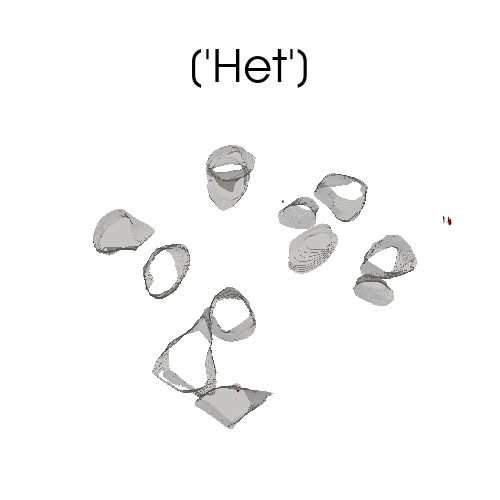

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0     0.003136
1     0.003136
2     0.272805
3     0.053307
4     0.774515
5     0.410775
6     0.003136
7     0.003136
8     0.003136
9     0.329247
10    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      674.289037
1      847.664387
2     1242.165350
3      966.811140
4      407.695941
5     1369.828634
6      487.116658
7      949.546040
8     1461.930075
9      495.322754
10     292.493883
11     954.842218
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    55610.44687
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
374    MS274-8_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


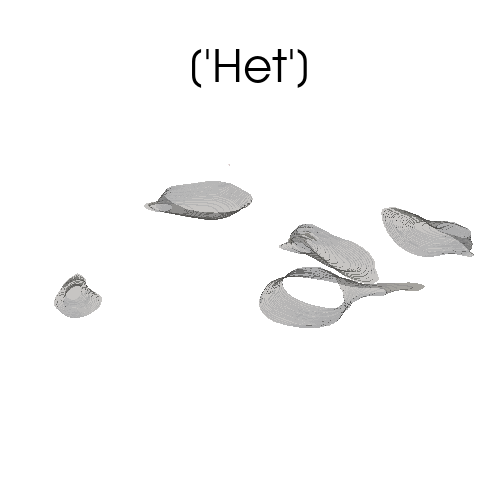

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0     0.015678
1     0.003136
2     0.003136
3     0.003136
4     0.003136
5     0.003136
6     0.003136
7     0.006271
8     0.003136
9     0.006271
10    0.003136
11    0.043900
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1106.537418
1    1582.180591
2     661.514242
3     287.022106
4     909.274393
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    61213.624234
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
377    MS276-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(26, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


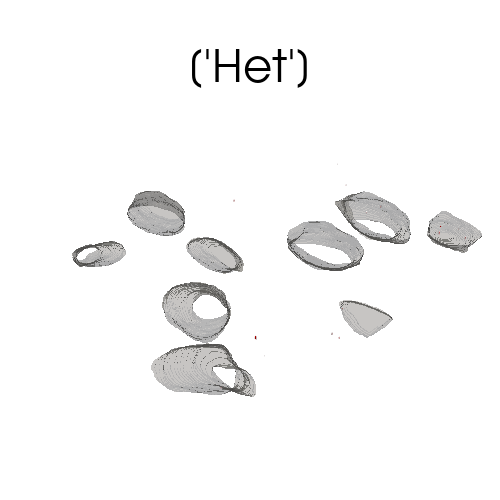

Protein Volume Inside Cells'
0     0.003136
1     0.050171
2     0.015678
3     0.094071
4     0.062714
5     0.009407
6     0.009407
7     0.006271
8     0.125428
9     0.006271
10    0.006271
11    0.012543
12    0.047035
13    0.012543
14    0.009407
15    0.018814
16    0.047035
17    0.053307
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.034493
1    0.094071
2    0.047035
3    0.178734
4    0.015678
5    0.009407
6    0.087799
7    0.003136
8    0.081528
9    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1360.333769
1     563.614913
2    1829.711837
3     675.383392
4    1532.304331
5    1857.788792
6     546.415662
7     185.792676
8    1273.020524
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    75663.832984
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
380    MS276-8_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(41, 1024, 1024)
Numbe

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


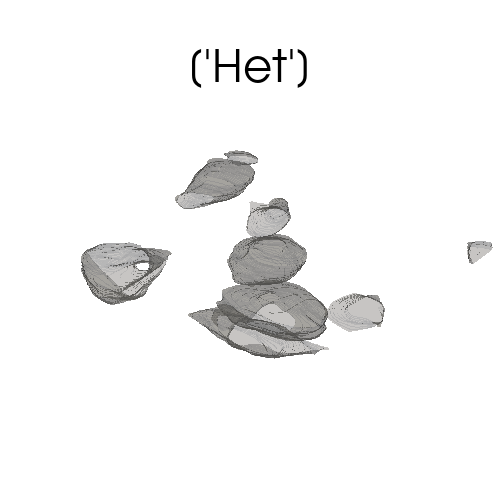

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    0.012543
1    0.003136
2    0.006271
3    0.006271
4    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    2362.556239
1     166.859389
2     681.635955
3    2582.277065
4    3175.975772
5    1327.816680
6     370.766938
7    3079.180206
8     100.668142
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    120960.577233
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
383    MS279-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


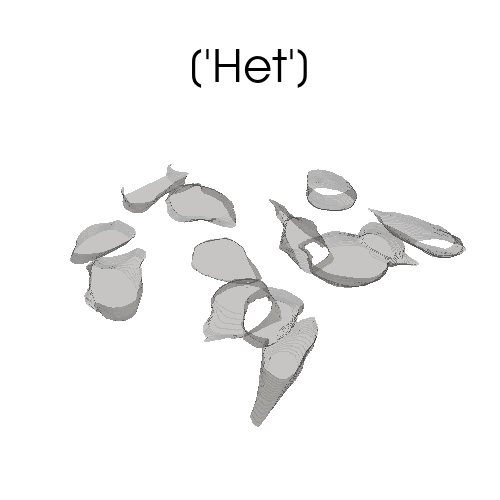

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Cell Volume
0     1031.948797
1      687.524778
2     1552.852497
3      868.372473
4      836.827447
5     1026.354728
6      826.485947
7      907.960540
8      341.319687
9     1176.949302
10     737.288153
11     992.752691
12     578.904530
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    54194.611415
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
386    MS279-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(16, 1024, 1024)
Number of unique cells:
[0 2 3 4 5]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


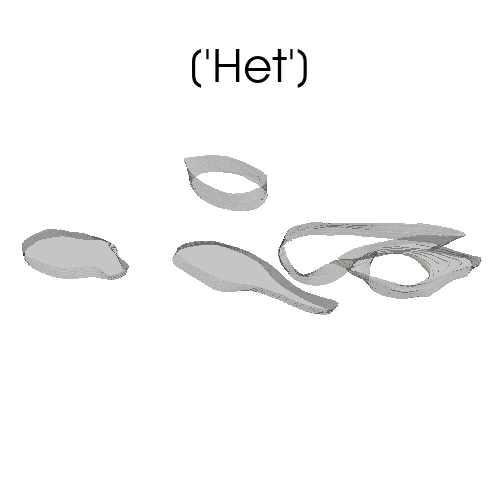

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Cell Volume
0    2926.773204
1    2112.503900
2     974.239586
3     775.330325
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    45819.275372
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
389    MS288-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(16, 1024, 1024)
Number of unique cells:
[0 2 3 4 5]


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


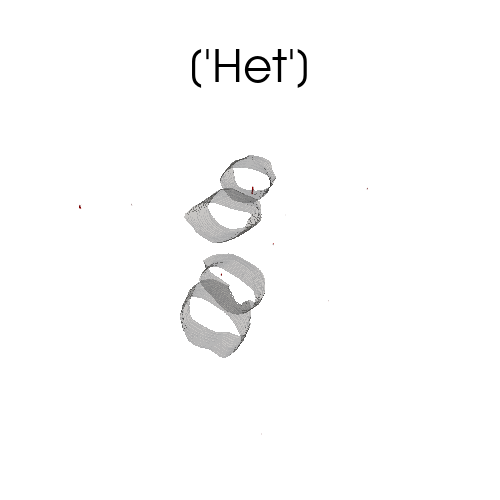

Protein Volume Inside Cells'
0    0.006271
1    0.062714
2    0.551881
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.015678
1     0.301026
2     0.053307
3     0.006271
4     0.003136
5     0.018814
6     0.034493
7     0.072121
8     0.003136
9     0.003136
10    0.012543
11    0.006271
12    0.003136
13    0.003136
14    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     913.266125
1    1078.454192
2     748.720873
3     968.225336
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    48899.455862
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
392    MS288-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8]


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


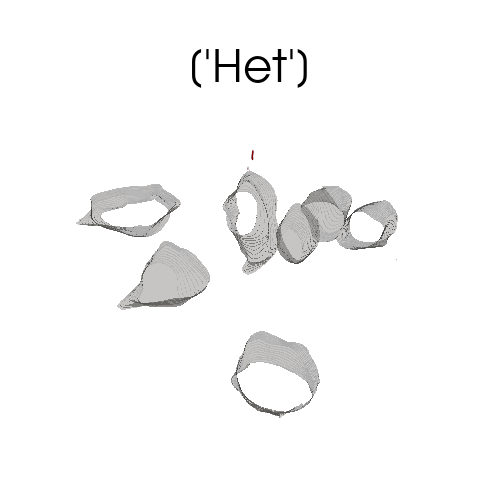

Protein Volume Inside Cells'
0    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    1.200969
1    0.025086
2    0.131699
3    0.021950
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1010.350175
1     731.512215
2     681.096616
3    1677.038302
4    1445.179227
5    1036.893777
6    1805.247196
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    47508.812528
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
395    MS290-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[0 2 3 4 6 7]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


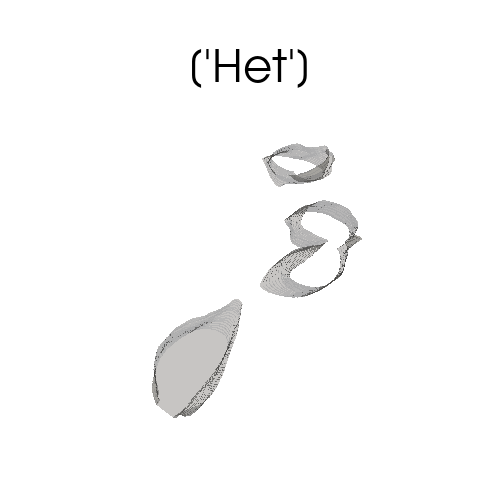

Protein Volume Inside Cells'
0    0.003136
1    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1046.567376
1     172.444050
2    1273.001710
3    1285.864304
4    1733.515187
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    50384.737409
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
398    MS290-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8 9]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


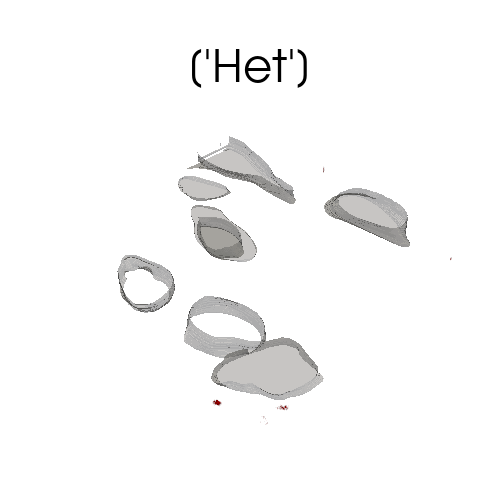

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0      0.003136
1      0.197548
2      2.047605
3      0.003136
4      0.003136
         ...   
110    0.003136
111    0.003136
112    0.003136
113    0.003136
114    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 115, dtype: float64
Cell Volume
0    2074.314350
1     364.655481
2     829.314338
3    1507.899268
4    1019.920296
5    1829.890571
6     229.501037
7    2083.859386
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    55820.798258
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
401    MS292-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(15, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


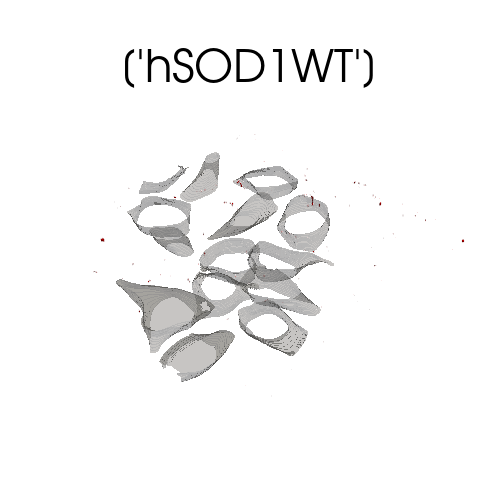

Protein Volume Inside Cells'
0     0.003136
1     0.028221
2     0.006271
3     0.003136
4     0.006271
5     0.225770
6     0.065849
7     0.003136
8     0.009407
9     0.065849
10    0.006271
11    0.031357
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.028221
1      0.053307
2      0.006271
3      0.003136
4      0.003136
         ...   
364    0.003136
365    0.003136
366    0.009407
367    0.003136
368    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 369, dtype: float64
Cell Volume
0      717.850021
1      707.640219
2      602.701269
3      881.652114
4      859.953150
5      802.093426
6     1155.852390
7      823.224831
8      655.694404
9     1240.481485
10     247.013857
11    1215.057323
12     362.187694
13     300.844221
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    38747.868334
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
404    MS292-4_Python
Name: IMAGE_ID, d

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


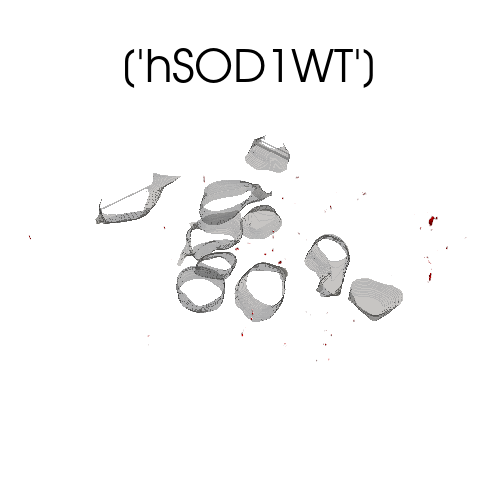

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0      0.188141
1      0.003136
2      0.003136
3      0.003136
4      0.003136
         ...   
159    0.003136
160    0.003136
161    0.112885
162    0.216363
163    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 164, dtype: float64
Cell Volume
0    1815.726667
1    1492.615922
2    1165.980664
3     577.230072
4    1305.995424
5     537.808197
6    1645.549719
7     779.180951
8    1713.904591
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    58014.168427
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
407    MS300-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(32, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


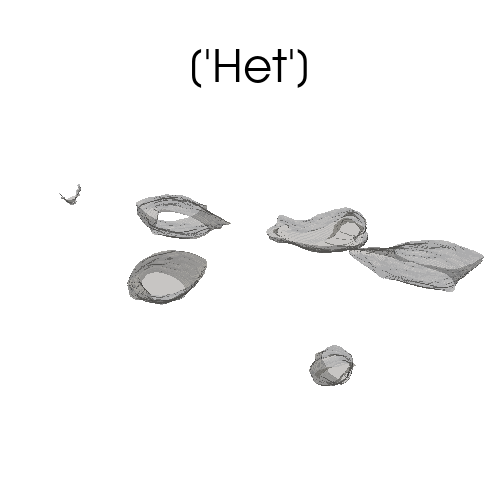

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0    0.003136
1    0.006271
2    0.006271
3    0.003136
4    0.003136
5    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      65.680130
1    2056.431519
2    1812.757170
3    1748.362672
4    2344.554252
5     407.492121
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    96780.966912
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
410    MS300-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(36, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


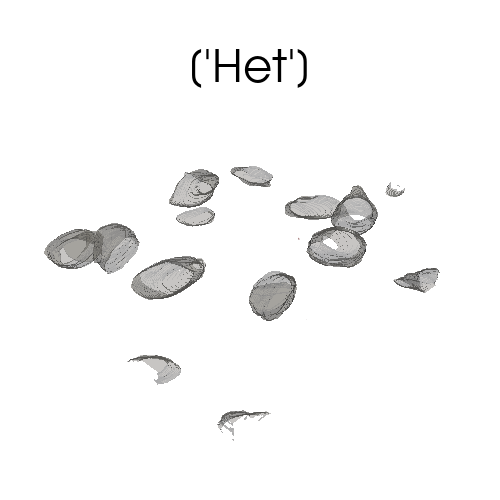

Protein Volume Inside Cells'
0    0.003136
1    0.018814
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.084664
1    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1023.034034
1      150.857971
2      266.734202
3     1163.603812
4     1048.025471
5     1532.796634
6      523.838705
7     1689.107567
8     2001.425272
9       51.789030
10    1036.758943
11     287.683737
12     202.239362
13     255.470809
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    107134.909823
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
413    MS301-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(41, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  9 10 11 12 13 14 15]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


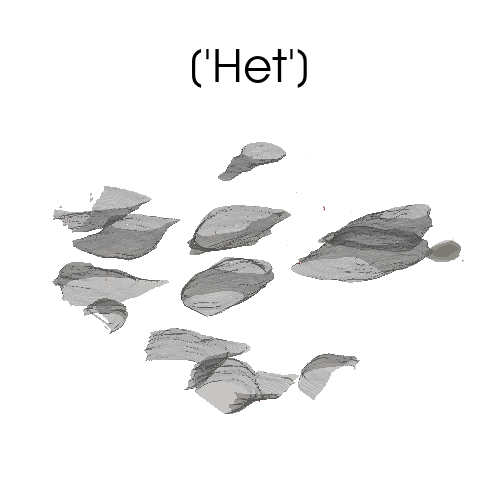

Protein Volume Inside Cells'
0     0.172463
1     0.050171
2     0.003136
3     0.040764
4     0.040764
5     0.068985
6     0.097206
7     0.009407
8     0.047035
9     0.018814
10    0.003136
11    0.034493
12    0.003136
13    0.003136
14    0.021950
15    0.043900
16    0.147377
17    0.109749
18    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.021950
1     0.175599
2     0.003136
3     0.025086
4     0.003136
5     0.232041
6     0.003136
7     0.003136
8     0.072121
9     0.003136
10    0.037628
11    0.003136
12    0.018814
13    0.006271
14    0.003136
15    0.003136
16    0.172463
17    0.094071
18    0.003136
19    0.003136
20    0.003136
21    0.009407
22    0.012543
23    0.003136
24    0.006271
25    0.009407
26    0.003136
27    0.031357
28    0.025086
29    0.006271
30    0.003136
31    0.003136
32    0.003136
33    0.003136
34    0.018814
35    0.003136
36    0.006271
37    0.003136
38    0.003136
39    0.006271
40    0

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


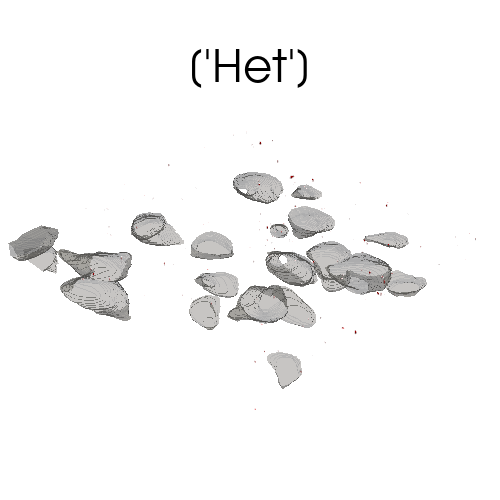

Protein Volume Inside Cells'
0     0.003136
1     0.006271
2     0.003136
3     0.181870
4     0.047035
5     0.043900
6     0.015678
7     0.006271
8     0.031357
9     0.003136
10    0.047035
11    0.072121
12    0.112885
13    0.094071
14    0.006271
15    0.006271
16    0.047035
17    0.003136
18    0.003136
19    0.021950
20    0.012543
21    0.006271
22    0.062714
23    0.003136
24    0.003136
25    0.003136
26    0.097206
27    0.172463
28    0.021950
29    0.009407
30    0.003136
31    0.009407
32    0.003136
33    0.003136
34    0.003136
35    0.087799
36    0.188141
37    0.009407
38    0.068985
39    0.169327
40    0.031357
41    0.006271
42    0.003136
43    0.012543
44    0.225770
45    0.006271
46    0.050171
47    0.006271
48    0.103478
49    0.068985
50    0.056442
51    0.006271
52    0.021950
53    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.012543
1      0.028221
2      0.153649
3      0.021950
4      0.025086
  

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


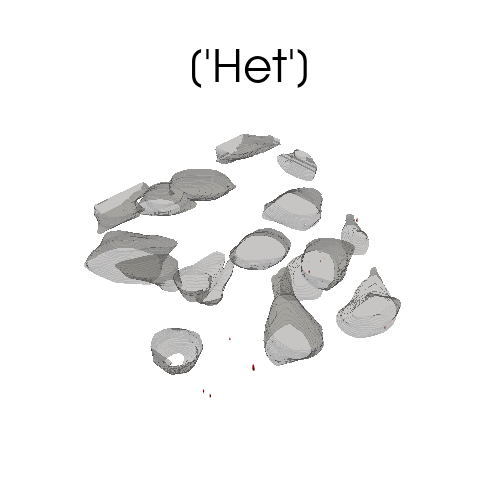

Protein Volume Inside Cells'
0     0.018665
1     0.003111
2     0.006222
3     0.062215
4     0.031108
5     0.006222
6     0.003111
7     0.087101
8     0.208420
9     0.121319
10    0.003111
11    0.024886
12    0.015554
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.771467
1     0.012443
2     0.006222
3     0.003111
4     0.003111
5     0.136873
6     0.155538
7     0.003111
8     0.006222
9     0.003111
10    0.006222
11    0.087101
12    0.332851
13    0.009332
14    0.003111
15    0.006222
16    0.006222
17    0.003111
18    0.177313
19    0.003111
20    0.009332
21    0.003111
22    0.006222
23    0.006222
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1175.522320
1     1042.817612
2     1188.484827
3      283.513997
4      208.684842
5      769.180255
6     1684.189484
7      442.168604
8      245.976545
9      491.442926
10    1533.202882
11     798.184913
12    1072.911033
13       0.003111
14     374.391525
15  

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


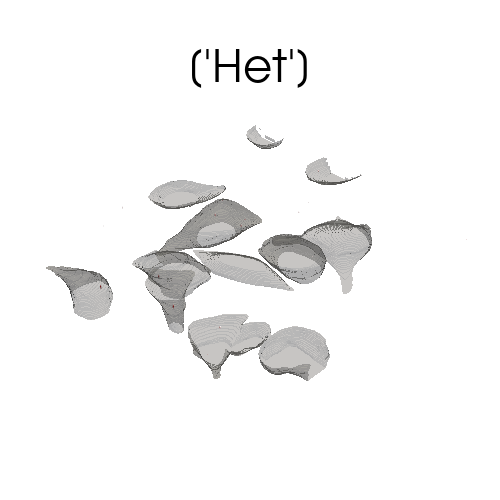

Protein Volume Inside Cells'
0     0.018665
1     0.071547
2     0.003111
3     0.037329
4     0.059104
5     0.003111
6     0.003111
7     0.186645
8     0.015554
9     0.059104
10    0.111987
11    0.003111
12    0.003111
13    0.161759
14    0.121319
15    0.208420
16    0.009332
17    0.003111
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.006222
1     0.012443
2     0.006222
3     0.003111
4     0.003111
5     0.012443
6     0.006222
7     0.006222
8     0.009332
9     0.027997
10    0.009332
11    0.003111
12    0.012443
13    0.003111
14    0.021775
15    0.040440
16    0.003111
17    0.006222
18    0.009332
19    0.006222
20    0.015554
21    0.006222
22    0.015554
23    0.015554
24    0.012443
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      549.962405
1     1619.768907
2     1627.048068
3     1813.612348
4      679.295057
5     1284.479543
6      419.637422
7      818.311482
8      496.155716
9      237.932138
10  

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


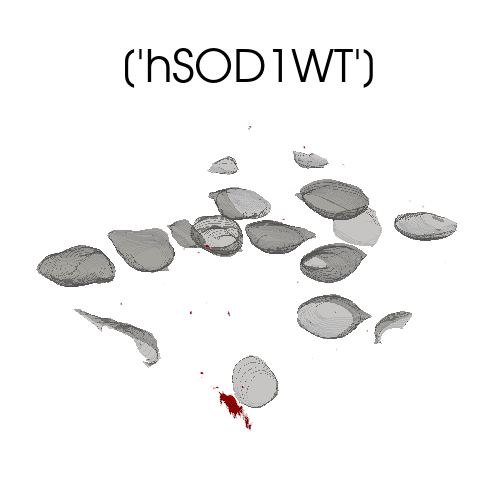

Protein Volume Inside Cells'
0    0.003136
1    0.003136
2    0.003136
3    0.018814
4    0.003136
5    0.003136
6    0.031357
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.263398
2      0.006271
3      0.003136
4      0.006271
         ...   
512    0.003136
513    0.009407
514    0.003136
515    0.003136
516    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 517, dtype: float64
Cell Volume
0     1125.737238
1      154.730546
2      230.156396
3     1223.429612
4     1820.314179
5     2268.046590
6     1055.341032
7     1504.682051
8     2117.245061
9      220.824588
10     576.907096
11    1652.495269
12     378.349032
13    1270.151369
14     223.474244
15     342.514385
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    118643.91493
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
429    MS304-9_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(35, 1024,

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


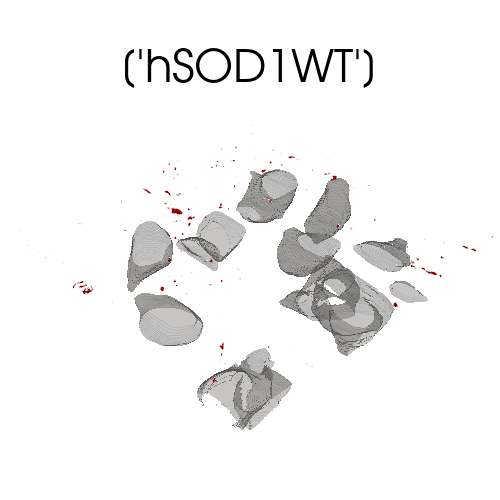

Protein Volume Inside Cells'
0     0.003136
1     0.015678
2     0.006271
3     0.053307
4     0.003136
5     0.003136
6     0.028221
7     0.003136
8     0.009407
9     0.003136
10    0.003136
11    0.028221
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.003136
2      0.028221
3      0.003136
4      0.037628
         ...   
517    0.147377
518    0.009407
519    0.006271
520    0.009407
521    0.040764
Name: Proten_Volume_Voxel_Resolved, Length: 522, dtype: float64
Cell Volume
0     1995.514500
1      621.079539
2     1344.272773
3     1310.344624
4      986.512671
5      381.418871
6     1187.369194
7     1320.770788
8      975.747853
9      257.364765
10    1176.591833
11     184.660693
12     490.261753
13    1138.559068
14     507.511175
15     296.604770
16      68.389365
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    100837.293487
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Ima

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


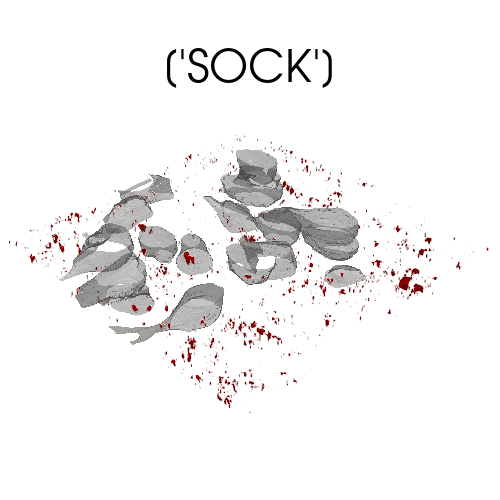

Protein Volume Inside Cells'
0     0.021950
1     0.031357
2     0.003136
3     0.078392
4     0.012543
5     0.021950
6     0.003136
7     0.028221
8     0.050171
9     0.009407
10    0.028221
11    0.003136
12    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.025086
1       0.003136
2       1.138255
3       0.003136
4       0.009407
          ...   
2411    0.043900
2412    0.018814
2413    0.084664
2414    0.021950
2415    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 2416, dtype: float64
Cell Volume
0     1471.735373
1      659.689271
2      763.985405
3      878.946015
4      775.800679
5      571.610918
6      629.875145
7      201.367641
8     1292.352044
9      994.988437
10     202.041814
11    1443.661554
12     341.617578
13    1175.293658
14     816.492508
15     680.416172
16     697.944670
17     625.366025
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    67977.006325
Name: Void_Volume_Voxel_Resolv

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


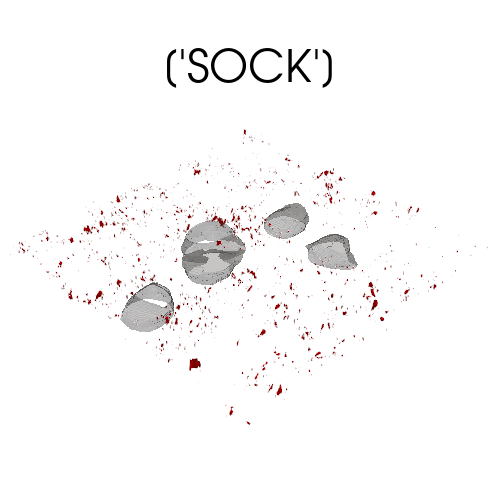

Protein Volume Inside Cells'
0     0.068985
1     0.031357
2     0.028221
3     0.021950
4     0.100342
5     0.009407
6     0.034493
7     0.216363
8     0.006271
9     0.003136
10    0.018814
11    0.003136
12    0.003136
13    0.006271
14    0.003136
15    0.006271
16    0.003136
17    0.031357
18    0.003136
19    0.006271
20    0.021950
21    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       1.059863
1       0.003136
2       0.072121
3       3.007125
4       0.003136
          ...   
2889    0.015678
2890    0.003136
2891    0.003136
2892    0.003136
2893    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 2894, dtype: float64
Cell Volume
0    1244.974927
1     810.315201
2    1029.352447
3     638.551595
4     670.695538
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    77806.301523
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
439    MS310-1_Python
Name: IMAGE_ID, dtype:

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


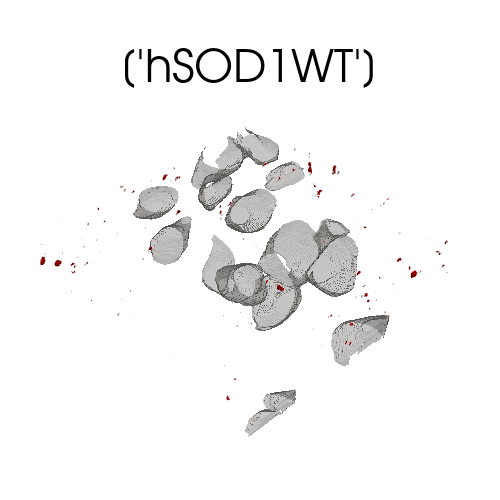

Protein Volume Inside Cells'
0    0.003136
1    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.476625
1      0.018814
2      0.003136
3      0.003136
4      0.009407
         ...   
341    0.006271
342    0.021950
343    0.003136
344    0.031357
345    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 346, dtype: float64
Cell Volume
0     1571.908076
1     1113.743230
2     2022.105138
3     1172.026271
4      337.506690
5      912.262704
6      724.776756
7      112.094591
8       64.171864
9     1501.339407
10     950.050886
11     729.759365
12     792.655004
13     355.841061
14      97.924415
15    2061.113102
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    77544.935619
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
442    MS310-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(33, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


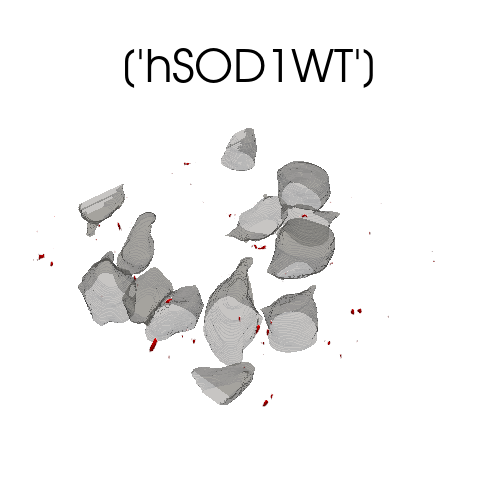

Protein Volume Inside Cells'
0    0.012543
1    0.006271
2    0.043900
3    0.021950
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.056442
1      0.053307
2      0.018814
3      0.006271
4      0.003136
         ...   
138    0.003136
139    0.003136
140    0.003136
141    0.269669
142    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 143, dtype: float64
Cell Volume
0      897.339963
1     2256.758111
2     1308.184135
3     2126.589412
4     1078.965309
5     1980.030470
6      737.074926
7      943.751288
8      679.905055
9     2367.545120
10     465.179381
11     683.169306
12     865.835701
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    92113.924247
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
445    MS311-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(17, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8]


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


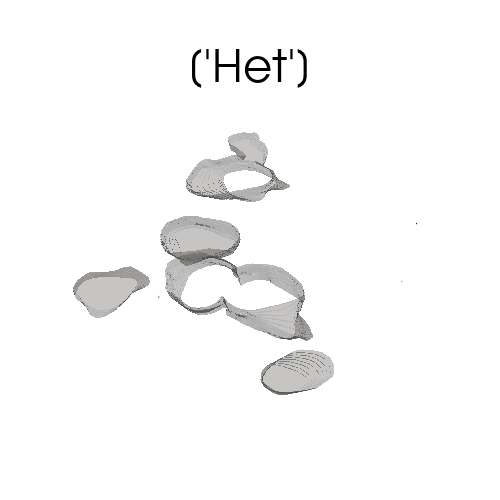

Protein Volume Inside Cells'
0    0.003136
1    0.006271
2    0.009407
3    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.062714
1    0.025086
2    0.062714
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1050.116975
1     322.756412
2    1168.448450
3    1590.844498
4     233.941172
5    1519.112489
6     259.158379
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    49751.75166
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
448    MS312-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(16, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


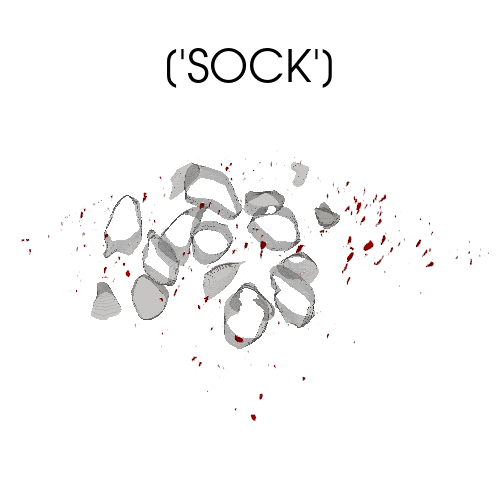

Protein Volume Inside Cells'
0    0.047035
1    0.003136
2    0.006271
3    0.006271
4    0.006271
5    0.012543
6    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.006271
1       0.460946
2       0.084664
3       0.178734
4       0.003136
          ...   
1092    0.003136
1093    0.003136
1094    0.021950
1095    0.003136
1096    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 1097, dtype: float64
Cell Volume
0     1562.704830
1     1139.358669
2      831.869924
3      871.790373
4      759.940367
5     1212.009434
6      185.043247
7      886.750743
8      320.589651
9      299.107050
10     816.225974
11      49.098610
12     220.902980
13     179.728255
14     488.283134
15     313.597066
16     109.344592
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    42361.77749
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
451    MS312-7_Python
Name: IMAGE_ID, dtype: object
shap

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


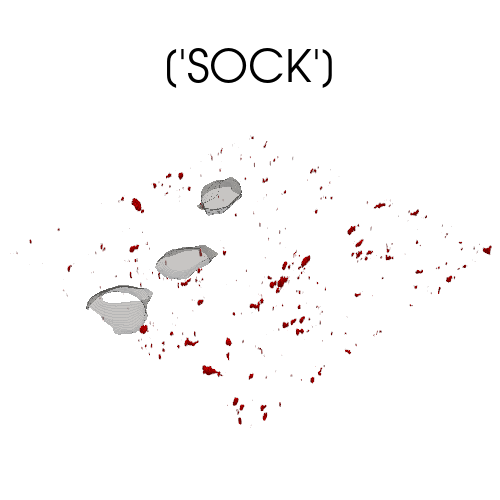

Protein Volume Inside Cells'
0     1.382839
1     0.279076
2     0.128563
3     0.034493
4     0.153649
5     0.009407
6     0.068985
7     0.056442
8     0.028221
9     0.043900
10    0.015678
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.012543
1      0.003136
2      0.003136
3      0.003136
4      0.015678
         ...   
961    0.006271
962    0.003136
963    0.003136
964    0.003136
965    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 966, dtype: float64
Cell Volume
0    734.789010
1    534.562759
2    984.562273
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    53642.215995
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
454    MS313-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8 9]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


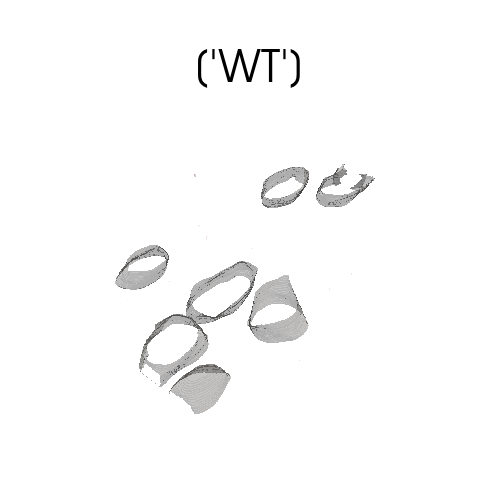

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0     0.062714
1     0.009407
2     0.028221
3     0.006271
4     0.012543
        ...   
67    0.112885
68    0.003136
69    0.009407
70    0.003136
71    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 72, dtype: float64
Cell Volume
0     886.189455
1     184.892734
2    1082.066505
3     777.675820
4    1423.141609
5    1088.259490
6     429.213035
7    1346.778188
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    58541.936149
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
457    MS313-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


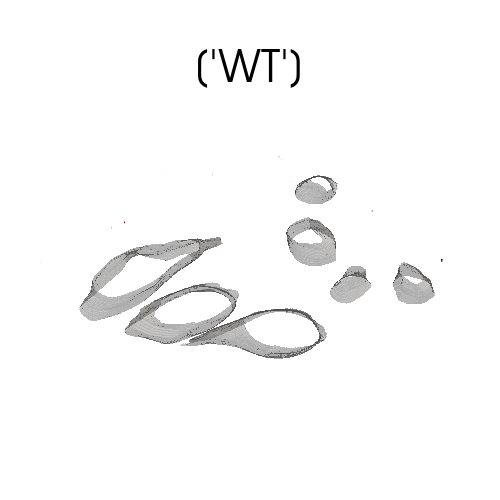

Protein Volume Inside Cells'
0    0.009407
1    0.003136
2    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.015678
1     0.003136
2     0.031357
3     0.025086
4     0.031357
5     0.034493
6     0.075257
7     0.018814
8     0.009407
9     0.003136
10    0.009407
11    0.194413
12    0.043900
13    0.012543
14    0.040764
15    0.009407
16    0.097206
17    0.031357
18    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    2486.390848
1    1905.962373
2     890.936887
3    1793.670234
4     260.393840
5     444.242389
6     555.007448
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    57423.548965
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
461    MS314-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(23, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


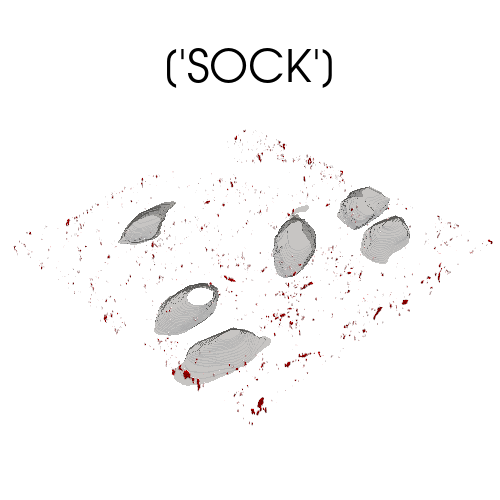

Protein Volume Inside Cells'
0    0.003136
1    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.426454
1       0.545610
2       0.090935
3       0.006271
4       0.056442
          ...   
3325    0.009407
3326    0.003136
3327    0.009407
3328    0.015678
3329    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 3330, dtype: float64
Cell Volume
0    1205.546780
1     619.213805
2    1451.212292
3    1016.894356
4     803.401008
5     843.638163
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    69684.269528
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
464    MS314-9_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(21, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 13 14 15 16]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


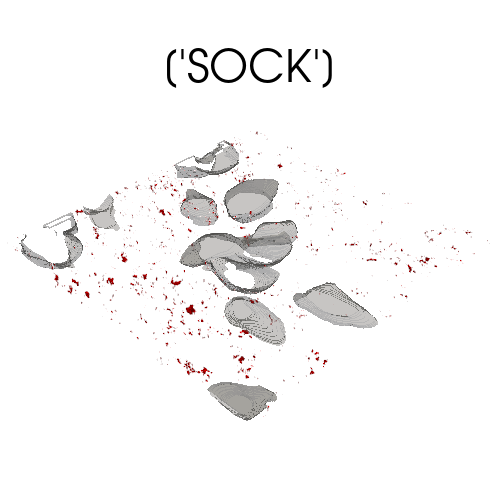

Protein Volume Inside Cells'
0     0.031357
1     0.012543
2     0.310433
3     0.003136
4     0.003136
5     0.009407
6     0.012543
7     0.021950
8     0.131699
9     0.147377
10    0.313569
11    0.009407
12    0.006271
13    0.003136
14    0.009407
15    0.003136
16    0.003136
17    0.028221
18    0.003136
19    0.012543
20    0.015678
21    0.015678
22    0.159920
23    0.006271
24    0.009407
25    0.040764
26    0.003136
27    0.006271
28    0.003136
29    0.003136
30    0.031357
31    0.062714
32    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.003136
1       0.003136
2       0.006271
3       0.021950
4       0.003136
          ...   
2521    0.003136
2522    0.003136
2523    0.009407
2524    0.018814
2525    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 2526, dtype: float64
Cell Volume
0      554.483788
1     1458.687773
2     1198.419361
3      654.283344
4     1009.917450
5     1446.166969
6      191.556072
7      

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


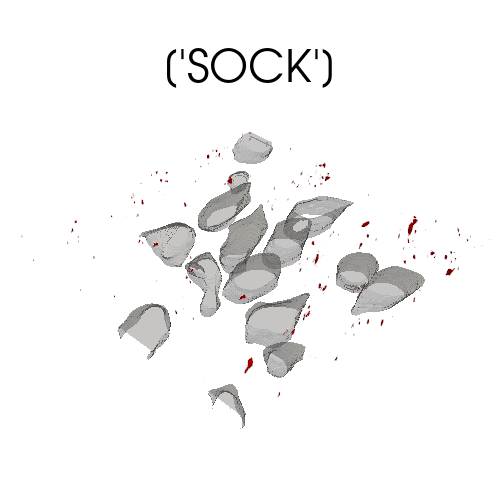

Protein Volume Inside Cells'
0    0.003136
1    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.448403
1      0.075257
2      0.119156
3      0.464082
4      0.021950
         ...   
734    0.003136
735    0.003136
736    0.003136
737    0.006271
738    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 739, dtype: float64
Cell Volume
0     1327.365141
1     1079.187943
2     1131.252914
3     1234.981488
4      624.886265
5       65.002822
6     1024.830784
7      749.733701
8     1088.529159
9      262.836541
10     919.622165
11     308.360466
12     991.256968
13    1099.707888
14     199.210287
15     684.031621
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    66121.387429
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
471    MS315-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(27, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7]
VoxelSize(x=0.102236465

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


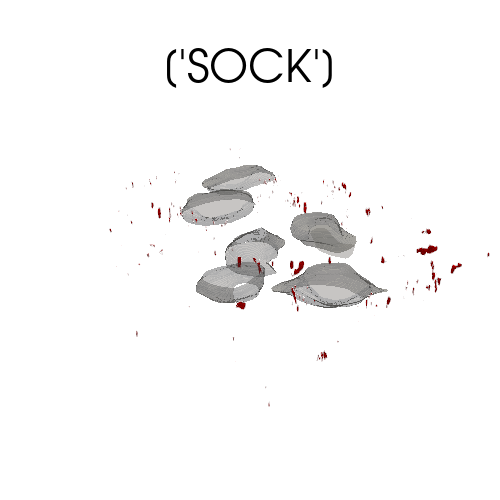

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0      0.159920
1      0.003136
2      0.081528
3      0.150513
4      0.043900
         ...   
713    0.003136
714    0.003136
715    0.012543
716    0.003136
717    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 718, dtype: float64
Cell Volume
0    1805.755177
1    1159.913106
2    1307.547590
3    1411.062937
4    1001.695674
5     682.570390
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    81407.661654
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
475    MS316-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(31, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


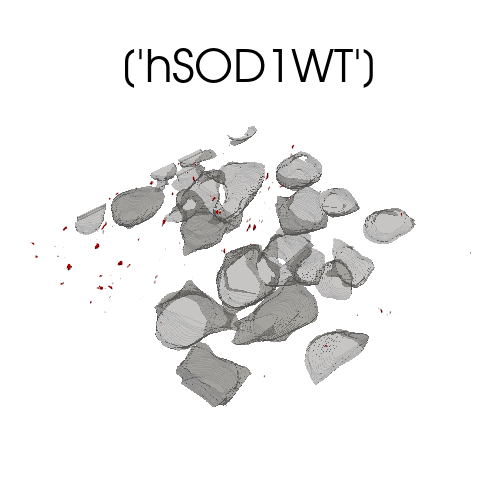

Protein Volume Inside Cells'
0    0.012543
1    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.012543
2      0.003136
3      0.680444
4      0.021950
         ...   
222    0.015678
223    0.003136
224    0.003136
225    0.028221
226    0.012543
Name: Proten_Volume_Voxel_Resolved, Length: 227, dtype: float64
Cell Volume
0      177.185211
1      138.870234
2      165.501636
3     1249.979486
4      192.208295
5      268.577987
6     2376.792265
7     1496.015008
8      247.829136
9     1424.477412
10     268.841385
11    1098.713875
12     550.100096
13    1578.781505
14    2766.087986
15    1651.946523
16     681.943252
17     486.150865
18     443.972720
19    1612.543462
20     375.909467
21     614.071276
22    1052.101866
23    2124.410109
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    78885.226068
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
478    MS31

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


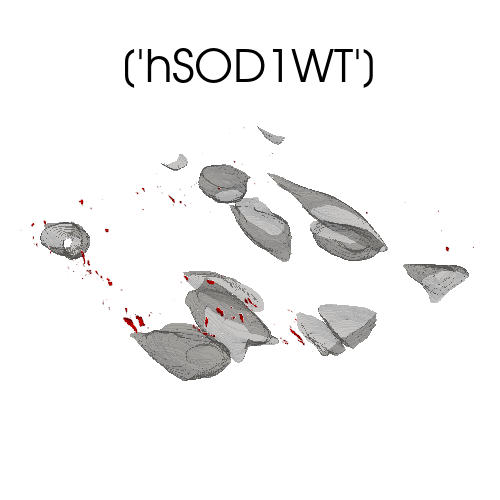

Protein Volume Inside Cells'
0     0.003136
1     0.025086
2     0.003136
3     0.018814
4     0.034493
5     0.031357
6     0.084664
7     0.003136
8     0.266534
9     0.003136
10    0.003136
11    0.040764
12    0.009407
13    0.329247
14    0.003136
15    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      1.169612
1      0.006271
2      0.006271
3      0.583238
4      0.006271
         ...   
450    0.006271
451    0.006271
452    0.087799
453    0.028221
454    0.050171
Name: Proten_Volume_Voxel_Resolved, Length: 455, dtype: float64
Cell Volume
0       60.267932
1     1800.665955
2     1610.245003
3     1866.687875
4     1599.859603
5      330.887252
6     2014.808391
7     1880.654232
8      923.695424
9      125.988826
10     595.332402
11     307.325689
12    1913.895665
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    119777.99937
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from fold

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


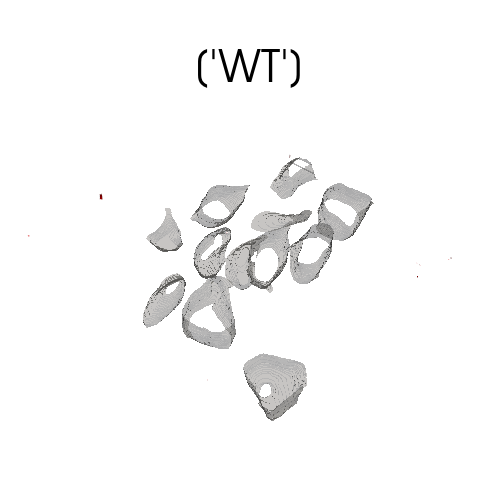

Protein Volume Inside Cells'
0    0.068985
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.928164
1    0.109749
2    0.037628
3    0.062714
4    0.040764
5    0.084664
6    0.059578
7    0.034493
8    0.062714
9    0.065849
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     1510.865629
1     1090.012340
2     1173.324446
3      362.996702
4      136.747373
5      505.165680
6     1243.730059
7      786.029294
8     1115.345567
9      297.554884
10     660.391665
11     808.988805
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    56069.000541
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
484    MS318-7_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(25, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


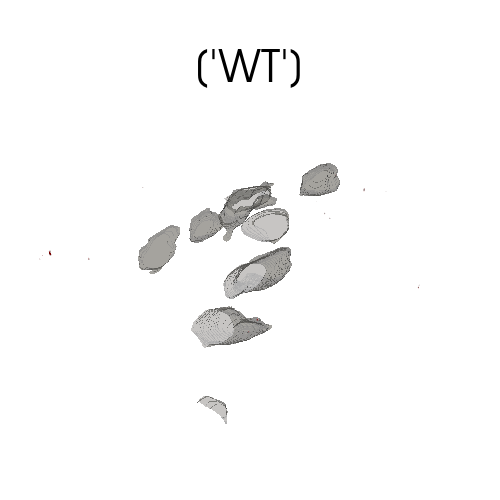

Protein Volume Inside Cells'
0    0.034493
1    0.147377
2    0.047035
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.056442
1     0.442132
2     0.018814
3     0.040764
4     0.031357
5     0.021950
6     0.012543
7     0.025086
8     0.003136
9     0.003136
10    0.006271
11    0.009407
12    0.031357
13    0.003136
14    0.150513
15    0.018814
16    0.025086
17    0.087799
18    0.028221
19    0.003136
20    0.012543
21    0.012543
22    0.028221
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     488.229827
1     681.416456
2     337.939415
3     382.626111
4    1070.467593
5     608.953832
6      46.047585
7      48.697242
8     252.300628
9     273.190585
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    78010.321956
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
487    MS319-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of u

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


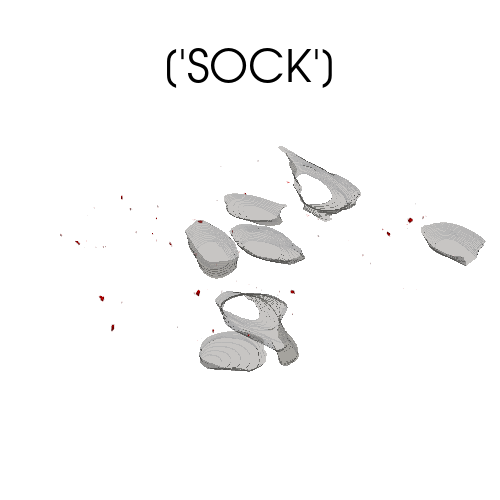

Protein Volume Inside Cells'
0     0.003136
1     0.003136
2     0.006271
3     0.006271
4     0.003136
5     0.003136
6     0.003136
7     0.225770
8     0.028221
9     0.031357
10    0.003136
11    0.003136
12    0.009407
13    0.006271
14    0.018814
15    0.156784
16    0.003136
17    0.012543
18    0.018814
19    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.006271
2      0.003136
3      0.003136
4      0.043900
         ...   
166    0.021950
167    0.156784
168    0.043900
169    0.053307
170    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 171, dtype: float64
Cell Volume
0    2181.288362
1     907.741042
2     432.765770
3     801.275012
4    1431.774159
5     428.984129
6     744.039290
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    58832.285221
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
490    MS319-4_Python
Name: IMAGE_ID, dtype: object


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


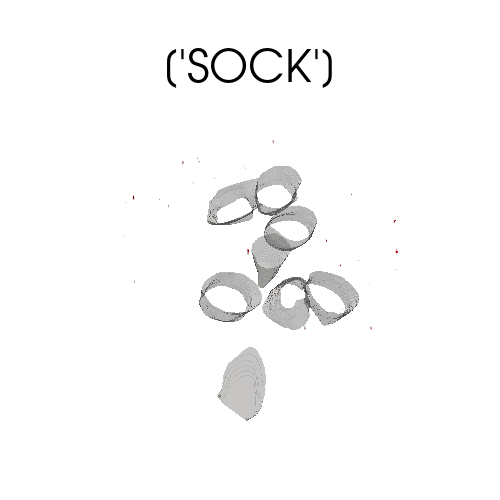

Protein Volume Inside Cells'
0    0.015678
1    0.050171
2    0.003136
3    0.018814
4    0.025086
5    0.025086
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.009407
1     0.003136
2     0.285348
3     0.006271
4     0.006271
        ...   
72    0.003136
73    0.018814
74    0.006271
75    0.075257
76    0.021950
Name: Proten_Volume_Voxel_Resolved, Length: 77, dtype: float64
Cell Volume
0    1479.173226
1    1302.110306
2     502.729250
3    1193.941597
4    1277.175312
5     253.514140
6    1065.538291
7     881.090825
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    57804.880037
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
493    MS320-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(16, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


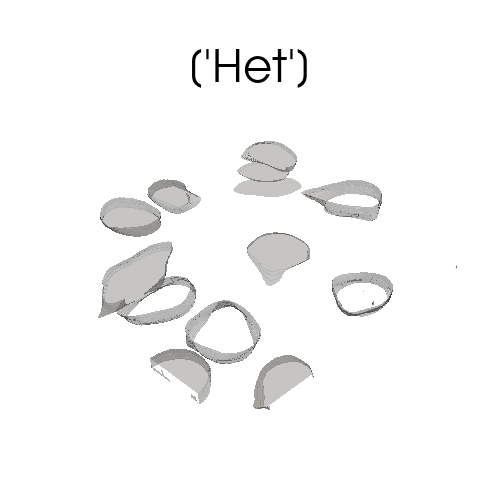

Protein Volume Inside Cells'
0    0.003136
1    0.034493
2    0.112885
3    0.232041
4    0.056442
5    0.006271
6    0.009407
7    0.031357
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.003136
1    0.100342
2    0.009407
3    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     2148.031250
1     1384.582048
2     1060.364405
3      940.333387
4      335.920032
5      499.085580
6      309.069132
7      836.745919
8      538.993487
9       55.736862
10     140.115103
11     384.244127
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    43974.901055
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
496    MS320-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


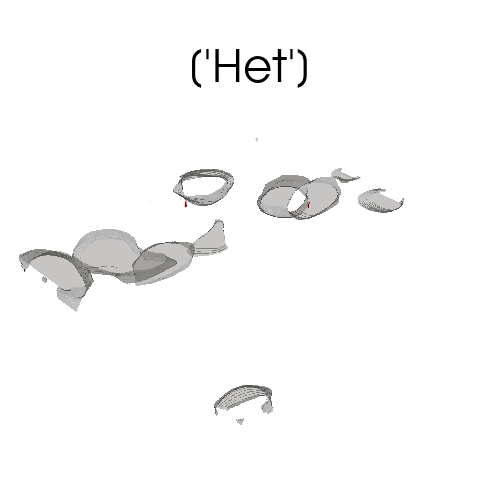

Protein Volume Inside Cells'
0    0.015678
1    0.649088
2    0.065849
3    0.021950
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.799601
1     0.003136
2     0.031357
3     0.012543
4     0.003136
5     0.003136
6     0.021950
7     0.257126
8     0.003136
9     0.003136
10    0.003136
11    0.003136
12    0.003136
13    0.003136
14    0.003136
15    0.003136
16    0.003136
17    0.003136
18    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      72.857721
1     327.362738
2     742.211184
3    1186.334417
4     129.046122
5    1261.807303
6    1492.650415
7     464.034855
8    1398.946637
9     630.668475
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    58054.233118
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
499    MS321-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(18, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


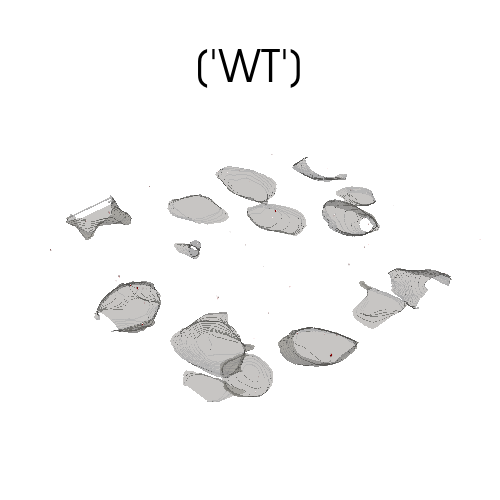

Protein Volume Inside Cells'
0     0.147377
1     0.003136
2     0.034493
3     0.015678
4     0.003136
5     0.021950
6     0.009407
7     0.034493
8     0.169327
9     0.012543
10    0.009407
11    0.040764
12    0.037628
13    0.025086
14    0.006271
15    0.075257
16    0.021950
17    0.015678
18    0.015678
19    0.090935
20    0.050171
21    0.003136
22    0.012543
23    0.009407
24    0.003136
25    0.003136
26    0.003136
27    0.003136
28    0.003136
29    0.003136
30    0.257126
31    0.006271
32    0.003136
33    0.015678
34    0.003136
35    0.003136
36    0.009407
37    0.059578
38    0.006271
39    0.003136
40    0.012543
41    0.003136
42    0.021950
43    0.006271
44    0.003136
45    0.003136
46    0.003136
47    0.003136
48    0.053307
49    0.003136
50    0.028221
51    0.031357
52    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.018814
1      0.025086
2      0.050171
3      0.009407
4      0.072121
         ...   
1

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


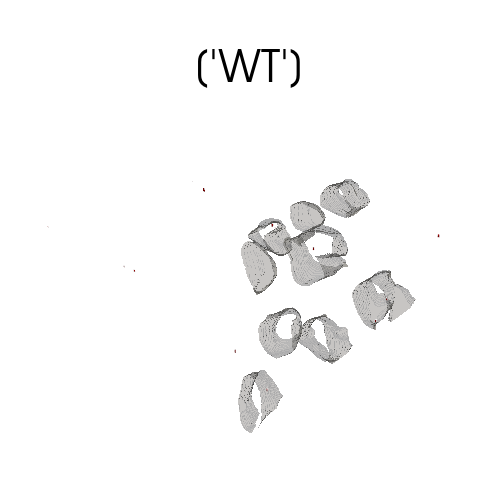

Protein Volume Inside Cells'
0    0.351197
1    0.040764
2    0.282212
3    0.122292
4    0.003136
5    0.094071
6    0.012543
7    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.501710
1     0.153649
2     0.078392
3     0.150513
4     0.009407
5     0.037628
6     0.025086
7     0.053307
8     0.112885
9     0.003136
10    0.313569
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0     666.509394
1     259.255585
2     551.128601
3     785.035281
4     513.509747
5     273.058886
6     573.407668
7     564.935038
8     123.985121
9     558.795360
10    400.527757
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    50625.981599
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
506    MS324-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(18, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8 9]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


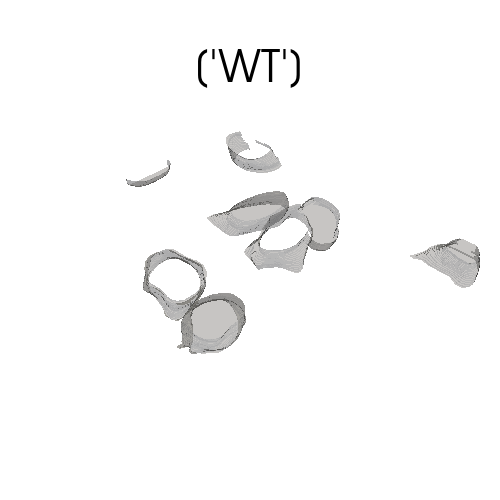

Protein Volume Inside Cells'
0    0.012543
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0    0.015678
1    0.031357
2    0.003136
3    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    1517.174634
1     599.543631
2    1485.673508
3    1119.594424
4     585.803044
5    1082.342446
6     913.642407
7     214.716266
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    51665.647325
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
509    MS324-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


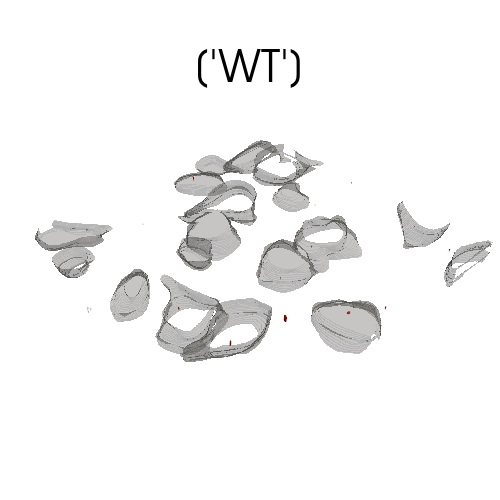

Protein Volume Inside Cells'
0    0.410775
1    0.053307
2    0.028221
3    0.062714
4    0.097206
5    0.106613
6    0.426454
7    0.047035
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.442132
1     0.037628
2     1.332668
3     0.065849
4     0.050171
5     0.172463
6     0.037628
7     0.103478
8     0.053307
9     0.163056
10    0.175599
11    0.053307
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0      433.138917
1      230.369623
2      513.766874
3     1525.901255
4     1195.681905
5      673.097475
6     1496.174928
7     1488.040953
8      406.852440
9      638.934149
10    1661.315961
11    1127.740943
12     287.461103
13    1573.780082
14     866.199441
15     977.365868
16     521.922799
17     837.012453
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    49305.395817
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
513    MS325-1_Python
Name: IMAGE_ID, dtype:

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


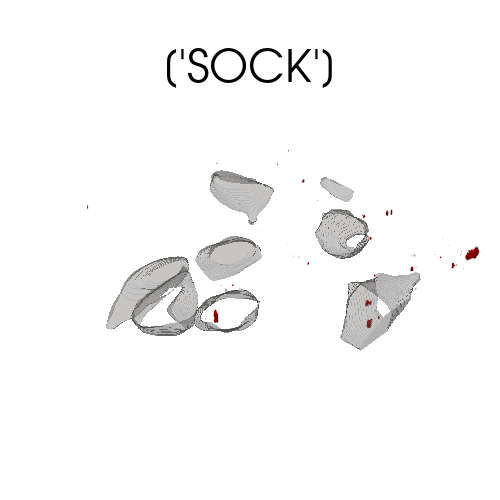

Protein Volume Inside Cells'
0     0.003136
1     2.119725
2     0.015678
3     4.540477
4     0.047035
5     0.253991
6     3.047889
7     0.003136
8     0.003136
9     0.003136
10    0.003136
11    0.006271
12    0.034493
13    0.003136
14    0.003136
15    0.003136
16    0.006271
17    0.003136
18    0.003136
19    0.003136
20    0.003136
21    0.003136
22    0.003136
23    0.062714
24    0.003136
25    0.100342
26    0.003136
27    0.003136
28    0.003136
29    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.188141
1      0.003136
2      0.009407
3      0.003136
4      0.003136
         ...   
162    0.003136
163    0.003136
164    0.003136
165    0.012543
166    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 167, dtype: float64
Cell Volume
0    1434.524158
1     982.658910
2     799.277578
3     702.265649
4    1746.202182
5    1314.957222
6    1631.740147
7      74.024197
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void 

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


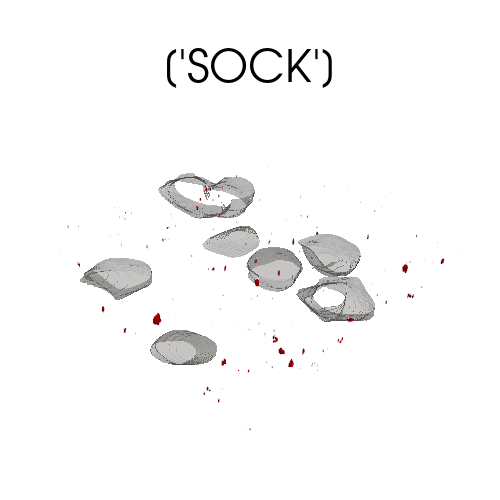

Protein Volume Inside Cells'
0     0.608324
1     0.137970
2     0.037628
3     0.009407
4     0.006271
5     0.025086
6     0.253991
7     0.489167
8     0.144242
9     0.009407
10    0.871721
11    0.025086
12    0.238312
13    0.025086
14    0.824686
15    0.003136
16    0.006271
17    0.012543
18    0.003136
19    0.097206
20    0.197548
21    0.021950
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.021950
2      0.003136
3      0.009407
4      0.050171
         ...   
408    0.003136
409    0.006271
410    0.006271
411    0.003136
412    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 413, dtype: float64
Cell Volume
0    1024.818241
1    1020.500398
2    1526.907811
3    1280.248286
4    1985.652759
5     444.016620
6     582.588964
7     804.950039
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    73530.508113
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
521  

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


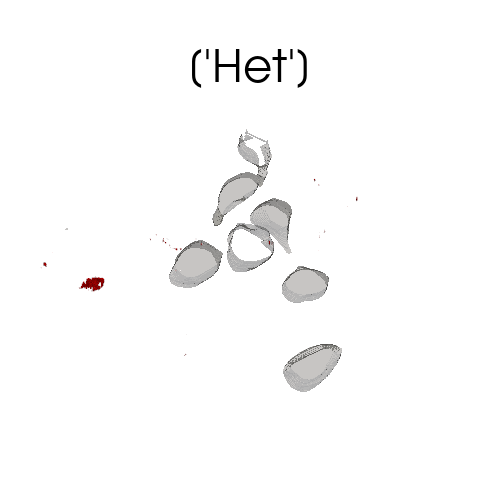

Protein Volume Inside Cells'
0    0.006271
1    0.003136
2    0.125428
3    0.003136
4    0.078392
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.015678
1     0.486032
2     0.037628
3     0.144242
4     0.059578
        ...   
87    0.003136
88    0.031357
89    0.003136
90    0.003136
91    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 92, dtype: float64
Cell Volume
0    609.025953
1    872.285812
2    683.344905
3    477.317631
4    412.374388
5    337.669746
6    543.145139
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    45384.951165
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
524    MS62-6_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(14, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8 9]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


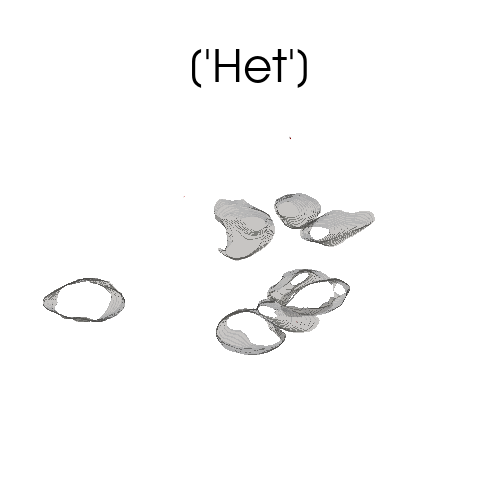

Protein Volume Inside Cells'
Series([], Name: Proten_Volume_Voxel_Resolved, dtype: float64)
Protein Volume Inside Void'
0     0.003136
1     0.040764
2     0.003136
3     0.006271
4     0.003136
5     0.003136
6     0.006271
7     0.003136
8     0.097206
9     0.059578
10    0.003136
11    0.003136
12    0.003136
13    0.003136
14    0.003136
15    0.003136
16    0.003136
17    0.003136
18    0.003136
19    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Cell Volume
0    715.611139
1    561.852656
2    352.065692
3    374.313401
4    520.220120
5    341.435708
6    351.363298
7    189.198034
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    42626.047041
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
527    MS65-3_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(32, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


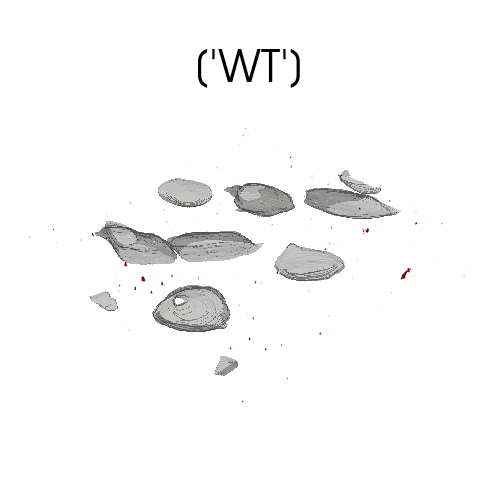

Protein Volume Inside Cells'
0     0.006271
1     0.006271
2     0.109749
3     0.006271
4     0.003136
5     0.003136
6     0.003136
7     0.003136
8     0.003136
9     0.003136
10    0.028221
11    0.003136
12    0.012543
13    0.003136
14    0.003136
15    0.003136
16    0.003136
17    0.003136
18    0.003136
19    0.006271
20    0.012543
21    0.003136
22    0.003136
23    0.003136
24    0.003136
25    0.003136
26    0.003136
27    0.003136
28    0.003136
29    0.021950
30    0.003136
31    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.730615
1      0.144242
2      1.219783
3      0.072121
4      0.122292
         ...   
752    0.003136
753    0.003136
754    0.003136
755    0.006271
756    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 757, dtype: float64
Cell Volume
0     220.115922
1     652.599480
2    1891.582106
3      36.217202
4    1608.206805
5     612.349783
6      40.647929
7    1547.189444
8    1573.206251
9    14

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


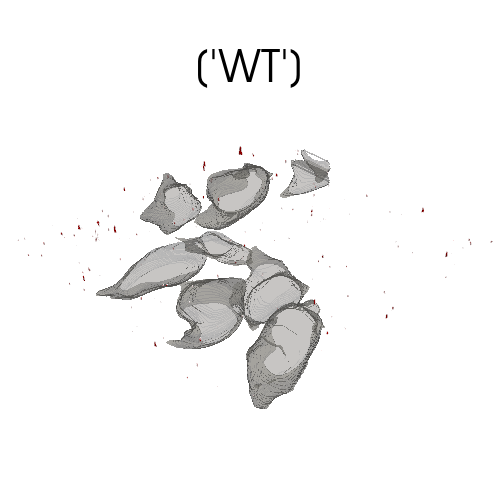

Protein Volume Inside Cells'
0     0.021950
1     0.072121
2     0.087799
3     0.003136
4     0.003136
5     0.040764
6     0.056442
7     0.003136
8     0.006271
9     0.006271
10    0.003136
11    0.003136
12    0.015678
13    0.015678
14    0.322976
15    0.009407
16    0.003136
17    0.137970
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.141106
1      0.131699
2      0.156784
3      0.025086
4      0.473489
         ...   
544    0.006271
545    0.009407
546    0.006271
547    0.003136
548    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 549, dtype: float64
Cell Volume
0    4218.385226
1     186.062345
2     588.364902
3    2290.905758
4    3859.458648
5    2360.881782
6    2947.490698
7    2131.973389
8     573.812172
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    89346.917505
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
535    MS69-3_Python
Name: IMAGE_ID, dtype: obje

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


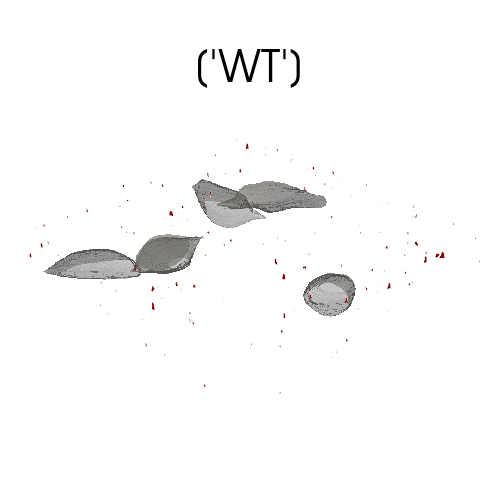

Protein Volume Inside Cells'
0     0.216363
1     0.056442
2     0.006271
3     0.003136
4     0.097206
5     0.003136
6     0.213227
7     0.003136
8     0.003136
9     0.003136
10    0.003136
11    0.003136
12    0.003136
13    0.003136
14    0.003136
15    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      1.163340
1      0.840365
2      0.015678
3      0.370011
4      0.385690
         ...   
952    0.003136
953    0.009407
954    0.003136
955    0.003136
956    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 957, dtype: float64
Cell Volume
0    1443.376206
1    3130.853216
2    1436.487099
3     172.672956
4    1458.211148
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    107438.667098
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
539    MS69-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(30, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


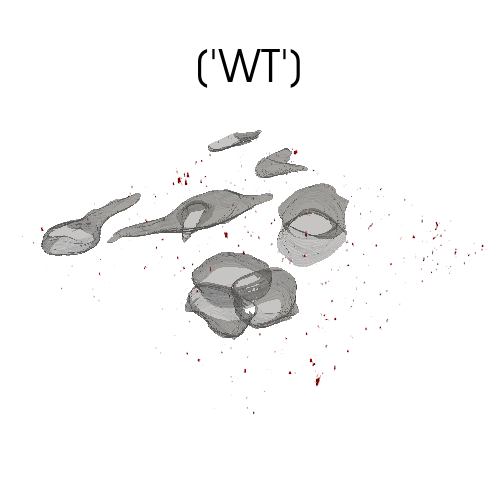

Protein Volume Inside Cells'
0     0.003136
1     0.006271
2     0.003136
3     0.087799
4     0.012543
5     0.006271
6     0.003136
7     0.031357
8     0.009407
9     0.141106
10    0.087799
11    0.109749
12    0.003136
13    0.003136
14    0.003136
15    0.006271
16    0.012543
17    0.241448
18    0.006271
19    0.003136
20    0.100342
21    0.006271
22    0.003136
23    0.028221
24    0.006271
25    0.429589
26    0.003136
27    0.003136
28    0.003136
29    0.166191
30    0.006271
31    0.003136
32    0.003136
33    0.003136
34    0.006271
35    0.003136
36    0.003136
37    0.128563
38    0.009407
39    0.003136
40    0.009407
41    0.009407
42    0.003136
43    0.003136
44    0.003136
45    0.018814
46    0.003136
47    0.633409
48    0.003136
49    0.006271
50    0.003136
51    0.379418
52    0.003136
53    0.012543
54    0.009407
55    0.012543
56    0.043900
57    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0       0.225770
1    

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


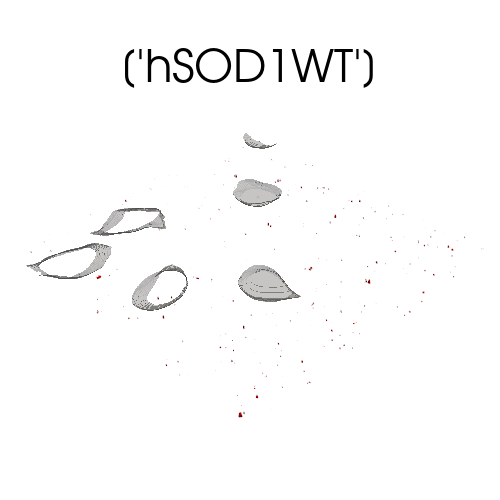

Protein Volume Inside Cells'
0     0.068985
1     0.031357
2     0.100342
3     0.194413
4     0.003136
5     0.012543
6     0.028221
7     0.003136
8     0.006271
9     0.003136
10    0.028221
11    0.003136
12    0.018814
13    0.003136
14    0.040764
15    0.040764
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.025086
2      0.037628
3      0.034493
4      0.059578
         ...   
367    0.040764
368    0.003136
369    0.003136
370    0.009407
371    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 372, dtype: float64
Cell Volume
0    526.353527
1    689.051858
2    852.656403
3    693.143931
4    491.675949
5    175.099979
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    36028.110145
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
546    MS70-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(16, 1024, 1024)
Number of unique cells:
[0 2 3 4 5]


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


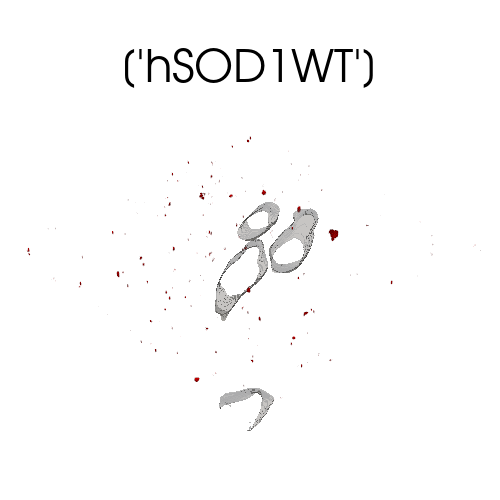

Protein Volume Inside Cells'
0    0.147377
1    0.244584
2    0.003136
3    0.391961
4    0.003136
5    0.068985
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.304162
1      0.003136
2      0.301026
3      0.203820
4      0.034493
         ...   
375    0.003136
376    0.003136
377    0.003136
378    0.006271
379    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 380, dtype: float64
Cell Volume
0     418.614408
1     603.629433
2    1268.865737
3    1151.873201
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    49165.139608
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
549    MS71-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(20, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7 8 9]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


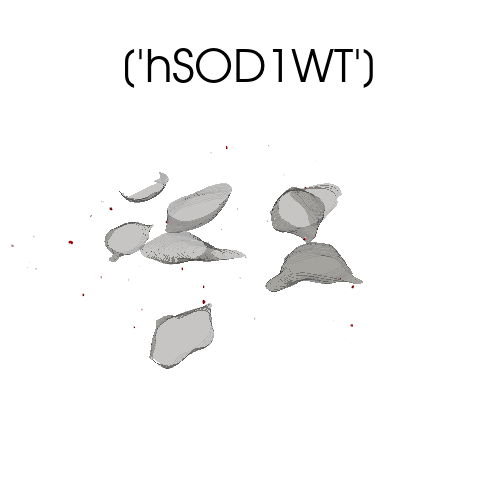

Protein Volume Inside Cells'
0    0.003136
1    0.018814
2    0.009407
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.009407
1     0.040764
2     0.050171
3     0.119156
4     0.787058
        ...   
87    0.006271
88    0.015678
89    0.021950
90    0.090935
91    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 92, dtype: float64
Cell Volume
0     847.633030
1     360.575950
2     991.746135
3    1458.756758
4     236.559472
5    1176.651411
6     740.442656
7     494.068479
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    59453.719093
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
552    MS71-4_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(26, 1024, 1024)
Number of unique cells:
[0 2 3 4 5 6 7]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


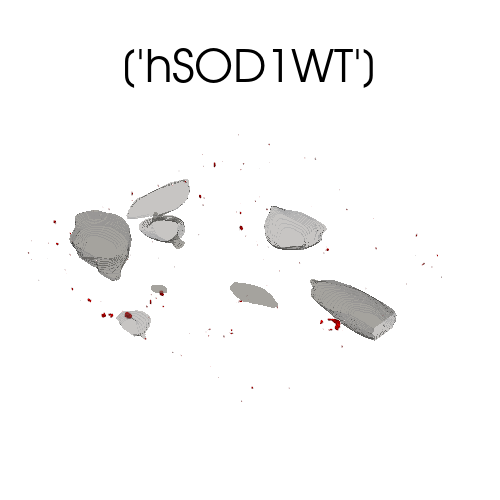

Protein Volume Inside Cells'
0    0.003136
1    0.047035
2    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.003136
2      0.003136
3      0.003136
4      0.141106
         ...   
283    0.047035
284    0.037628
285    0.003136
286    0.037628
287    0.009407
Name: Proten_Volume_Voxel_Resolved, Length: 288, dtype: float64
Cell Volume
0     901.987053
1     591.058458
2    1859.779954
3      89.053552
4    1463.469698
5     266.828273
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    80316.021892
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
555    MS74-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(25, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


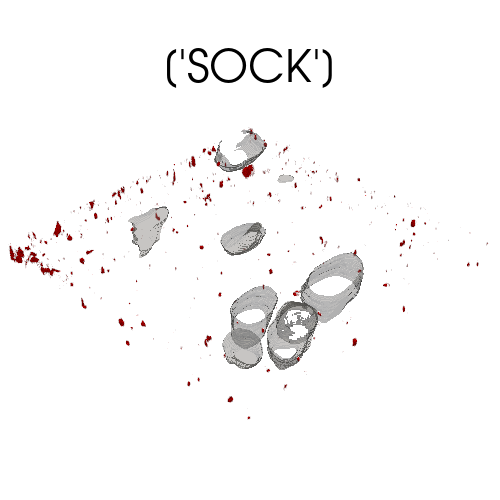

Protein Volume Inside Cells'
0     0.012543
1     0.003136
2     0.003136
3     0.003136
4     0.003136
        ...   
56    0.006271
57    0.012543
58    0.034493
59    0.009407
60    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 61, dtype: float64
Protein Volume Inside Void'
0       0.006271
1       1.984891
2       0.003136
3       0.094071
4       0.003136
          ...   
3137    0.003136
3138    0.006271
3139    0.003136
3140    0.003136
3141    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 3142, dtype: float64
Cell Volume
0    1779.029705
1     343.959937
2     661.351186
3    1112.689638
4    1920.179585
5    1042.268347
6     588.026247
7      13.022514
8     324.449684
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    74415.214387
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
558    MS74-5_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(30, 1024, 1024)
Number of unique cells:
[0 2 3 4 5]
Vo

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


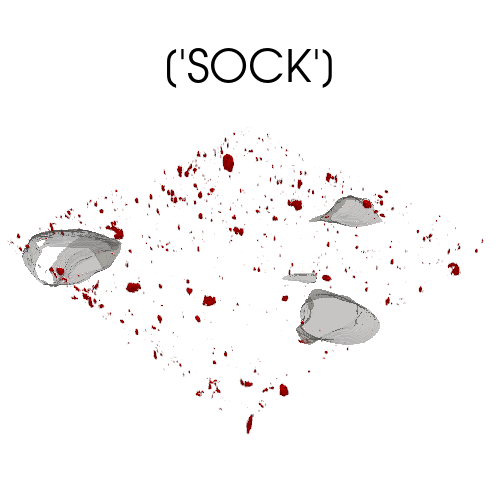

Protein Volume Inside Cells'
0     0.031357
1     0.181870
2     1.200969
3     0.025086
4     1.141391
        ...   
56    0.043900
57    0.003136
58    0.156784
59    0.003136
60    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 61, dtype: float64
Protein Volume Inside Void'
0       0.467218
1       0.395097
2       0.740022
3       0.279076
4       0.025086
          ...   
4395    0.003136
4396    0.003136
4397    0.003136
4398    0.003136
4399    0.006271
Name: Proten_Volume_Voxel_Resolved, Length: 4400, dtype: float64
Cell Volume
0    3329.345430
1     669.961787
2    1330.356588
3      32.598617
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    93277.967056
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
561    MS80-2_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(29, 1024, 1024)
Number of unique cells:
[ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
VoxelSize(x=0.1022364652365585, y=0.1022364652365585

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


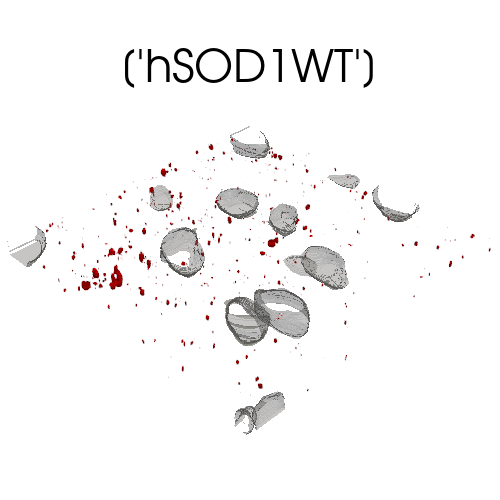

Protein Volume Inside Cells'
0     0.003136
1     0.009407
2     0.031357
3     0.003136
4     0.025086
5     0.065849
6     0.028221
7     0.037628
8     0.006271
9     0.018814
10    0.025086
11    0.009407
12    0.050171
13    0.109749
14    0.172463
15    0.072121
16    0.025086
17    0.009407
18    0.250855
19    0.094071
20    0.003136
21    0.006271
22    0.043900
23    0.003136
24    0.003136
25    0.043900
26    0.018814
27    0.003136
28    0.003136
29    0.112885
30    0.291619
31    0.006271
32    1.373432
33    0.012543
34    0.037628
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      4.054445
1      1.131984
2      0.849772
3      0.034493
4      0.028221
         ...   
790    0.003136
791    0.003136
792    0.009407
793    0.003136
794    0.018814
Name: Proten_Volume_Voxel_Resolved, Length: 795, dtype: float64
Cell Volume
0      973.756690
1      130.598288
2      619.185584
3      818.182644
4     1533.674627
5      492.149437
6      

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


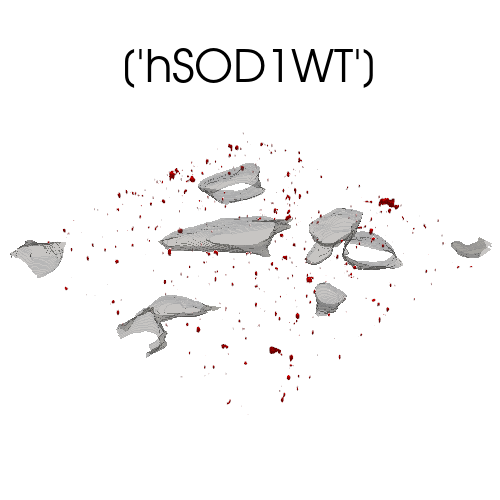

Protein Volume Inside Cells'
0     0.021950
1     0.194413
2     0.529931
3     0.087799
4     0.266534
5     1.037913
6     0.025086
7     0.025086
8     0.081528
9     0.018814
10    0.037628
11    0.238312
12    0.081528
13    0.028221
14    0.021950
15    0.021950
16    0.059578
17    0.003136
18    0.125428
19    0.294755
20    0.003136
21    0.006271
22    0.068985
23    0.018814
24    0.018814
25    0.053307
26    0.003136
27    0.068985
28    0.003136
29    0.119156
30    0.065849
31    0.172463
32    0.021950
33    0.006271
34    0.009407
35    0.006271
36    0.087799
37    0.301026
38    0.006271
39    0.003136
40    0.003136
41    0.040764
42    0.012543
43    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      6.374855
1      0.047035
2      0.658495
3      4.709804
4      0.285348
         ...   
654    0.003136
655    0.003136
656    0.031357
657    0.021950
658    0.025086
Name: Proten_Volume_Voxel_Resolved, Length: 659, dtype: 

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


VoxelSize(x=0.1022364652365585, y=0.1022364652365585, z=0.3)


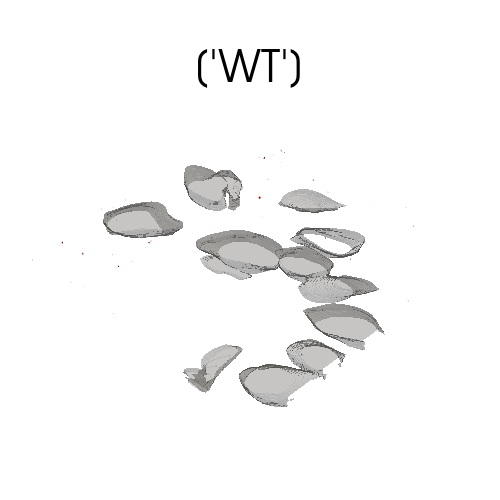

Protein Volume Inside Cells'
0     0.087799
1     0.003136
2     0.012543
3     0.003136
4     0.072121
5     0.003136
6     0.003136
7     0.006271
8     0.009407
9     0.003136
10    0.012543
11    0.040764
12    0.006271
13    0.003136
14    0.015678
15    0.021950
16    0.009407
17    0.006271
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.040764
1      0.015678
2      0.006271
3      0.006271
4      0.006271
         ...   
206    0.003136
207    0.009407
208    0.003136
209    0.015678
210    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 211, dtype: float64
Cell Volume
0     1118.901437
1      430.150606
2     1512.709414
3      440.407442
4     1075.130362
5     1498.040663
6      848.432630
7      587.571573
8      915.730776
9      553.671645
10     933.369023
11      95.202637
12     170.311782
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    55580.522995
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On 

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


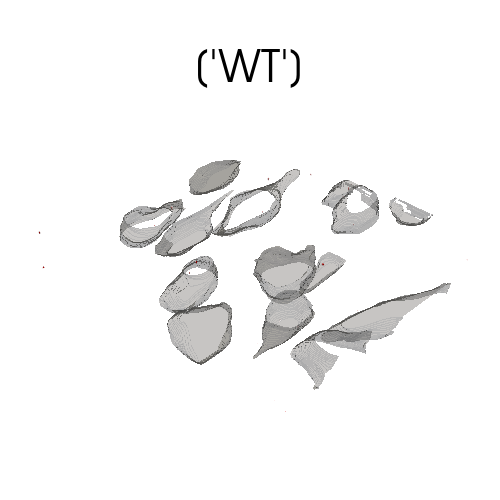

Protein Volume Inside Cells'
0     0.200684
1     0.012543
2     0.163056
3     0.006271
4     0.003136
5     0.216363
6     0.006271
7     0.047035
8     0.009407
9     0.028221
10    0.059578
11    0.144242
12    0.078392
13    0.006271
14    0.059578
15    0.043900
16    0.003136
17    0.056442
18    0.018814
19    0.003136
20    0.003136
21    0.006271
22    0.018814
23    0.003136
24    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.031357
1     0.034493
2     0.009407
3     0.163056
4     0.012543
5     0.012543
6     0.003136
7     0.009407
8     0.144242
9     0.018814
10    0.003136
11    0.003136
12    0.012543
13    0.003136
14    0.106613
15    0.003136
16    0.003136
17    0.003136
18    0.009407
19    0.003136
20    0.094071
21    0.003136
22    0.015678
23    0.003136
24    0.003136
25    0.144242
26    0.015678
27    0.003136
28    0.021950
29    0.003136
30    0.009407
31    0.012543
32    0.003136
33    0.003136
34    0

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


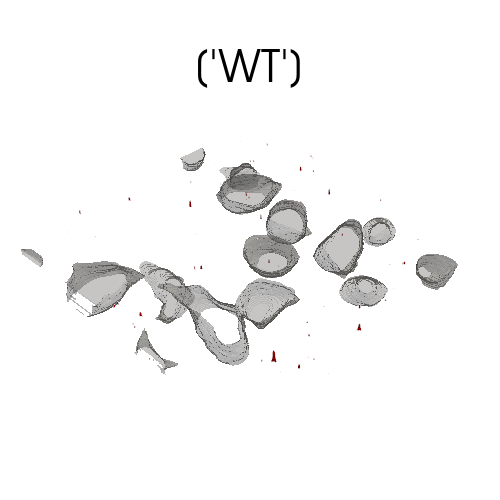

Protein Volume Inside Cells'
0    0.043900
1    0.263398
2    0.012543
3    0.250855
4    0.037628
5    0.119156
6    0.034493
7    0.147377
8    0.003136
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.391961
1      0.015678
2      0.520524
3      0.068985
4      0.094071
         ...   
110    0.050171
111    0.012543
112    0.003136
113    0.087799
114    0.021950
Name: Proten_Volume_Voxel_Resolved, Length: 115, dtype: float64
Cell Volume
0     1471.882750
1     1636.782334
2     2184.593377
3      615.422757
4     1245.658507
5     2035.478849
6     2368.918551
7     2108.151564
8       38.198957
9      209.081434
10     770.755356
11     156.646452
12     451.604986
13     653.784770
14     603.861474
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    82089.407358
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
576    MS92-8_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X, Y:
(

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


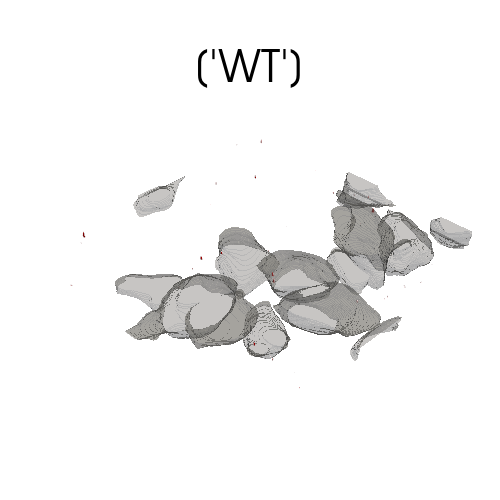

Protein Volume Inside Cells'
0     0.090935
1     0.012543
2     0.454675
3     0.003136
4     0.003136
5     0.003136
6     0.119156
7     0.006271
8     0.047035
9     0.294755
10    0.050171
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.185006
1      0.526796
2      0.018814
3      0.043900
4      0.003136
         ...   
161    0.003136
162    0.018814
163    0.003136
164    0.043900
165    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 166, dtype: float64
Cell Volume
0      772.799825
1     1905.667618
2     2164.929475
3      354.812555
4     2004.642489
5     2209.904654
6      341.799448
7      198.426365
8     1373.550696
9      745.030168
10     420.445650
11    2922.634096
12     879.096528
13     400.621827
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    85233.875733
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
579    MS94-1_Python
Name: IMAGE_ID, dtype: object
sha

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


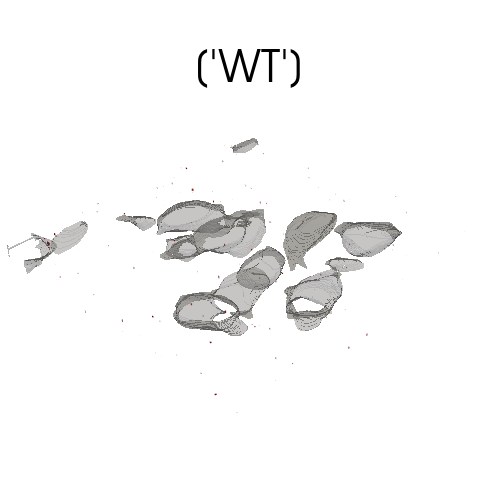

Protein Volume Inside Cells'
0     0.119156
1     0.047035
2     0.012543
3     0.012543
4     0.068985
5     0.021950
6     0.003136
7     0.003136
8     0.094071
9     0.078392
10    0.147377
11    0.006271
12    0.003136
13    0.116020
14    0.015678
15    0.043900
16    0.075257
17    0.003136
18    0.012543
19    0.018814
20    0.006271
21    0.003136
22    0.003136
23    0.065849
24    0.156784
25    0.068985
26    0.034493
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0      0.003136
1      0.003136
2      0.009407
3      0.003136
4      0.003136
         ...   
357    0.003136
358    0.003136
359    0.009407
360    0.009407
361    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 362, dtype: float64
Cell Volume
0      974.277215
1      157.483681
2      808.509045
3      387.746691
4      578.324427
5      933.375295
6       94.838897
7      849.545800
8      473.570483
9     1223.548768
10     192.518728
11     603.453835
12     606.978348
1

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


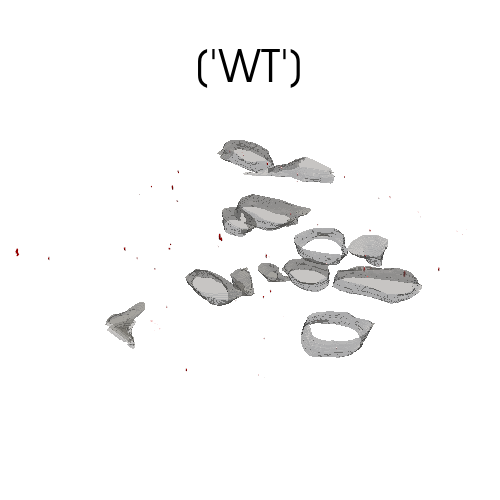

Protein Volume Inside Cells'
0     0.012543
1     0.034493
2     0.003136
3     0.047035
4     0.025086
5     0.025086
6     0.103478
7     0.003136
8     0.357468
9     0.181870
10    0.159920
11    0.018814
Name: Proten_Volume_Voxel_Resolved, dtype: float64
Protein Volume Inside Void'
0     0.112885
1     0.040764
2     0.094071
3     0.163056
4     0.006271
        ...   
73    0.003136
74    0.009407
75    0.028221
76    0.116020
77    0.025086
Name: Proten_Volume_Voxel_Resolved, Length: 78, dtype: float64
Cell Volume
0     1372.359134
1      510.044811
2     1199.783385
3      680.366001
4      768.892757
5      155.279292
6      126.788427
7      353.975326
8     1238.976355
9     1319.541598
10     169.088864
11     605.466947
12    1158.081864
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    65965.531171
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder
585    MS99-1_Python
Name: IMAGE_ID, dtype: object
shape of image Z,X

C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


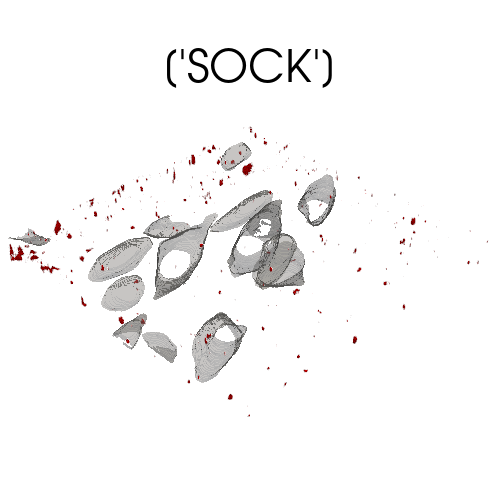

Protein Volume Inside Cells'
0      0.818415
1      0.025086
2      0.003136
3      0.090935
4      0.050171
         ...   
113    0.006271
114    0.006271
115    0.003136
116    0.003136
117    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 118, dtype: float64
Protein Volume Inside Void'
0       0.006271
1       0.072121
2       0.006271
3       0.003136
4       0.006271
          ...   
1868    0.003136
1869    0.003136
1870    0.003136
1871    0.028221
1872    0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 1873, dtype: float64
Cell Volume
0     1470.581439
1     2165.635005
2      232.853088
3     2479.250885
4      885.060607
5       85.695230
6     1259.565285
7      566.114057
8      601.788784
9       88.122252
10     365.781193
11     542.342402
12     164.328889
13     251.425771
14     635.045896
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    86846.638693
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
Images from folder


C:\Users\richa\AppData\Local\Temp\ipykernel_22212\412934641.py:27: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  nd2_img=nd2.ND2File(nd2_path[0])


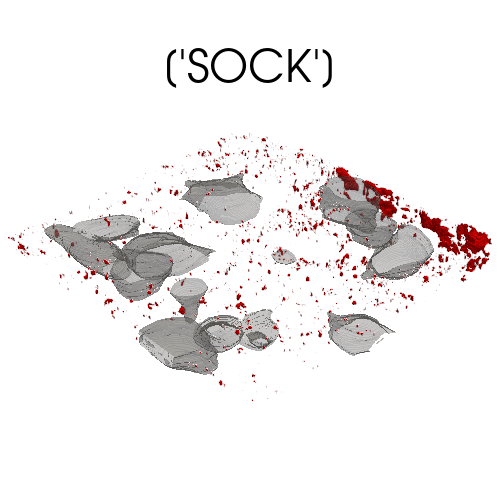

Protein Volume Inside Cells'
0     0.006271
1     0.043900
2     0.015678
3     0.012543
4     0.009407
        ...   
63    0.003136
64    0.006271
65    0.018814
66    0.003136
67    0.084664
Name: Proten_Volume_Voxel_Resolved, Length: 68, dtype: float64
Protein Volume Inside Void'
0       109.125094
1         0.288483
2         1.379703
3       146.016468
4         2.844069
           ...    
3586      0.003136
3587      0.003136
3588      0.003136
3589      0.003136
3590      0.003136
Name: Proten_Volume_Voxel_Resolved, Length: 3591, dtype: float64
Cell Volume
0     2408.895443
1     1198.707844
2      736.218883
3     1503.158107
4     2327.041432
5     1760.500922
6      855.854805
7     2232.748145
8       38.236585
9      235.505881
10    1432.341719
11     834.933491
12     773.828331
13     338.967921
Name: Cell_Volume_Voxel_Resolved, dtype: float64
Void Volume
0    104979.343513
Name: Void_Volume_Voxel_Resolved, dtype: float64
Move On to Next Image
No more images left


In [4]:
for ID in UNIQUE_ID:
    ID_BOOL=file_list.IMAGE_ID ==  ID
    SUB_DF = file_list[ID_BOOL]
    ID_TXT= ID
    
    ID_BOOL_ref=ref_df.IMAGE_ID ==  ID
    ref_sub = ref_df[ID_BOOL_ref]
    Genotype_id=ref_sub['Genotype']
    Genotype_id_string=str(np.array(Genotype_id))
    
    #Read in Cells
    cell_df = SUB_DF[SUB_DF['TEXT_1'].str.contains("cells")]
    cell_path=(cell_df.Data_Path)
    cell_path=np.array(cell_path)
    
    cell_img=tifffile.imread(cell_path[0])
    print("Images from folder")
    print(cell_df.IMAGE_ID)
    print("shape of image Z,X, Y:" )
    print(cell_img.shape)
    print("Number of unique cells:")
    print(np.unique(cell_img))
    
    nd2_df=SUB_DF[SUB_DF['TEXT_1'].str.contains("nd2")]
    nd2_path=(nd2_df.Data_Path)
    nd2_path=np.array(nd2_path)
    nd2_img=nd2.ND2File(nd2_path[0])
    
    #extract voxel size from nd2 raw file
    voxel_size=nd2_img.voxel_size()
    X_VOX_SIZE =voxel_size[0]
    Y_VOX_SIZE =voxel_size[1]
    Z_VOX_SIZE =voxel_size[2]
    print(nd2_img.voxel_size())
    
    #Read in protein 
    protein_df = SUB_DF[SUB_DF['TEXT_1'].str.contains("protein")]
    protein_path=(protein_df.Data_Path)
    protein_path=np.array(protein_path)
    protein=tifffile.imread(protein_path[0])

    #Cells are segmented indivdually, here we make them binary
    cells_binary=cell_img.copy()
    cells_binary[cells_binary !=0 ] = 1
    
    #Void is any "0" pixel in the cell 3D stack
    void_binary=cell_img.copy()
    void_binary = (void_binary == 0).astype(np.uint8)
    
    # using "*" essentially locks the object to its source, so only the protein in cells or void below
    protein_in_cell = cells_binary * protein
    protein_in_void = void_binary * protein
    
    #Create STL's using Vedo and Plot using Pyvista
    CELL_VOL = Volume(cells_binary, spacing=(Z_VOX_SIZE,Y_VOX_SIZE,X_VOX_SIZE))
    CELL_ISO = CELL_VOL.isosurface(1)
    CELL_ISO.write(ID+"CELLS.stl")
    CELL_VOL_STL=pv.read(ID+"CELLS.stl")
    
    PROTEIN_VOL = Volume(protein, spacing=(Z_VOX_SIZE,Y_VOX_SIZE,X_VOX_SIZE))
    PROTEIN_ISO =  PROTEIN_VOL.isosurface(1)
    PROTEIN_ISO.write(ID+"ALL_PROTEIN.stl")
    PROTEIN_VOL_STL=pv.read(ID+"ALL_PROTEIN.stl")

    
    CELL_PROTEIN_VOL = Volume(protein_in_cell, spacing=(Z_VOX_SIZE,Y_VOX_SIZE,X_VOX_SIZE))
    CELL_PROTEIN_ISO = CELL_PROTEIN_VOL.isosurface(1)
    CELL_PROTEIN_ISO.write(ID+"CELL_PROTEIN.stl")
    CELL_PROTEIN_STL=pv.read(ID+"CELL_PROTEIN.stl")
    
    VOID_PROTEIN_VOL = Volume(protein_in_void, spacing=(Z_VOX_SIZE,Y_VOX_SIZE,X_VOX_SIZE))
    VOID_PROTEIN_ISO = VOID_PROTEIN_VOL.isosurface(1)
    VOID_PROTEIN_ISO.write(ID+"VOID_PROTEIN.stl")
    VOID_PROTEIN_STL=pv.read(ID+"VOID_PROTEIN.stl")
    

    #Need an if else statement for when there is no protein 
    if PROTEIN_VOL_STL.n_points != 0:
        pv.set_plot_theme("document")
        p = pv.Plotter()
        p.add_mesh(CELL_VOL_STL, color="grey", opacity=0.4).rotate_y(90);
        p.add_title(Genotype_id_string)
        p.add_mesh(PROTEIN_VOL_STL, color="red", opacity=1).rotate_y(90);
        p.window_size = 500, 500
        p.show(jupyter_backend='static');
        p.screenshot(ID+Genotype_id_string+'3D_VIS.png') ;
        
    else:
        pv.set_plot_theme("document")
        p = pv.Plotter()
        p.add_mesh(CELL_VOL_STL, color="grey", opacity=0.4).rotate_y(90);
        p.add_title(Genotype_id_string)
        p.window_size = 500, 500
        p.show(jupyter_backend='static')
        p.screenshot(ID+Genotype_id_string+'3D_VIS.png') ;
    

    #use regions props to extract volume (um^3)
    Protein_Labels = label((protein_in_cell))
    PROTEIN_INFO = skimage.measure.regionprops_table(Protein_Labels, intensity_image=cell_img,  properties = ('label','area', 'intensity_max'))
    PROTEIN_INFO=pd.DataFrame(PROTEIN_INFO)
    PROTEIN_INFO.columns = ['Protein_Label', 'Protein_Area_Pixels', "Cell_Label"]
    PROTEIN_INFO['Proten_Volume_Voxel_Resolved'] = PROTEIN_INFO['Protein_Area_Pixels'] * X_VOX_SIZE *Y_VOX_SIZE*Z_VOX_SIZE
    PROTEIN_INFO["ID"] = ID
    Protein_in_Cell_Volume.append(PROTEIN_INFO)
    print("Protein Volume Inside Cells'")
    print(PROTEIN_INFO['Proten_Volume_Voxel_Resolved'])
    

    Protein_Labels_void = label((protein_in_void))
    PROTEIN_INFO_void = skimage.measure.regionprops_table(Protein_Labels_void, properties = ('label','area'))
    PROTEIN_INFO_void=pd.DataFrame(PROTEIN_INFO_void)
    PROTEIN_INFO_void.columns = ['Protein_Label', 'Protein_Area_Pixels']
    PROTEIN_INFO_void['Proten_Volume_Voxel_Resolved'] = PROTEIN_INFO_void['Protein_Area_Pixels'] * X_VOX_SIZE *Y_VOX_SIZE*Z_VOX_SIZE
    PROTEIN_INFO_void["ID"] = ID
    Protein_in_Void_Volume.append(PROTEIN_INFO_void)
    print("Protein Volume Inside Void'")
    print(PROTEIN_INFO_void['Proten_Volume_Voxel_Resolved'])
    
    
    CELL_INFO = skimage.measure.regionprops_table(cell_img,  properties = ('label','area'))
    CELL_INFO=pd.DataFrame(CELL_INFO)
    CELL_INFO.columns = ['Cell_Label', 'Cell_Area_Pixels', ]
    CELL_INFO['Cell_Volume_Voxel_Resolved'] = CELL_INFO['Cell_Area_Pixels'] * X_VOX_SIZE *Y_VOX_SIZE*Z_VOX_SIZE
    CELL_INFO["ID"] = ID
    Cell_Volume.append(CELL_INFO)
    
    print("Cell Volume")
    print(CELL_INFO['Cell_Volume_Voxel_Resolved'])
    
    VOID_INFO = skimage.measure.regionprops_table(void_binary,  properties = ('label','area'))
    VOID_INFO=pd.DataFrame(VOID_INFO)
    VOID_INFO.columns = ['Void_Label', 'Void_Area_Pixels', ]
    VOID_INFO['Void_Volume_Voxel_Resolved'] = VOID_INFO['Void_Area_Pixels'] * X_VOX_SIZE *Y_VOX_SIZE*Z_VOX_SIZE
    VOID_INFO["ID"] = ID
    Void_Volume.append(VOID_INFO)
    
    print("Void Volume")
    print(VOID_INFO['Void_Volume_Voxel_Resolved'])
    
    
    print("Move On to Next Image")

print("No more images left")    
    
    